# OBJECTIVE

Customer churn is a big problem for telecommunications companies. Indeed, their annual churn rates are usually higher than 10%. For that reason, they develop strategies to keep as many clients as possible. This is a classification project since the variable to be predicted is binary (churn or loyal customer). The goal here is to model churn probability, conditioned on the customer features.

# IMPORTING LIBRARIES

In [1]:
# importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings("ignore")

# IMPORTING DATASET

In [3]:
# import dataset

df=pd.read_csv("Churn.csv")
df

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no


# EXPLORATORY DATA ANALYSIS (EDA)

In [4]:
#Checking size of the dataset
df.shape

(5000, 21)

In [5]:
#Checking First Few rows
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [6]:
df.describe(include=['object', 'bool'])

,state,area.code,voice.plan,intl.plan,day.charge,eve.mins,churn
count,5000,5000,5000,5000,5000,5000,5000
unique,51,3,2,2,1962,1877,2
top,WV,area_code_415,no,no,26.18,Nan,no
freq,158,2495,3677,4527,10,24,4293


In [7]:
#Checking the data types and nullability of columns
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

As shown above, the data set contains 5000 observations and 21 columns. Apparently, there seem no null values but eve.mins and day.charges showing as object but it must be int so, we need to check error in these columns

In [8]:
df.isnull()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [9]:
df.isnull().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [10]:
df.nunique()

Unnamed: 0        5000
state               51
area.code            3
account.length     218
voice.plan           2
voice.messages      48
intl.plan            2
intl.mins          170
intl.calls          21
intl.charge        170
day.mins          1961
day.calls          123
day.charge        1962
eve.mins          1877
eve.calls          126
eve.charge        1659
night.mins        1853
night.calls        131
night.charge      1028
customer.calls      10
churn                2
dtype: int64

The column eve.mins and day.charge are containing object datatype
it is supposed to be numeric datatype so we are applying coerce to remove this error

In [11]:
df['eve.mins']=pd.to_numeric(df['eve.mins'],errors='coerce')
df['day.charge']=pd.to_numeric(df['day.charge'],errors='coerce')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      4993 non-null   float64
 13  eve.mins        4976 non-null   float64
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [13]:
df.isna().sum()

Unnamed: 0         0
state              0
area.code          0
account.length     0
voice.plan         0
voice.messages     0
intl.plan          0
intl.mins          0
intl.calls         0
intl.charge        0
day.mins           0
day.calls          0
day.charge         7
eve.mins          24
eve.calls          0
eve.charge         0
night.mins         0
night.calls        0
night.charge       0
customer.calls     0
churn              0
dtype: int64

by applying this we get null values in the above columns so we have to remove it.

In [14]:
df=df.dropna()
df

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.90,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223.0,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.90,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.10,171.7,92,14.59,224.4,89,10.10,0,no


In [15]:
#Checking the summary of the dataset
df.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000
mean,2508.523244,100.206681,7.754880,10.264198,4.433085,2.771851,180.306178,100.021936,30.652604,200.617368,100.174884,17.052695,200.434675,99.954518,9.019670,1.571946
std,1439.760538,39.695476,13.545738,2.761996,2.459495,0.745672,53.931206,19.835965,9.168275,50.550590,19.833572,4.296784,50.528158,19.959015,2.273776,1.307458
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1265.000000,73.000000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.400000,87.000000,14.140000,167.100000,87.000000,7.520000,1.000000
50%,2512.000000,100.000000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,3754.000000,127.000000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,113.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,5000.000000,243.000000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


After viewing the basic statistical details of the data. We can observe that:

1. The average number of minutes a person is talking on the phone in day, evening and night is almost same.
2. The average number of calls made during the day, evening and night is almost same.
3. Again, the day charges are higher as compared to the evening and the night charges.
We can draw a conclusion here that Day, Evening and night charges are in the ratio 4:2:1.

In [16]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
4995    False
4996    False
4997    False
4998    False
4999    False
Length: 4969, dtype: bool

In [17]:
df.dtypes

Unnamed: 0          int64
state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge        float64
eve.mins          float64
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [18]:
df.columns.values

array(['Unnamed: 0', 'state', 'area.code', 'account.length', 'voice.plan',
       'voice.messages', 'intl.plan', 'intl.mins', 'intl.calls',
       'intl.charge', 'day.mins', 'day.calls', 'day.charge', 'eve.mins',
       'eve.calls', 'eve.charge', 'night.mins', 'night.calls',
       'night.charge', 'customer.calls', 'churn'], dtype=object)

Here churn is the target variable. It is the one that determines whether the client is still in the company or not.
The first step of this analysis is to check the distributions of the variables. This figure shows a pie chart of churn and loyal customers.

Text(0.5, 1.02, 'count of target variable per category')

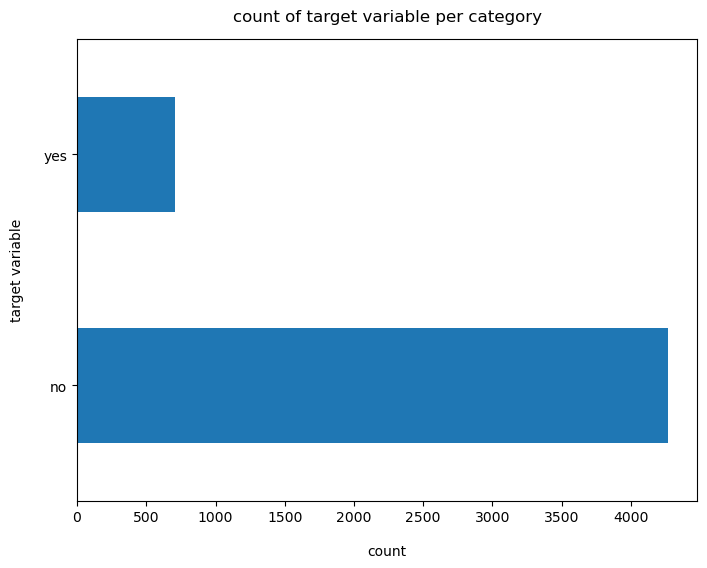

In [19]:
df["churn"].value_counts().plot(kind="barh",figsize=(8,6))
plt.xlabel("count",labelpad=14)
plt.ylabel("target variable",labelpad=14)
plt.title("count of target variable per category",y=1.02)

# Data Cleaning

We can see that the columns “state”, “intl plan”, “voice plan” and “churn” have String values. The latter three seem to have just the values “yes” or “no” and are therefore converted to 1 and 0 respectively.

The “state” column is converted using the LabelEncoder, which replaces each unique label with a unique integer. In this case, a label encode is used instead of dummy variables because of the many distinct values,.

The “Unnamed:0” column is removed, because we already have index in this dataset

In [20]:
df = df.drop(['Unnamed: 0'], axis=1)

In [21]:
pre_df = df.copy()

In [22]:
pre_df['churn'].replace(('yes', 'no'), (1, 0), inplace=True)
pre_df['voice.plan'].replace(('yes', 'no'), (1, 0), inplace=True)
pre_df['intl.plan'].replace(('yes', 'no'), (1, 0), inplace=True)

In [23]:
 pre_df.columns = [s.replace('.','_') for s in pre_df.columns]

In [24]:
pre_df

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,KS,area_code_415,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,OH,area_code_415,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,NJ,area_code_415,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,OH,area_code_408,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,OK,area_code_415,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,WV,area_code_415,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,DC,area_code_415,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,DC,area_code_510,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


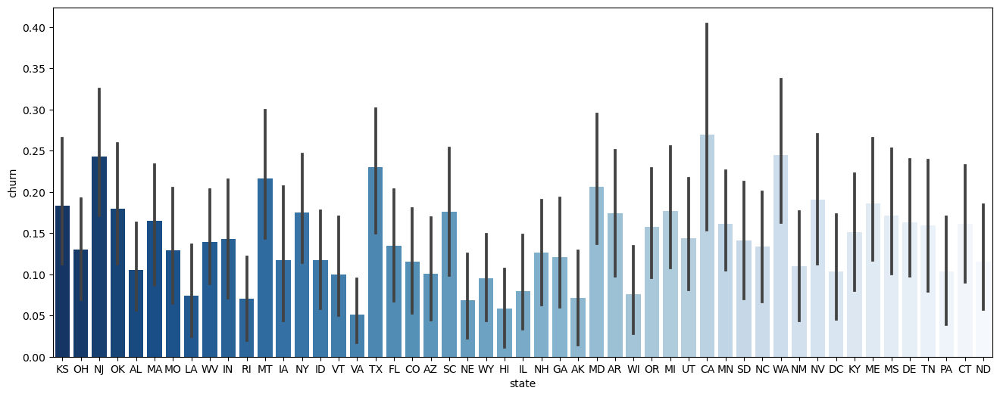

In [25]:
plt.figure(figsize=(16, 6))  
sns.barplot(data=pre_df, x='state',y= 'churn',palette='Blues_r');

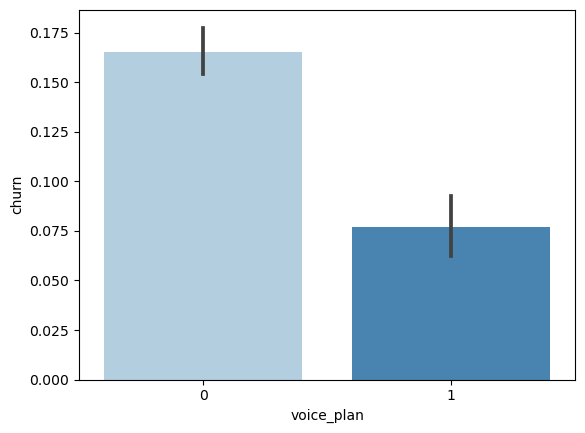

In [26]:

sns.barplot(data=pre_df, x='voice_plan', y='churn', palette='Blues');

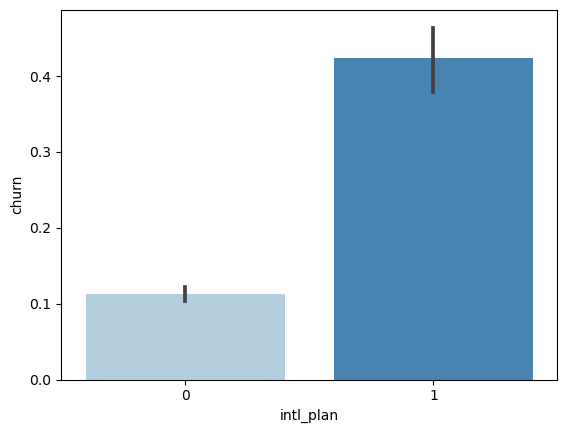

In [27]:
sns.barplot(data=pre_df, x='intl_plan', y='churn', palette='Blues');

<AxesSubplot: xlabel='churn', ylabel='day_mins'>

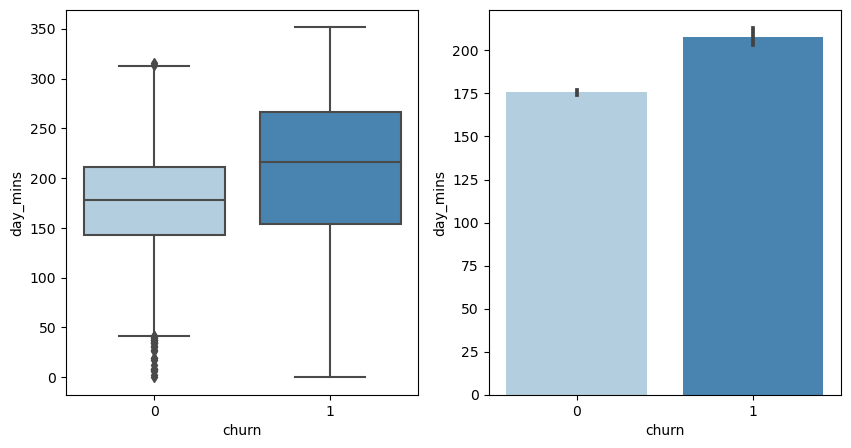

In [28]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))

sns.boxplot(data=pre_df, x='churn', y='day_mins', palette='Blues', ax=ax1)
sns.barplot(data=pre_df, x='churn', y='day_mins', palette='Blues', ax=ax2)

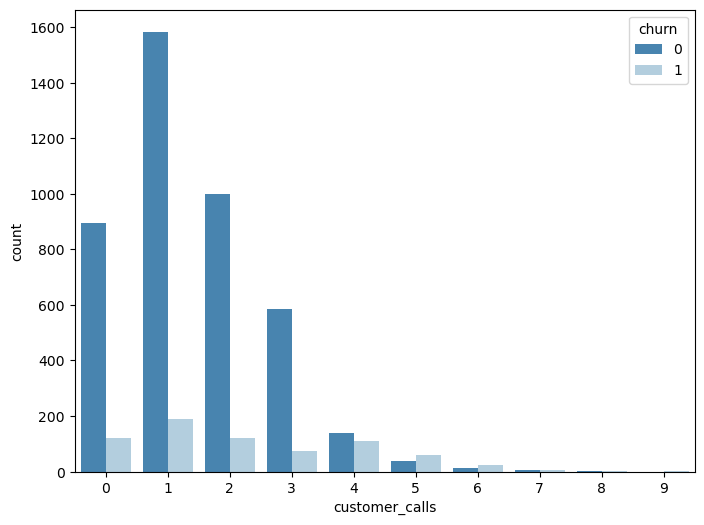

In [29]:
plt.figure(figsize=(8, 6))
sns.countplot(data=pre_df, x='customer_calls', hue='churn', palette='Blues_r');

<AxesSubplot: xlabel='churn', ylabel='voice_messages'>

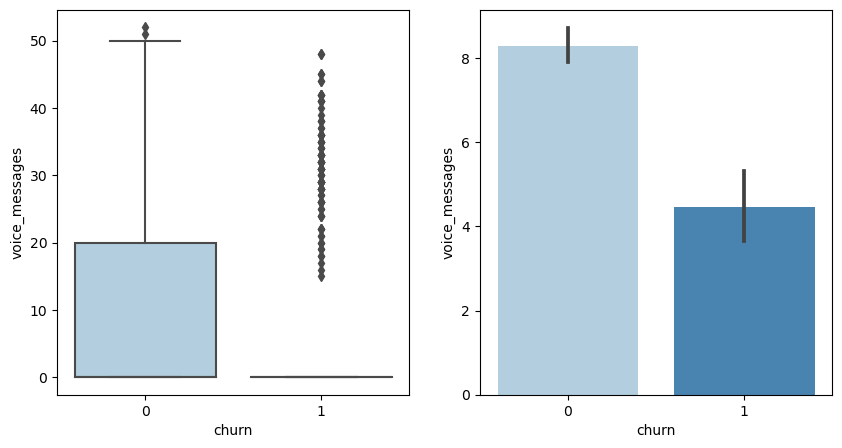

In [30]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))

sns.boxplot(data=pre_df, x='churn', y='voice_messages', palette='Blues', ax=ax1)
sns.barplot(data=pre_df, x='churn', y='voice_messages', palette='Blues', ax=ax2)

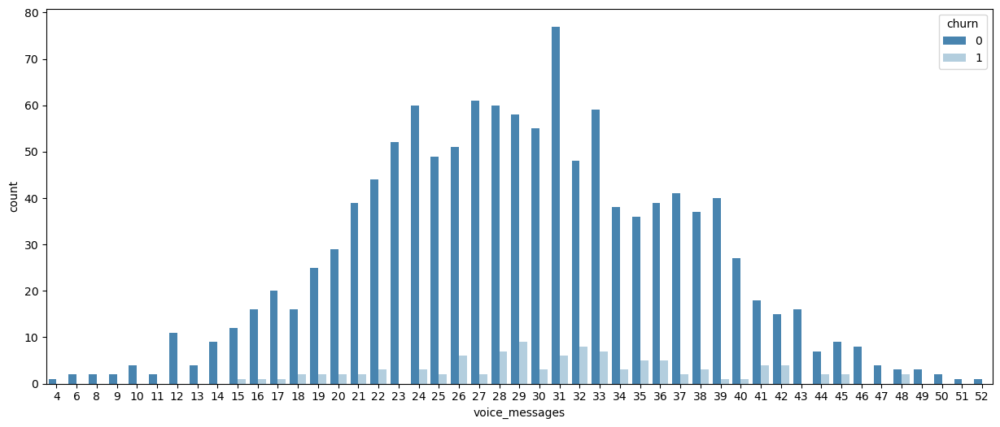

In [31]:
plt.figure(figsize=(15, 6))
sns.countplot(data=pre_df[pre_df["voice_messages"]!=0], x='voice_messages', hue='churn', palette='Blues_r');

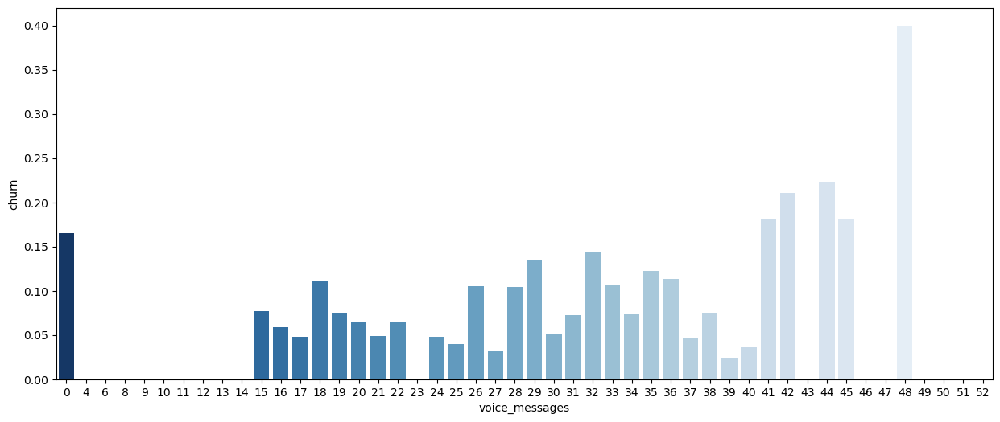

In [32]:
plt.figure(figsize=(15, 6))
sns.barplot(data=pre_df, x='voice_messages', y ='churn', palette='Blues_r', ci=None);

In [33]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(pre_df['state'])
pre_df['state'] = le.fit_transform(pre_df['state'])

In [34]:
pre_df['churn'].value_counts()

0    4264
1     705
Name: churn, dtype: int64

We can see that we have clearly more samples for customers without churn than for customers with churn. So we have a class imbalance for the target variable which could lead to predictive models which are biased towards the majority (i.e. no churn). In order to deal with this issue we will investigate into the use of oversampling when building the models.

# Churn Vs Non-Churn

<AxesSubplot: ylabel='churn'>

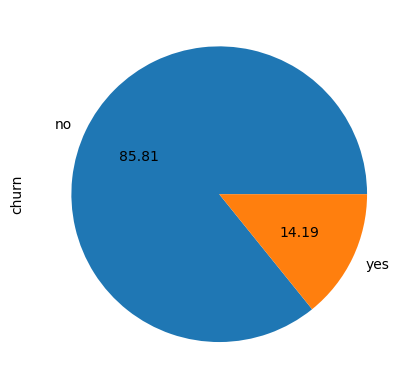

In [35]:
df['churn'].value_counts().plot(kind="pie",autopct="%0.2f")

so, according to the above pie chart:

1. 85.51% are number of NO (Customer won't Churn)
2. 14.49% are number of YES (Customer will Churn)

In [36]:
print(df['churn'].value_counts())

no     4264
yes     705
Name: churn, dtype: int64


The above bar plot shows the percentage of observations that correspond to each class of the response variable: no(0) and yes(1). This is an imbalanced data set because both classes are not equally distributed among all observations, being no the majority class more than 85.5%. When modeling, this imbalance will lead to a large number of false negatives.

By this we can also conclude that:

1. Churn vs Non-churn customers ratio is 1:6
2. Churn minority class - 705 customers
3. Non-churn - majority class - 4264 customers

<AxesSubplot: ylabel='voice.plan'>

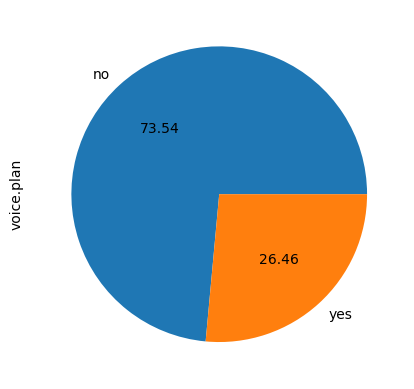

In [37]:
df['voice.plan'].value_counts().plot(kind="pie",autopct="%0.2f")

so, according to the above pie chart:

1. 73.54% are number of NO (Customer don't have voice plan)
2. 26.46% are number of YES (Customer have voice plan)

<AxesSubplot: ylabel='intl.plan'>

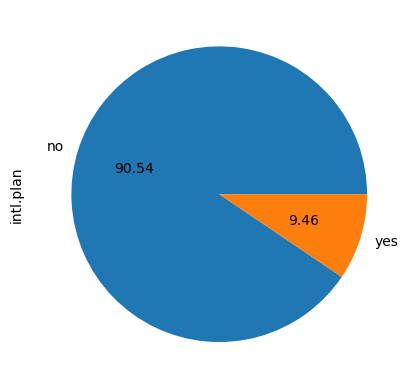

In [38]:
df['intl.plan'].value_counts().plot(kind="pie",autopct="%0.2f")

so, according to the above pie chart:

1. 90.54% are number of NO (Customer don't have international plan)
2. 9.46% are number of YES (Customer have international plan)

<AxesSubplot: ylabel='intl.calls'>

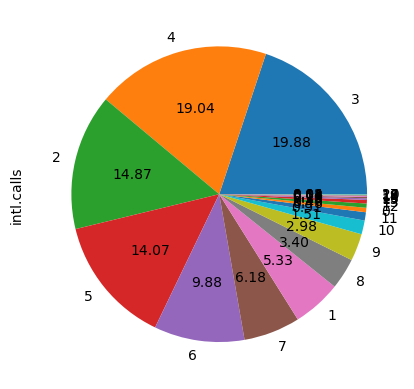

In [39]:
df['intl.calls'].value_counts().plot(kind="pie",autopct="%0.2f")

<AxesSubplot: xlabel='intl.charge', ylabel='customer.calls'>

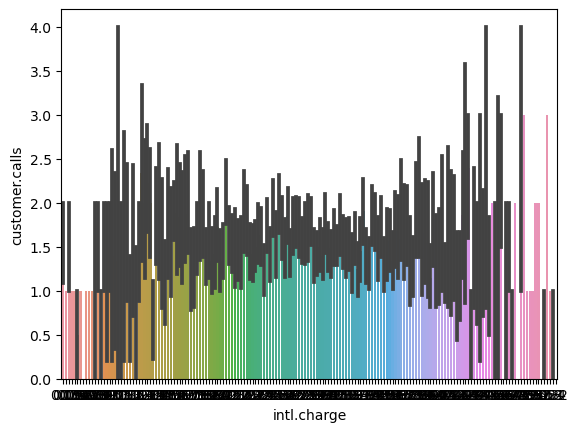

In [40]:
sns.barplot(x=df["intl.charge"], y=df["customer.calls"])

In [41]:
corr = df.corr()

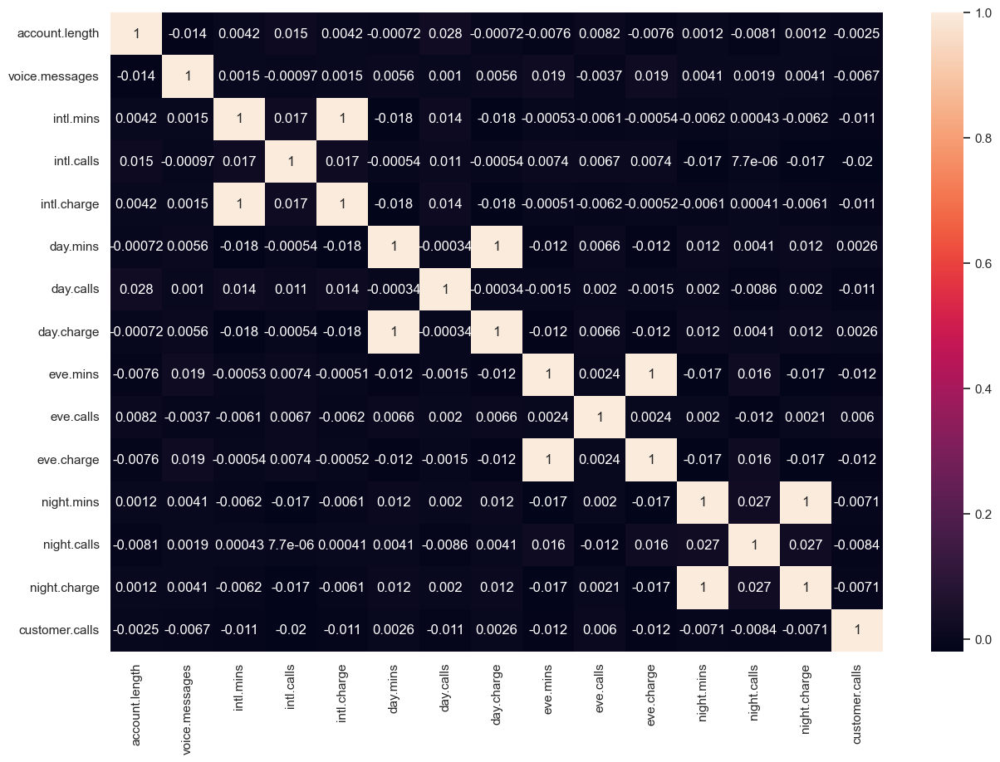

In [42]:
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(corr, annot=True)
plt.show()

<AxesSubplot: xlabel='churn', ylabel='account.length'>

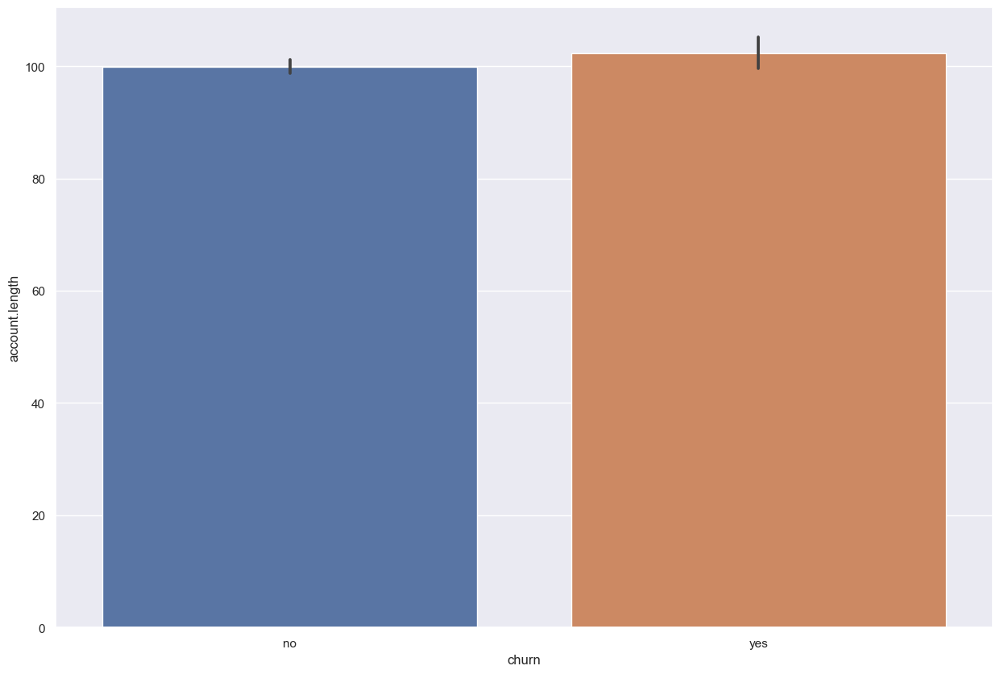

In [43]:
sns.barplot(x=df["churn"], y=df["account.length"])

The above bar plot clearly shows that the account lenght has no effect on churning rate of customer. We may condisder dropping this feature from the data set in future.

Now we i'm converting categorical columns to numerical 0 and 1 to further work on the dataset

In [44]:
df['churn'].replace(('yes', 'no'), (1, 0), inplace=True)
df['voice.plan'].replace(('yes', 'no'), (1, 0), inplace=True)
df['intl.plan'].replace(('yes', 'no'), (1, 0), inplace=True)

<AxesSubplot: xlabel='voice.plan', ylabel='count'>

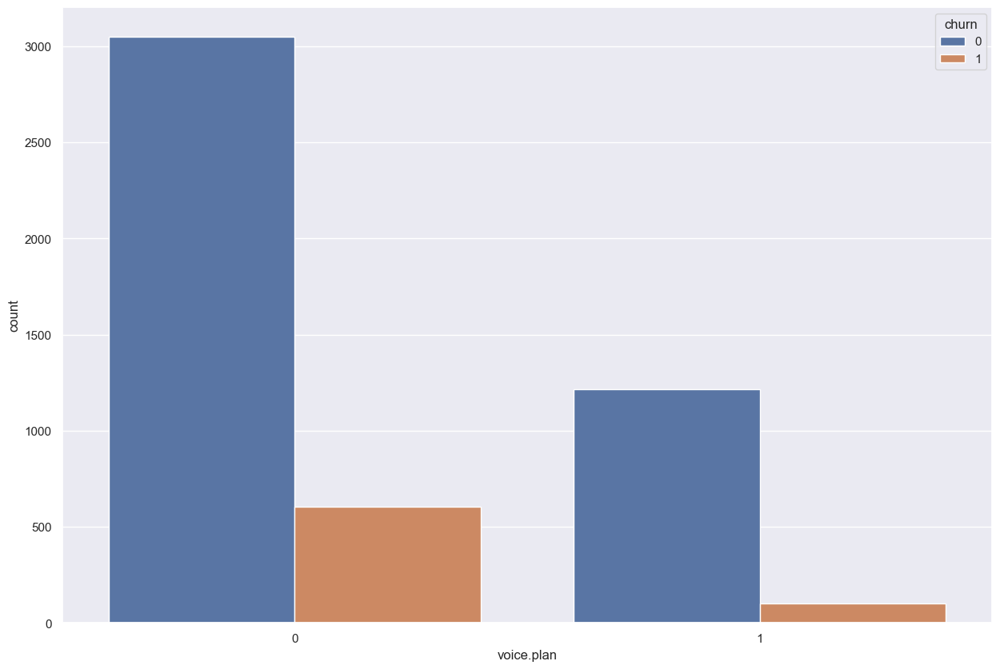

In [45]:
sns.countplot(x=df['voice.plan'], hue='churn', data=df)

We can see that customer who does not have voice mail plan are the highest churner. Also, we can see below that how many customers are churners and non-churners.

In [46]:
df[(df['voice.plan'] == 0) & (df.churn == 1)]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
10,IN,area_code_415,65,0,0,0,12.7,6,3.43,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,4,1
15,NY,area_code_415,161,0,0,0,5.4,9,1.46,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,4,1
21,CO,area_code_408,77,0,0,0,5.7,6,1.54,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5,1
33,AZ,area_code_408,12,0,0,0,11.8,3,3.19,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,1,1
48,ID,area_code_415,119,0,0,0,8.8,3,2.38,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4959,NM,area_code_408,137,0,0,1,10.6,2,2.86,312.4,110,53.11,231.1,73,19.64,120.1,78,5.40,1,1
4980,WA,area_code_408,73,0,0,0,12.3,2,3.32,177.2,118,30.12,270.5,84,22.99,241.8,112,10.88,3,1
4990,ND,area_code_510,140,0,0,0,7.5,6,2.03,244.7,115,41.60,258.6,101,21.98,231.3,112,10.41,1,1
4991,AZ,area_code_510,97,0,0,0,8.8,5,2.38,252.6,89,42.94,340.3,91,28.93,256.5,67,11.54,1,1


In [47]:
# those who have taken voice mail plan and are churning are less no of customers
df[(df['voice.plan'] == 1) & (df.churn == 1)]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
41,MD,area_code_408,135,1,41,1,14.6,15,3.94,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,0,1
57,CO,area_code_408,121,1,30,0,5.8,3,1.57,198.4,129,33.73,75.3,77,6.40,181.2,77,8.15,3,1
115,ME,area_code_510,36,1,42,1,20.0,6,5.40,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,0,1
127,MS,area_code_510,61,1,27,0,6.4,6,1.73,187.5,124,31.88,146.6,103,12.46,225.7,129,10.16,4,1
198,ME,area_code_510,131,1,26,1,13.8,7,3.73,292.9,101,49.79,199.7,97,16.97,255.3,127,11.49,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636,NJ,area_code_415,136,1,22,1,11.7,2,3.16,160.3,115,27.25,273.2,88,23.22,203.2,89,9.14,0,1
4676,IA,area_code_415,200,1,29,1,5.7,1,1.54,92.2,95,15.67,200.0,101,17.00,119.1,99,5.36,1,1
4773,MT,area_code_415,84,1,25,0,12.9,8,3.48,113.9,90,19.36,257.0,99,21.85,214.5,98,9.65,4,1
4778,NY,area_code_408,102,1,48,0,7.8,4,2.11,134.0,83,22.78,234.3,128,19.92,197.3,107,8.88,6,1


In [48]:
df['area.code'].value_counts(normalize=True)

area_code_415    0.498893
area_code_408    0.251358
area_code_510    0.249748
Name: area.code, dtype: float64

<AxesSubplot: xlabel='churn', ylabel='voice.messages'>

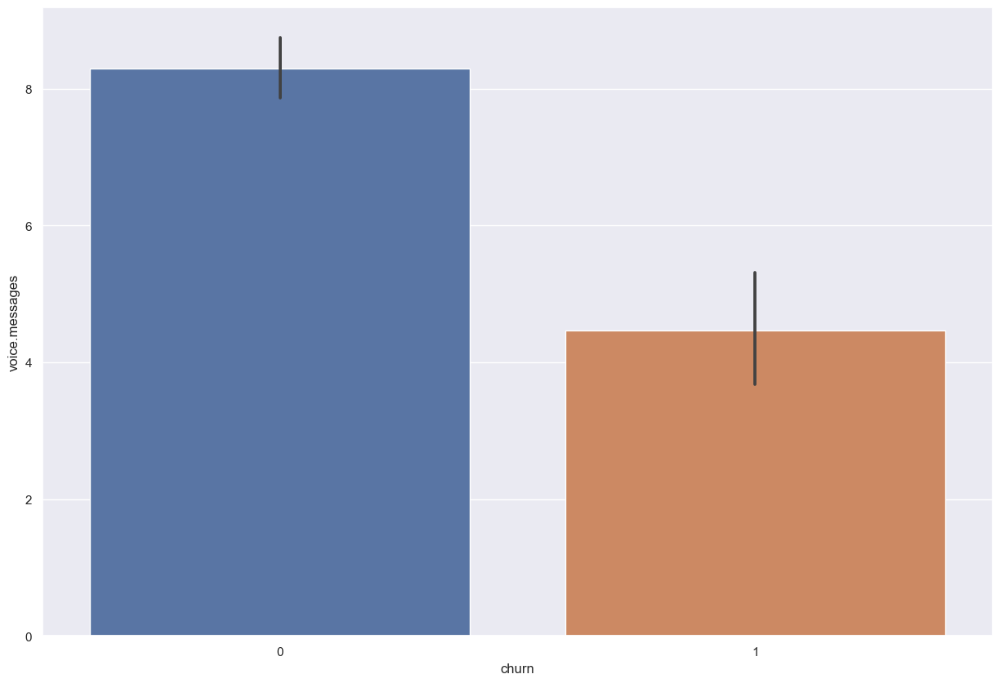

In [49]:
sns.barplot(x=df.churn, y=df['voice.messages'])

By looking at the above plot. we can observe churn customers have less number of Voice Mail Messages

In [50]:
df[(df['voice.messages'] > 0)&(df.churn == 1)]


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
41,MD,area_code_408,135,1,41,1,14.6,15,3.94,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,0,1
57,CO,area_code_408,121,1,30,0,5.8,3,1.57,198.4,129,33.73,75.3,77,6.40,181.2,77,8.15,3,1
115,ME,area_code_510,36,1,42,1,20.0,6,5.40,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,0,1
127,MS,area_code_510,61,1,27,0,6.4,6,1.73,187.5,124,31.88,146.6,103,12.46,225.7,129,10.16,4,1
198,ME,area_code_510,131,1,26,1,13.8,7,3.73,292.9,101,49.79,199.7,97,16.97,255.3,127,11.49,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636,NJ,area_code_415,136,1,22,1,11.7,2,3.16,160.3,115,27.25,273.2,88,23.22,203.2,89,9.14,0,1
4676,IA,area_code_415,200,1,29,1,5.7,1,1.54,92.2,95,15.67,200.0,101,17.00,119.1,99,5.36,1,1
4773,MT,area_code_415,84,1,25,0,12.9,8,3.48,113.9,90,19.36,257.0,99,21.85,214.5,98,9.65,4,1
4778,NY,area_code_408,102,1,48,0,7.8,4,2.11,134.0,83,22.78,234.3,128,19.92,197.3,107,8.88,6,1


<AxesSubplot: xlabel='intl.plan', ylabel='count'>

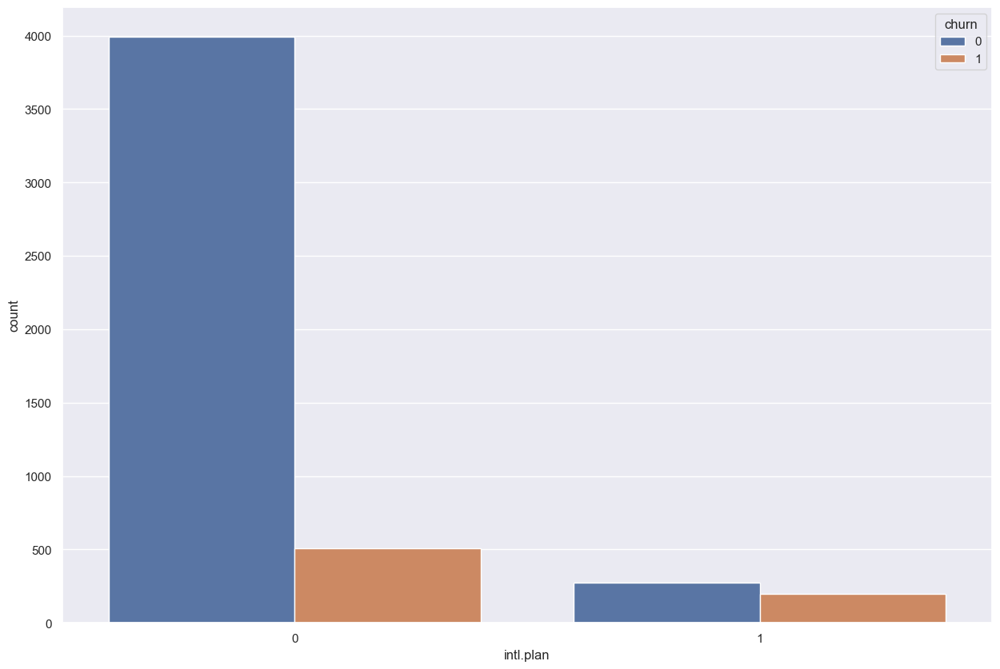

In [51]:
sns.countplot(x=df['intl.plan'], hue='churn', data=df)

By looking at the above plot, we observe that those who have no international plan are high churners.

In [52]:
df.churn.value_counts()

0    4264
1     705
Name: churn, dtype: int64

In [53]:
df[(df['intl.plan']== 0) & (df['intl.calls']!=0)]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,OH,area_code_415,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,NJ,area_code_415,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
6,MA,area_code_510,121,1,24,0,7.5,7,2.03,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,3,0
8,LA,area_code_408,117,0,0,0,8.7,4,2.35,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,WV,area_code_415,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,DC,area_code_415,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,DC,area_code_510,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


From the above data it is very obvious that there are 4476 customers with no international plan but have international calls.

In [54]:
df[(df['intl.plan'] == 0)&(df['intl.calls']!= 0)&(df.churn == 1)]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
10,IN,area_code_415,65,0,0,0,12.7,6,3.43,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,4,1
15,NY,area_code_415,161,0,0,0,5.4,9,1.46,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,4,1
21,CO,area_code_408,77,0,0,0,5.7,6,1.54,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5,1
33,AZ,area_code_408,12,0,0,0,11.8,3,3.19,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,1,1
48,ID,area_code_415,119,0,0,0,8.8,3,2.38,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4953,ME,area_code_415,90,0,0,0,8.7,5,2.35,104.0,104,17.68,170.9,106,14.53,158.8,99,7.15,4,1
4980,WA,area_code_408,73,0,0,0,12.3,2,3.32,177.2,118,30.12,270.5,84,22.99,241.8,112,10.88,3,1
4990,ND,area_code_510,140,0,0,0,7.5,6,2.03,244.7,115,41.60,258.6,101,21.98,231.3,112,10.41,1,1
4991,AZ,area_code_510,97,0,0,0,8.8,5,2.38,252.6,89,42.94,340.3,91,28.93,256.5,67,11.54,1,1


We can write a conclusion that, out of 705 churn customers 506 have no international plan but have international calls.

# Univariate Analysis

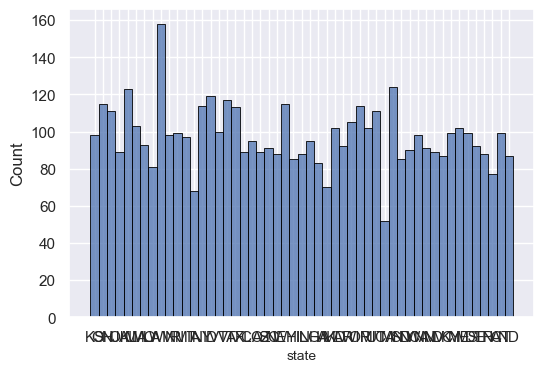

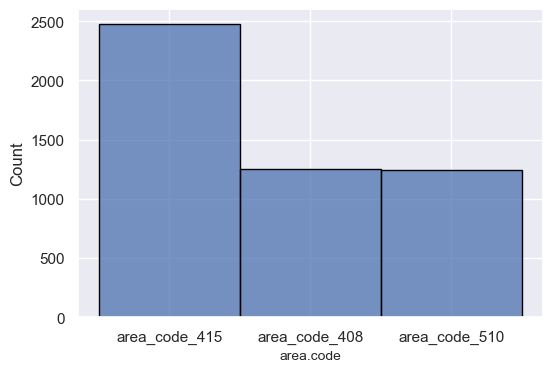

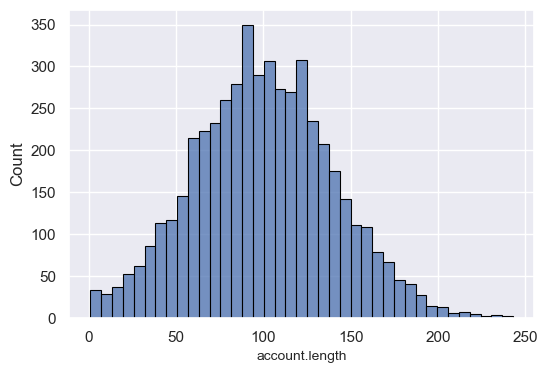

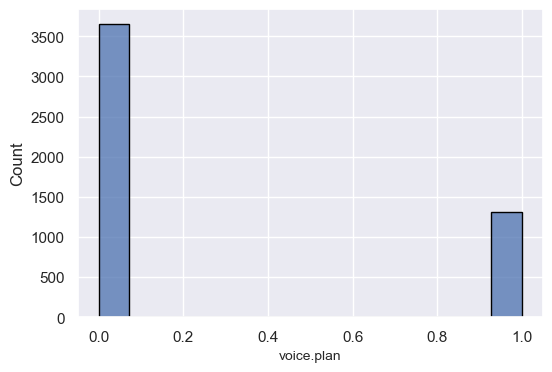

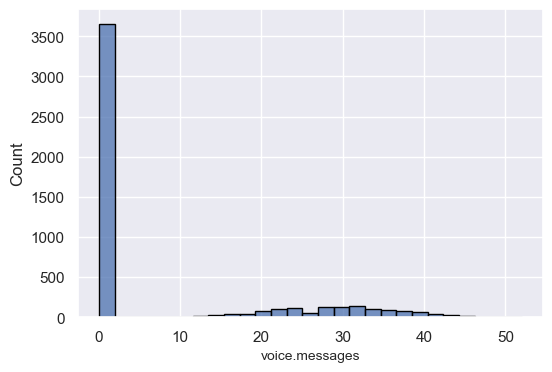

...

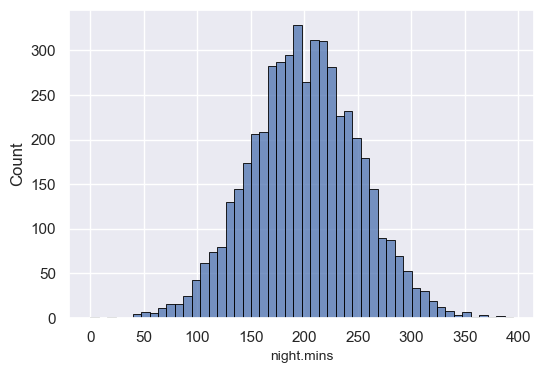

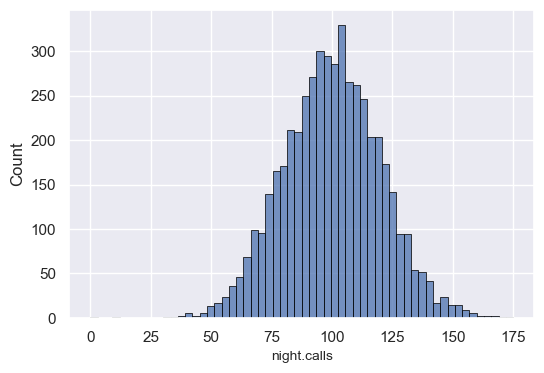

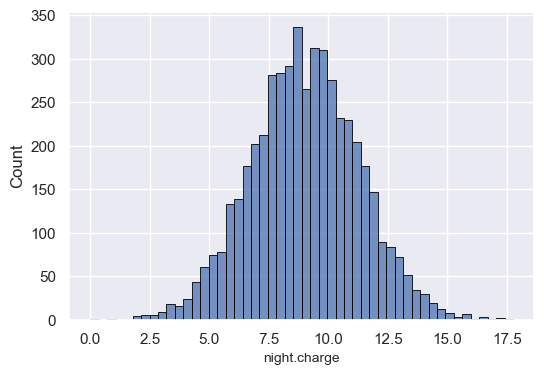

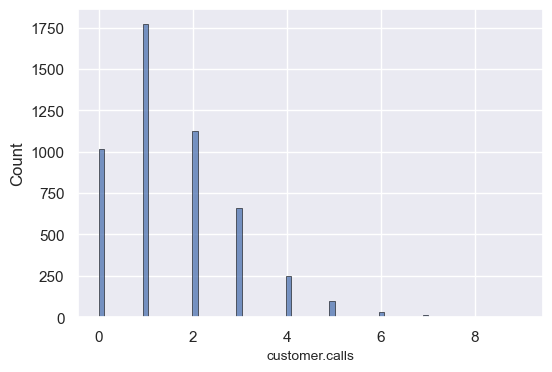

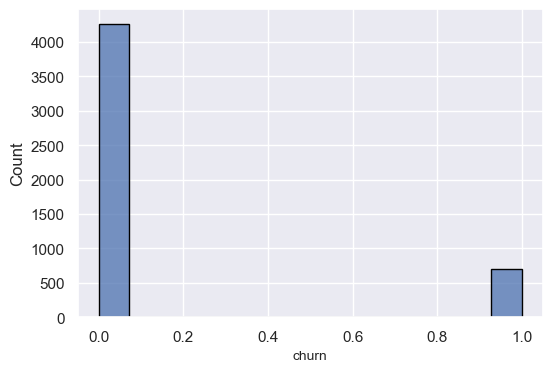

In [55]:
for i in df.columns:
    plt.figure(figsize=(6,4))
    sns.histplot(df[i], palette='mako',edgecolor='black')
    plt.xlabel(i, fontsize=10)
    plt.show()

# Bivariate Analysis

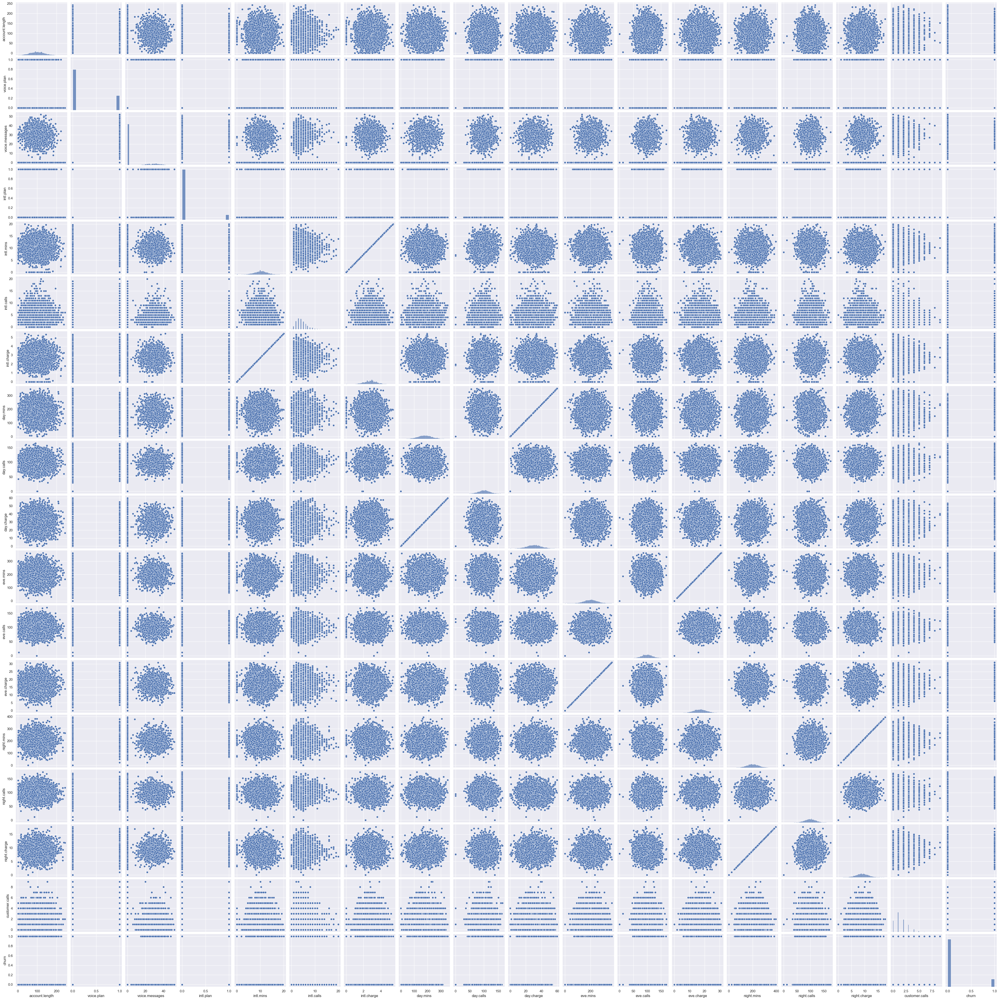

In [56]:
sns.pairplot(df)

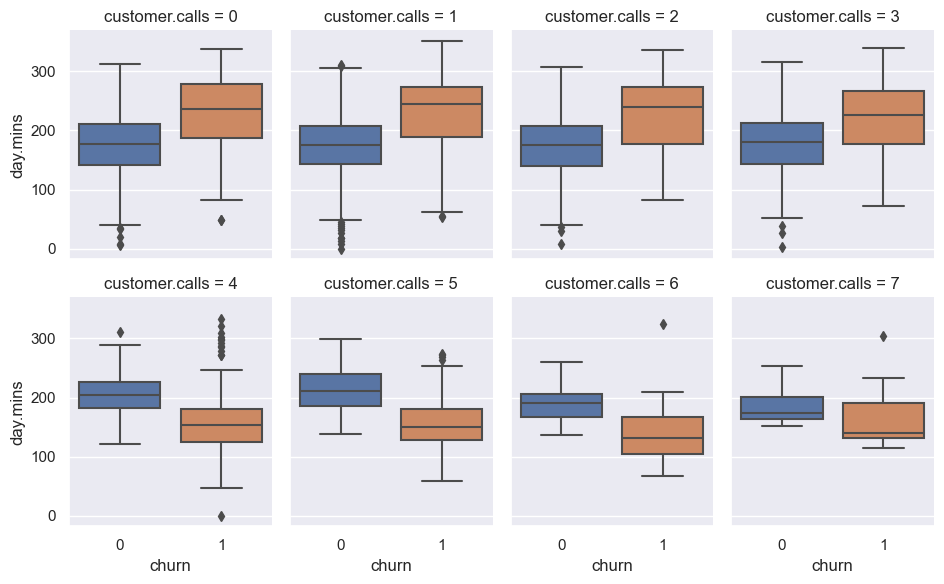

In [57]:
# checking the outliars
sns.catplot(x='churn', y = 'day.mins', col='customer.calls',
           data=df[df['customer.calls'] < 8], kind = 'box', col_wrap=4,height=3, aspect=0.8);

Starting with 4 calls, total day minutes may no longer be the main factor for customer churn. day minutes have also reduced by increase in customer service calls.

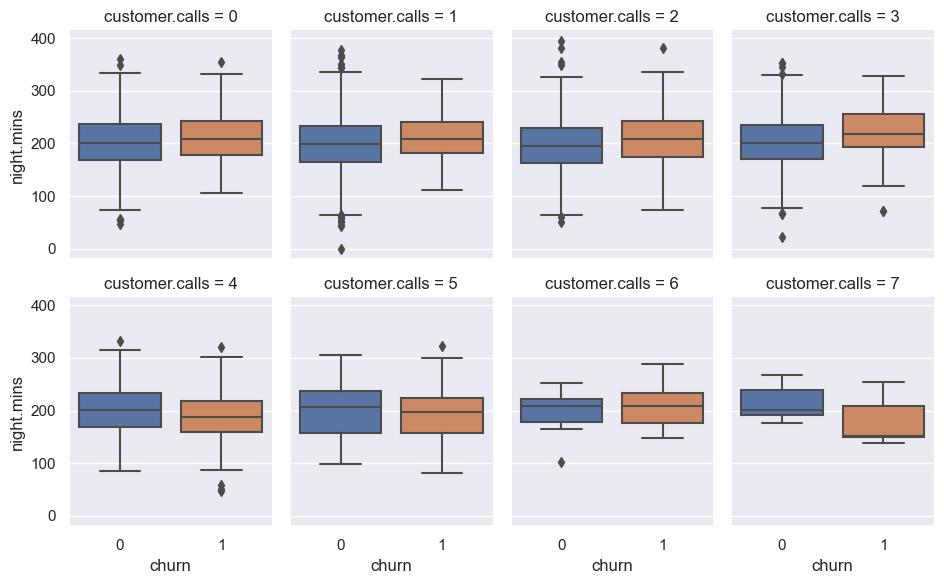

In [58]:
sns.catplot(x='churn', y = 'night.mins', col='customer.calls',
           data=df[df['customer.calls'] < 8], kind = 'box', col_wrap=4,height=3, aspect=0.8);

Night minutes is almost equal while increase in customer service call. churn is also same pattern as non churn

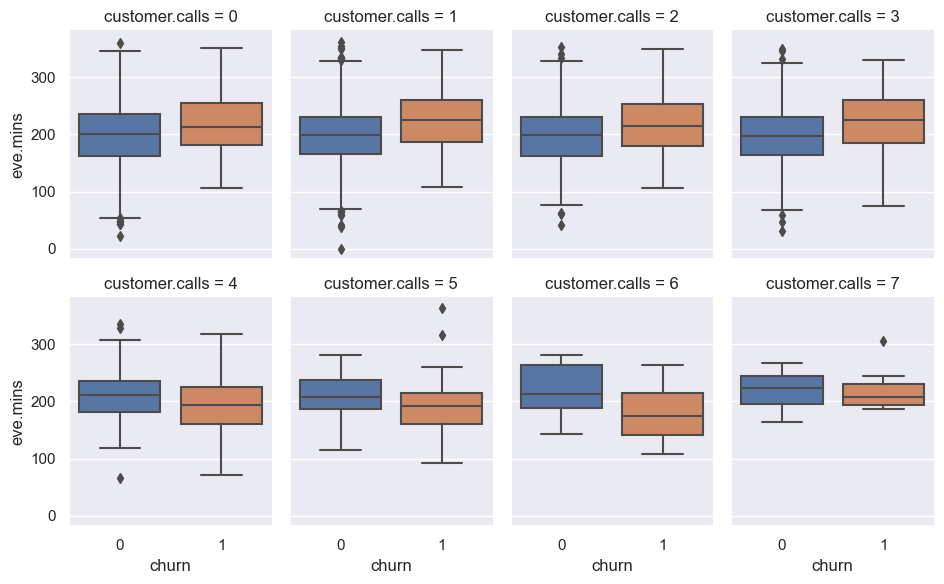

In [59]:
sns.catplot(x='churn', y = 'eve.mins', col='customer.calls',
           data=df[df['customer.calls'] < 8], kind = 'box', col_wrap=4,height=3, aspect=0.8);

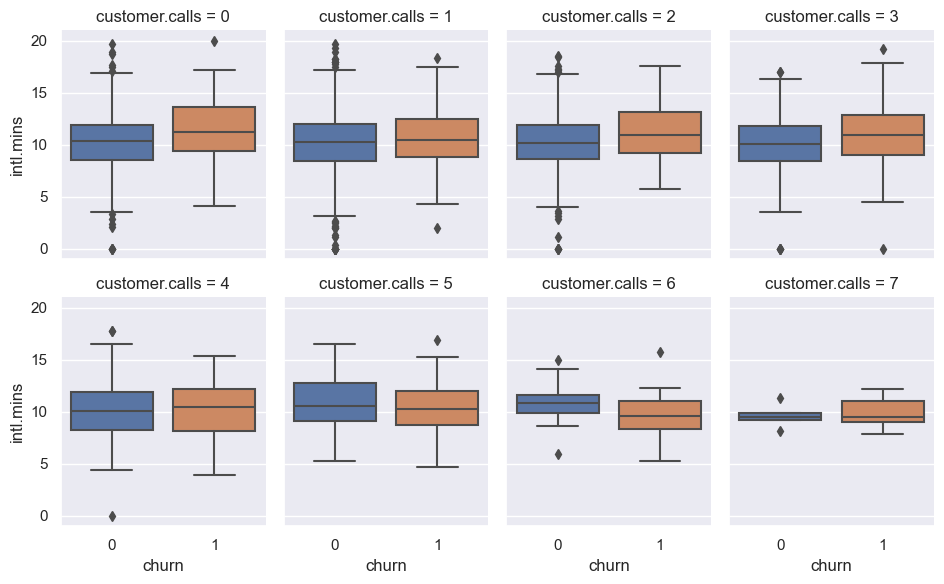

In [60]:
sns.catplot(x='churn', y = 'intl.mins', col='customer.calls',
           data=df[df['customer.calls'] < 8], kind = 'box', col_wrap=4, height=3, aspect=0.8);


With increase in customer call, total international minutes may be the good factor for customer churn

# Label Encoder

In [61]:
obj_col = df.loc[:,df.dtypes==object].columns

In [62]:
for i in obj_col:
    u = df[i].unique()
    
    print("{} || {} \n".format(i,u))

state || ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'MT' 'IA' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM' 'NV'
 'DC' 'KY' 'ME' 'MS' 'DE' 'TN' 'PA' 'CT' 'ND'] 

area.code || ['area_code_415' 'area_code_408' 'area_code_510'] 



In [63]:
for i in obj_col:
    v = df[i].value_counts()
    
    print("{} \n {} \n".format(i,v))

state 
 WV    158
MN    124
AL    123
ID    119
VA    117
OH    115
WY    115
OR    114
NY    114
TX    113
UT    111
NJ    111
WI    105
MA    103
MI    102
ME    102
MD    102
VT    100
KY     99
MS     99
CT     99
RI     99
IN     98
WA     98
KS     98
MT     97
CO     95
NH     95
MO     93
DE     92
AR     92
SC     91
NM     91
NC     90
AZ     89
FL     89
NV     89
OK     89
TN     88
IL     88
NE     88
DC     87
ND     87
SD     85
HI     85
GA     83
LA     81
PA     77
AK     70
IA     68
CA     52
Name: state, dtype: int64 

area.code 
 area_code_415    2479
area_code_408    1249
area_code_510    1241
Name: area.code, dtype: int64 



In [64]:
obj_col = df.loc[:,df.dtypes==float].columns
for i in obj_col:
    u = df[i].unique()
    
    print("{} || {} \n".format(i,u))

intl.mins || [10.  13.7 12.2  6.6 10.1  6.3  7.5  7.1  8.7 11.2 12.7  9.1 12.3 13.1
  5.4 13.8  8.1 13.  10.6  5.7  9.5  7.7 10.3 15.5 11.1 14.2 12.6 11.8
  8.3 14.7 14.5 10.5  9.4 14.6  9.2  3.5  8.5 13.2  8.8 11.   7.8  6.8
 11.4  9.3  9.7 10.2  8.   5.8 12.1 12.  11.6  8.2  6.2  7.3  6.1 11.7
 15.   9.8 12.4  8.6 10.9  8.9  7.9  5.3  4.4 12.5 11.3  9.   9.6 13.3
 20.   7.2  6.4 14.1 14.3  6.9 11.5 15.8 12.8 16.2  0.  11.9  9.9  8.4
 10.8 13.4 10.7 17.6  4.7  2.7 13.5 12.9 13.9 14.4 10.4  6.7 15.4  4.5
  6.5 15.6  5.9 18.9  7.6  5.   7.  14.  18.  16.  14.8  3.7  2.   4.8
 15.3  6.  13.6 17.2 17.5  5.6 18.2  3.6 16.5  7.4  4.6  4.1 16.3 14.9
 16.4 16.7  1.3 15.2 15.1 15.9  5.5 16.1  4.  16.9  5.1  5.2  4.2 15.7
 17.   3.9  3.8 17.1  4.9 17.9 17.3 18.4 17.8  4.3  2.9  3.1  3.3  2.6
  3.4  1.1 18.3 16.6  2.1  2.4  2.5 18.7 16.8  0.4 19.3 19.2  2.2 19.7
 18.5 17.7] 

intl.charge || [2.7  3.7  3.29 1.78 2.73 1.7  2.03 1.92 2.35 3.02 3.43 2.46 3.32 3.54
 1.46 3.73 2.19 3.51 2.86 1.54 2.57

In [65]:
for i in obj_col:
    v = df[i].value_counts()
    
    print("{} \n {} \n".format(i,v))

intl.mins 
 11.1    89
9.8     87
11.3    82
10.1    81
11.4    81
        ..
2.7      1
18.4     1
17.9     1
17.1     1
17.7     1
Name: intl.mins, Length: 170, dtype: int64 

intl.charge 
 3.00    89
2.65    87
3.05    82
2.73    81
3.08    81
        ..
0.73     1
4.97     1
4.83     1
4.62     1
4.78     1
Name: intl.charge, Length: 170, dtype: int64 

day.mins 
 189.3    10
174.5     9
184.5     9
159.5     9
177.1     9
         ..
281.3     1
108.0     1
150.3     1
7.9       1
170.0     1
Name: day.mins, Length: 1957, dtype: int64 

day.charge 
 32.18    10
29.67     9
31.37     9
27.12     9
30.11     9
         ..
47.82     1
18.36     1
25.55     1
1.34      1
28.90     1
Name: day.charge, Length: 1957, dtype: int64 

eve.mins 
 230.9    10
169.9    10
199.7    10
187.5     9
223.5     9
         ..
263.4     1
277.0     1
178.8     1
231.3     1
340.3     1
Name: eve.mins, Length: 1875, dtype: int64 

eve.charge 
 14.25    15
15.90    15
16.12    14
18.96    13
18.79    13

In [66]:
100*df['churn'].value_counts()/len(df["churn"])

0    85.812035
1    14.187965
Name: churn, dtype: float64

In [67]:
df["churn"].value_counts()

0    4264
1     705
Name: churn, dtype: int64

Data is highly imbalanced, ratio = 86:14
So we analyse the data with other features while taking the target values separately to get some insights.

In [68]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4969 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           4969 non-null   object 
 1   area.code       4969 non-null   object 
 2   account.length  4969 non-null   int64  
 3   voice.plan      4969 non-null   int64  
 4   voice.messages  4969 non-null   int64  
 5   intl.plan       4969 non-null   int64  
 6   intl.mins       4969 non-null   float64
 7   intl.calls      4969 non-null   int64  
 8   intl.charge     4969 non-null   float64
 9   day.mins        4969 non-null   float64
 10  day.calls       4969 non-null   int64  
 11  day.charge      4969 non-null   float64
 12  eve.mins        4969 non-null   float64
 13  eve.calls       4969 non-null   int64  
 14  eve.charge      4969 non-null   float64
 15  night.mins      4969 non-null   float64
 16  night.calls     4969 non-null   int64  
 17  night.charge    4969 non-null   f

In [69]:
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,OH,area_code_415,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,NJ,area_code_415,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,OH,area_code_408,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,OK,area_code_415,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,WV,area_code_415,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,DC,area_code_415,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,DC,area_code_510,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


# Features Selection
Correlation

RFE 

Decision Tree Classifier

Univarient Selection

In [70]:
pre_df = pre_df.drop(['state','area_code'],axis=1)
pre_df

,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


In [71]:
pre_df.corr()

,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
account_length,1.000000,-0.005836,-0.013682,0.015781,0.004165,0.014686,0.004173,-0.000715,0.027558,-0.000717,-0.007600,0.008187,-0.007597,0.001229,-0.008077,0.001218,-0.002457,0.021307
voice_plan,-0.005836,1.000000,0.954416,0.008759,0.003119,-0.008071,0.003167,0.002276,-0.001745,0.002272,0.022627,-0.005750,0.022631,0.004238,0.008156,0.004235,-0.013996,-0.111879
voice_messages,-0.013682,0.954416,1.000000,0.011384,0.001497,-0.000970,0.001539,0.005641,0.001008,0.005636,0.018517,-0.003682,0.018523,0.004094,0.001903,0.004086,-0.006676,-0.098588
intl_plan,0.015781,0.008759,0.011384,1.000000,0.031432,0.005159,0.031387,0.027734,0.007652,0.027737,0.019784,0.002871,0.019783,-0.027729,0.006009,-0.027729,-0.012001,0.260779
intl_mins,0.004165,0.003119,0.001497,0.031432,1.000000,0.016604,0.999993,-0.018335,0.014284,-0.018339,-0.000533,-0.006097,-0.000539,-0.006178,0.000429,-0.006174,-0.010839,0.062034
intl_calls,0.014686,-0.008071,-0.000970,0.005159,0.016604,1.000000,0.016714,-0.000541,0.011457,-0.000544,0.007402,0.006675,0.007407,-0.017202,0.000008,-0.017172,-0.019519,-0.046513
intl_charge,0.004173,0.003167,0.001539,0.031387,0.999993,0.016714,1.000000,-0.018261,0.014348,-0.018265,-0.000512,-0.006151,-0.000518,-0.006119,0.000411,-0.006114,-0.010893,0.062028
day_mins,-0.000715,0.002276,0.005641,0.027734,-0.018335,-0.000541,-0.018261,1.000000,-0.000342,1.000000,-0.011572,0.006587,-0.011581,0.011755,0.004091,0.011738,0.002573,0.207961
day_calls,0.027558,-0.001745,0.001008,0.007652,0.014284,0.011457,0.014348,-0.000342,1.000000,-0.000342,-0.001526,0.001984,-0.001522,0.002023,-0.008645,0.002019,-0.010938,0.016067
day_charge,-0.000717,0.002272,0.005636,0.027737,-0.018339,-0.000544,-0.018265,1.000000,-0.000342,1.000000,-0.011568,0.006588,-0.011578,0.011757,0.004090,0.011740,0.002567,0.207956


<AxesSubplot: >

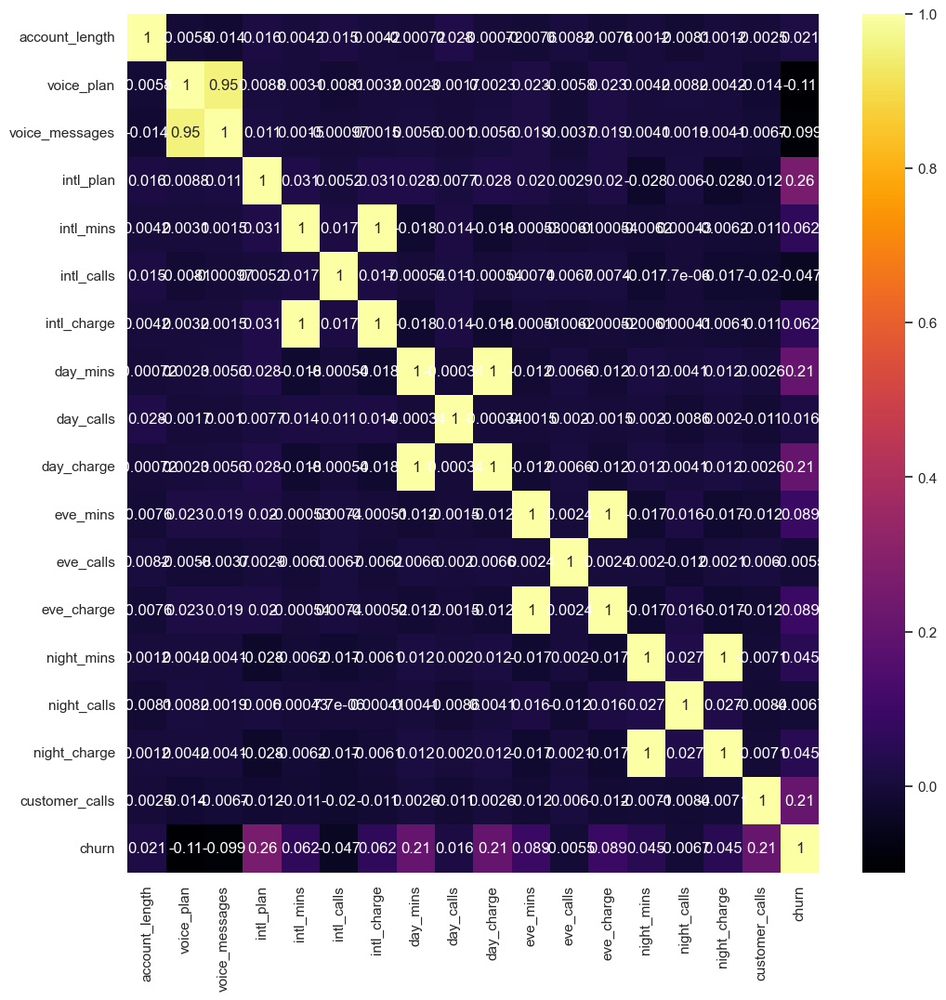

In [72]:
import seaborn as sns
plt.figure(figsize=(12,12))
sns.heatmap(pre_df.corr(),annot=True, cmap='inferno', fmt="0.2g")

In [73]:
pre_df.corr().sort_values("churn")["churn"]

voice_plan       -0.111879
voice_messages   -0.098588
intl_calls       -0.046513
night_calls      -0.006732
eve_calls        -0.005534
day_calls         0.016067
account_length    0.021307
night_charge      0.045484
night_mins        0.045488
intl_charge       0.062028
intl_mins         0.062034
eve_charge        0.089097
eve_mins          0.089104
day_charge        0.207956
day_mins          0.207961
customer_calls    0.213432
intl_plan         0.260779
churn             1.000000
Name: churn, dtype: float64

<AxesSubplot: >

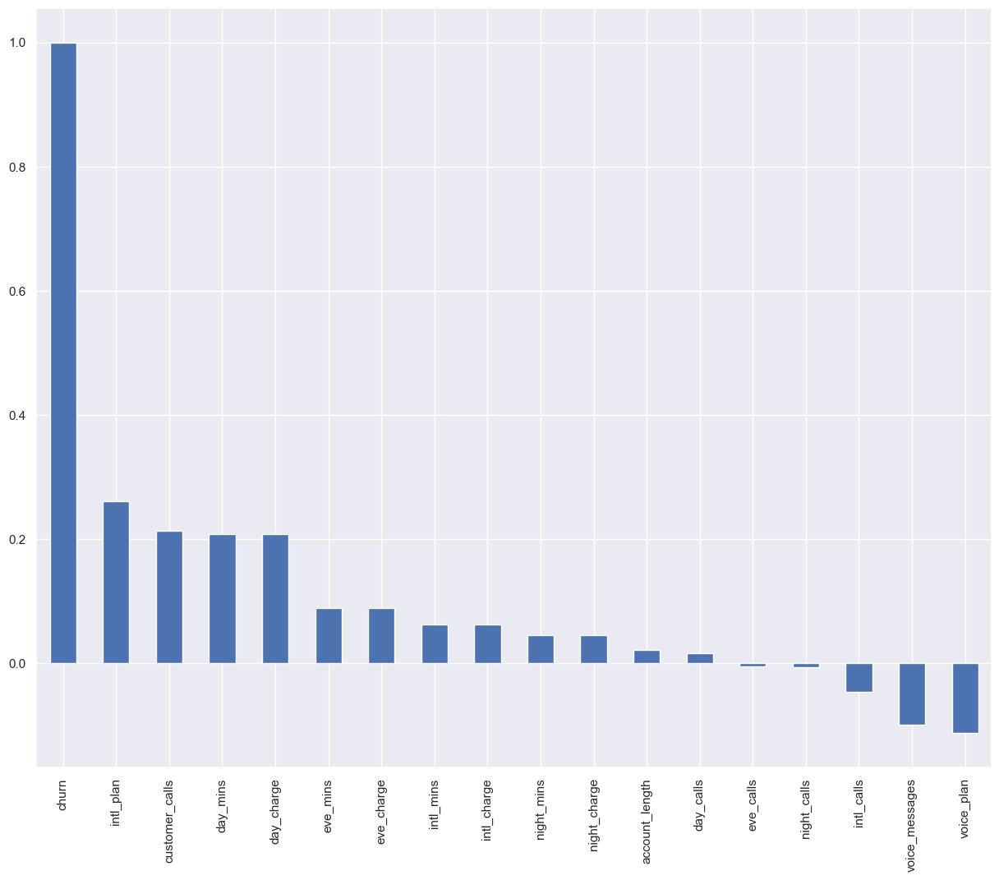

In [74]:
#Get Correlation of "Churn" with other variables:
plt.figure(figsize=(15,12))
pre_df.corr()['churn'].sort_values(ascending = False).plot(kind='bar')

In [75]:
X = pre_df.drop("churn",axis=1)
y = pre_df["churn"]

In [76]:
#Univarient Selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from numpy import set_printoptions


test = SelectKBest(score_func=chi2, k=5)
fit = test.fit(X, y)

In [77]:
set_printoptions(precision=3)
print(fit.scores_)

[3.547e+01 4.574e+01 1.143e+03 3.060e+02 1.421e+01 1.467e+01 3.834e+00
 3.466e+03 5.045e+00 5.892e+02 5.024e+02 5.975e-01 4.270e+01 1.309e+02
 8.973e-01 5.891e+00 2.461e+02]


In [78]:
fit.get_feature_names_out()

array(['voice_messages', 'intl_plan', 'day_mins', 'day_charge',
       'eve_mins'], dtype=object)

In [79]:
col = X.columns

In [80]:
data = pd.DataFrame({"Column":col,"Value":fit.scores_})
data.sort_values("Value")

,Column,Value
11,eve_calls,0.597519
14,night_calls,0.897285
6,intl_charge,3.834209
8,day_calls,5.045302
15,night_charge,5.891110
4,intl_mins,14.209169
5,intl_calls,14.665997
0,account_length,35.465453
12,eve_charge,42.697310
1,voice_plan,45.736898


In [81]:
#RFE
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

model = LogisticRegression(max_iter=400)
rfe = RFE(model, n_features_to_select = 8)
fit = rfe.fit(X, y)

In [82]:
fit.support_

array([False,  True,  True,  True,  True,  True,  True, False, False,
        True, False, False, False, False, False, False,  True])

In [83]:
fit.ranking_

array([ 9,  1,  1,  1,  1,  1,  1,  2,  8,  1,  3,  7, 10,  4,  6,  5,  1])

In [84]:
data = pd.DataFrame({"Column":col,"Value":fit.ranking_})
data.sort_values("Value")

,Column,Value
16,customer_calls,1
1,voice_plan,1
2,voice_messages,1
3,intl_plan,1
4,intl_mins,1
5,intl_calls,1
6,intl_charge,1
9,day_charge,1
7,day_mins,2
10,eve_mins,3


In [85]:
 # Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X,y)

DecisionTreeClassifier()

In [86]:
model.feature_importances_

array([0.019, 0.003, 0.069, 0.069, 0.092, 0.082, 0.026, 0.155, 0.022,
       0.101, 0.094, 0.02 , 0.051, 0.051, 0.016, 0.025, 0.108])

In [87]:
data = pd.DataFrame({"Column":col,"Value":model.feature_importances_})
data.sort_values("Value")

,Column,Value
1,voice_plan,0.002810
14,night_calls,0.016051
0,account_length,0.018777
11,eve_calls,0.019737
8,day_calls,0.021835
15,night_charge,0.025236
6,intl_charge,0.025922
13,night_mins,0.051051
12,eve_charge,0.051150
2,voice_messages,0.068604


If we found above features are unimportant in feature engineering we will drop them and if  we found them important we will not drop it

# Detecting Outliers

In [88]:
df['churn'].replace(('yes', 'no'), (1, 0), inplace=True)
df['voice.plan'].replace(('yes', 'no'), (1, 0), inplace=True)
df['intl.plan'].replace(('yes', 'no'), (1, 0), inplace=True)

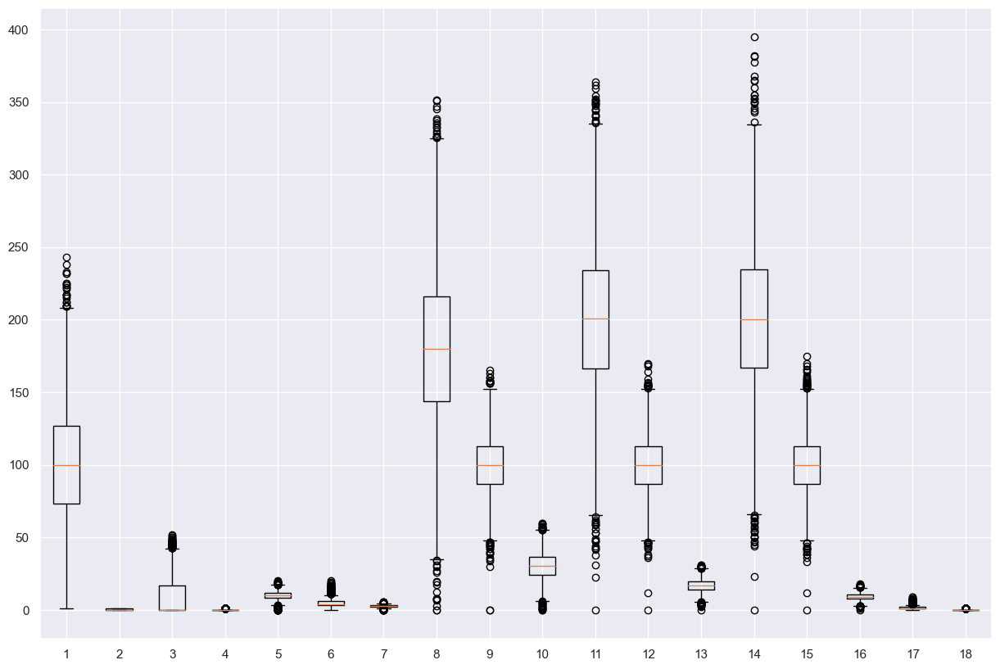

In [89]:
plt.boxplot(pre_df)
plt.show()

In [90]:
def calculate_zscores(col_name):
    UL = np.round(df[col_name].mean() + 3*(df[col_name].std()),3)
    LL = np.round(df[col_name].mean() - 3*(df[col_name].std()),3)
    return (LL,UL)

def calculate_outliers_boxplot(colName):
    q1,q3 = np.percentile(df[colName],[25,75])
    iqr = q3-q1
    LB = np.round(q1 - 1.5*(iqr),3)
    UB = np.round(q3 + 1.5*(iqr),3)
    return (LB,UB)

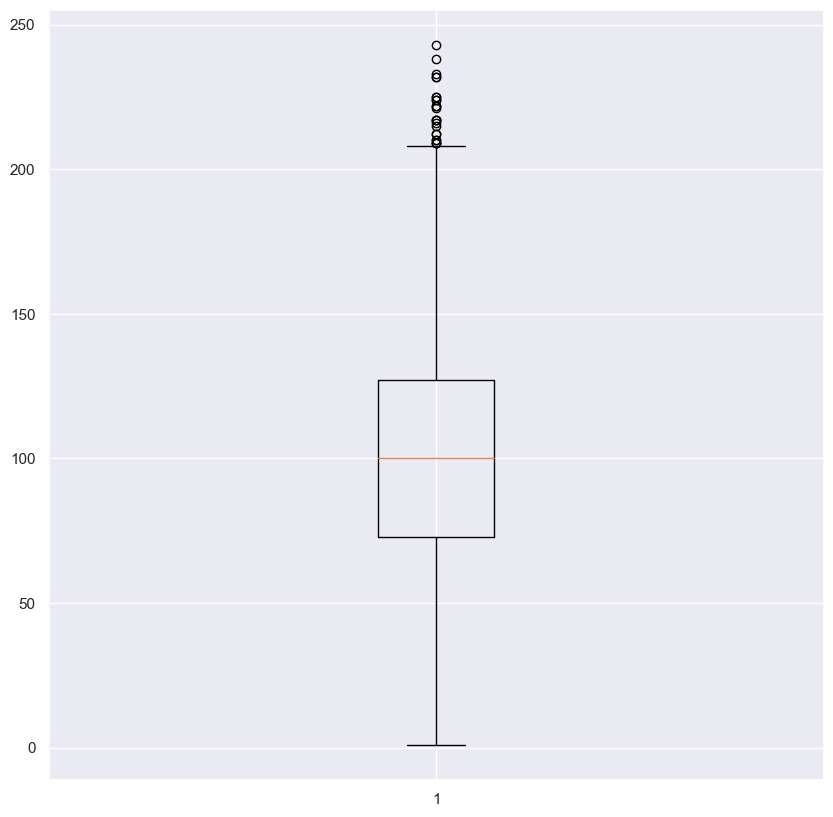

In [91]:
plt.figure(figsize=(10,10))
Account_length = plt.boxplot(df['account.length'])

In [92]:
outlier_points = Account_length['fliers'][0].get_data()[1]
outliers = outlier_points.tolist()
print(len(outliers))
sorted(outliers)

24


[209,
 209,
 209,
 210,
 210,
 212,
 212,
 215,
 216,
 217,
 217,
 217,
 221,
 222,
 222,
 224,
 224,
 225,
 225,
 232,
 232,
 233,
 238,
 243]

In [93]:
# checking outliers for upper bound
df[df['account.length'] > 224].sort_values(by='account.length')

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
1551,MI,area_code_415,225,0,0,0,8.7,3,2.35,165.4,106,28.12,273.7,109,23.26,210.0,93,9.45,0,1
1751,WY,area_code_415,225,0,0,0,8.8,2,2.38,182.7,142,31.06,246.5,63,20.95,218.0,103,9.81,1,0
1408,NM,area_code_408,232,0,0,0,11.8,3,3.19,165.6,104,28.15,195.9,115,16.65,118.3,77,5.32,1,0
4389,HI,area_code_415,232,0,0,0,10.0,6,2.70,248.2,128,42.19,211.2,96,17.95,147.1,117,6.62,2,0
4395,IL,area_code_408,233,0,0,0,9.8,4,2.65,137.3,94,23.34,232.4,87,19.75,206.0,105,9.27,1,0
4260,WA,area_code_415,238,0,0,0,12.0,1,3.24,202.0,60,34.34,213.9,105,18.18,266.4,90,11.99,2,0
817,UT,area_code_510,243,0,0,0,6.6,6,1.78,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,2,0


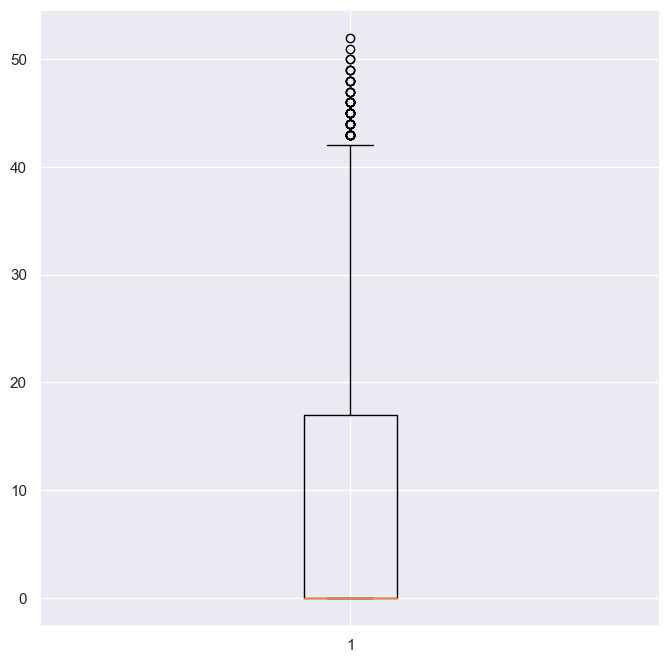

In [94]:
plt.figure(figsize=(8,8))
account_length = plt.boxplot(df['voice.messages'])

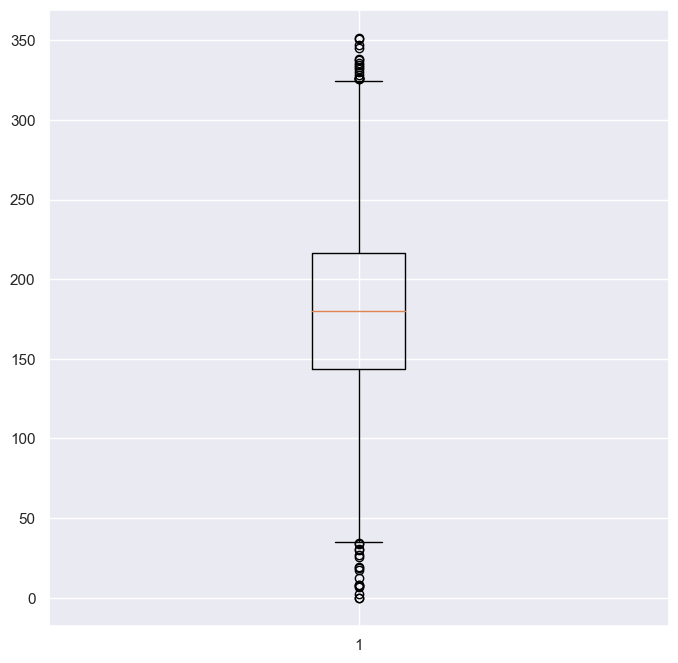

In [95]:
plt.figure(figsize=(8,8))
day_mins = plt.boxplot(df['day.mins'])

In [96]:
outlier_points_dm = day_mins["fliers"][0].get_data()[1]
outlier_dm = outlier_points_dm.tolist()
print(len(outlier_dm))
sorted(outlier_dm)


34


[0.0,
 0.0,
 2.6,
 6.6,
 7.2,
 7.8,
 7.9,
 12.5,
 17.6,
 18.9,
 19.5,
 25.9,
 27.0,
 29.9,
 30.9,
 34.0,
 34.5,
 325.4,
 325.5,
 326.1,
 326.3,
 326.5,
 328.1,
 329.8,
 332.1,
 332.9,
 334.3,
 335.5,
 337.4,
 338.4,
 345.3,
 346.8,
 350.8,
 351.5]

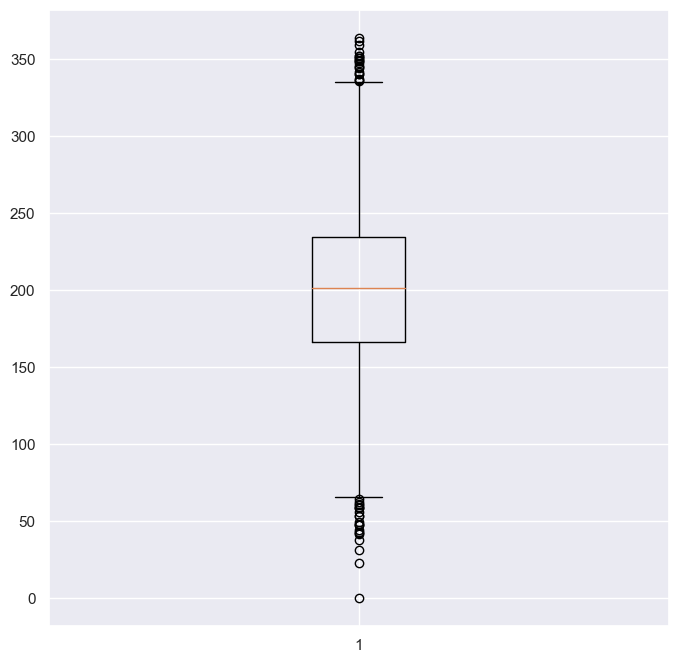

In [97]:
plt.figure(figsize=(8,8))
evening_mins = plt.boxplot(df['eve.mins'])

In [98]:
outlier_evening_mins = evening_mins["fliers"][0].get_data()[1]
outlier_em = outlier_evening_mins.tolist()
print(len(outlier_em))
sorted(outlier_em)

43


[0.0,
 22.3,
 31.2,
 37.8,
 41.7,
 42.2,
 42.5,
 43.9,
 47.3,
 47.3,
 48.1,
 49.2,
 52.9,
 53.2,
 56.0,
 58.3,
 58.6,
 58.9,
 60.0,
 60.8,
 61.9,
 64.3,
 335.7,
 336.0,
 337.1,
 339.9,
 340.3,
 341.3,
 344.0,
 344.9,
 345.1,
 347.3,
 348.5,
 348.9,
 349.4,
 350.5,
 350.9,
 351.6,
 352.1,
 354.2,
 359.3,
 361.8,
 363.7]

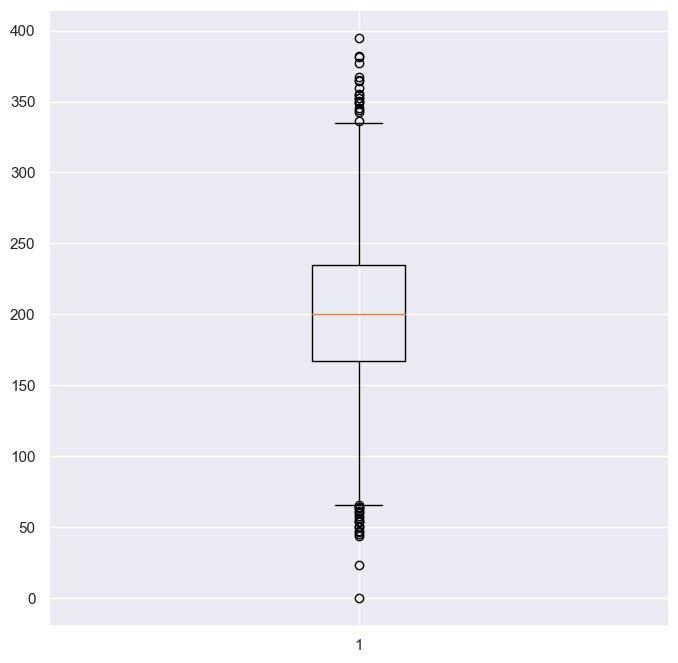

In [99]:
plt.figure(figsize=(8,8))
night_mins = plt.boxplot(df['night.mins'])

In [100]:
outlier_points_nm = night_mins["fliers"][0].get_data()[1]
outlier_nm = outlier_points_nm.tolist()
print(len(outlier_nm))
sorted(outlier_nm)

40


[0.0,
 23.2,
 43.7,
 45.0,
 46.7,
 47.4,
 50.1,
 50.1,
 50.9,
 53.3,
 54.0,
 54.5,
 56.6,
 57.5,
 59.5,
 60.3,
 61.4,
 63.3,
 63.6,
 64.2,
 65.2,
 336.1,
 342.8,
 344.3,
 345.8,
 349.2,
 349.7,
 350.2,
 352.2,
 352.5,
 354.9,
 355.1,
 359.9,
 364.3,
 364.9,
 367.7,
 377.5,
 381.6,
 381.9,
 395.0]

In [101]:
# checking outliers for lower bound
# here 23.2 is an outlier but no of evening calls is also less
# data appears to be accurate
df[df['night.mins'] < 47].sort_values(by='night.mins').iloc[:,5:]

,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
4707,0,8.3,5,2.24,214.3,138,36.43,232.2,99,19.74,0.0,0,0.00,1,0
1260,0,9.5,4,2.57,160.1,107,27.22,168.7,136,14.34,23.2,102,1.04,3,0
1113,0,10.6,4,2.86,206.3,98,35.07,292.8,82,24.89,43.7,121,1.97,1,0
883,0,8.0,12,2.16,146.3,84,24.87,255.9,113,21.75,45.0,117,2.03,1,0
3807,0,12.7,3,3.43,143.6,135,24.41,278.0,119,23.63,46.7,84,2.10,0,0


In [102]:
# checking outliers for upper bound
df[df['night.mins'] >364].sort_values(by='night.mins').iloc[:,5:]

,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
922,0,9.3,5,2.51,239.9,121,40.78,142.3,51,12.10,364.3,106,16.39,1,0
3107,0,9.1,4,2.46,157.6,92,26.79,198.3,87,16.86,364.9,106,16.42,1,0
2321,0,15.5,2,4.19,154.6,56,26.28,263.0,84,22.36,367.7,89,16.55,1,0
1445,0,9.7,2,2.62,222.5,104,37.83,171.5,94,14.58,377.5,114,16.99,1,0
3376,0,10.2,4,2.75,307.2,65,52.22,138.6,97,11.78,381.6,99,17.17,2,1
1317,0,7.5,5,2.03,163.5,80,27.80,274.8,136,23.36,381.9,147,17.19,2,0
2663,0,12.7,7,3.43,169.8,123,28.87,183.1,94,15.56,395.0,72,17.77,2,0


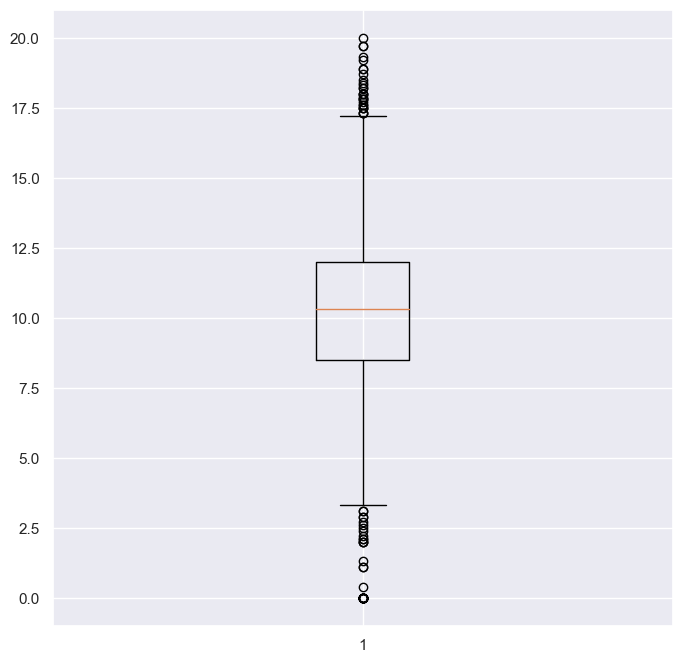

In [103]:
plt.figure(figsize=(8,8))
international_mins = plt.boxplot(df['intl.mins'])

In [104]:
outlier_points_im = international_mins["fliers"][0].get_data()[1]
outlier_im = outlier_points_im.tolist()
print(len(outlier_im))
sorted(outlier_im)

71


[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4,
 1.1,
 1.1,
 1.3,
 2.0,
 2.0,
 2.0,
 2.1,
 2.1,
 2.2,
 2.4,
 2.5,
 2.6,
 2.7,
 2.9,
 2.9,
 3.1,
 3.1,
 17.3,
 17.3,
 17.3,
 17.5,
 17.5,
 17.5,
 17.6,
 17.6,
 17.7,
 17.8,
 17.8,
 17.8,
 17.9,
 18.0,
 18.0,
 18.0,
 18.2,
 18.2,
 18.3,
 18.4,
 18.5,
 18.7,
 18.9,
 18.9,
 19.2,
 19.3,
 19.7,
 19.7,
 20.0]

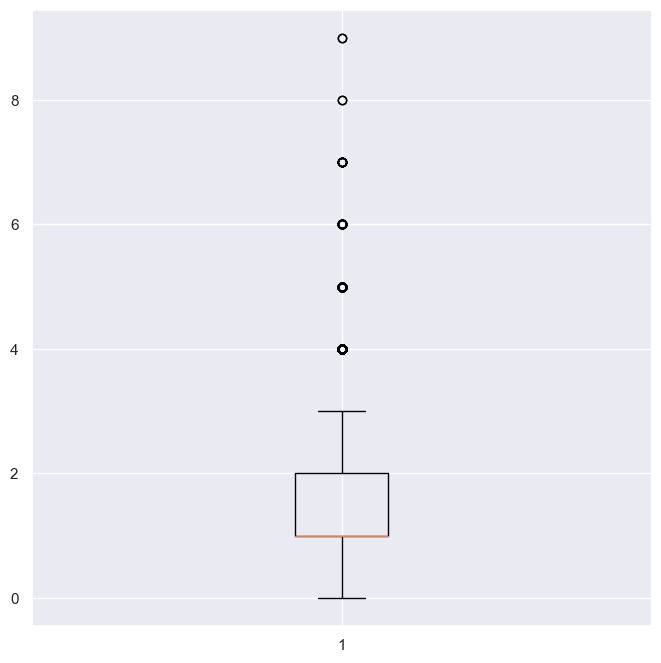

In [105]:
plt.figure(figsize=(8,8))
customer_service_calls = plt.boxplot(df['customer.calls'])

In [106]:
outlier_points_csc = customer_service_calls["fliers"][0].get_data()[1]
outlier_csc = outlier_points_csc.tolist()
print(len(outlier_csc))
sorted(outlier_csc)


398


[4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,


In [107]:
# this will give us dataframe that will be easy to merge with the z-scores dataframe
import numpy as np
LB, UB = calculate_outliers_boxplot('customer.calls')
print(LB,UB)
outlier_wrt_boxplot_csc = df[(df['customer.calls']> UB) | (df['customer.calls']< LB )]
print(outlier_wrt_boxplot_csc.shape)
outlier_wrt_boxplot_csc

-0.5 3.5
(398, 20)


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
10,IN,area_code_415,65,0,0,0,12.7,6,3.43,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,4,1
14,IA,area_code_415,62,0,0,0,13.1,6,3.54,120.7,70,20.52,307.2,76,26.11,203.0,99,9.14,4,0
15,NY,area_code_415,161,0,0,0,5.4,9,1.46,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,4,1
21,CO,area_code_408,77,0,0,0,5.7,6,1.54,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5,1
48,ID,area_code_415,119,0,0,0,8.8,3,2.38,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4934,MN,area_code_415,120,0,0,0,8.3,10,2.24,198.0,101,33.66,190.2,74,16.17,241.2,105,10.85,4,0
4939,MN,area_code_408,30,0,0,0,11.3,7,3.05,112.9,81,19.19,224.8,68,19.11,188.4,122,8.48,4,1
4947,OK,area_code_408,50,0,0,0,10.5,5,2.84,198.7,114,33.78,141.5,90,12.03,293.0,79,13.18,4,0
4953,ME,area_code_415,90,0,0,0,8.7,5,2.35,104.0,104,17.68,170.9,106,14.53,158.8,99,7.15,4,1


In [108]:
# we are getting a lot of outliers using boxplot so we are using z-scores for detecting the outliers
LL,UL = calculate_zscores('customer.calls')
print(LL, UL)
outlier_wrt_std_dev_csc = df[(df['customer.calls']> UL) | (df['customer.calls']< LL )]
print(outlier_wrt_std_dev_csc.shape)
outlier_wrt_std_dev_csc

-2.35 5.494
(51, 20)


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
332,AL,area_code_415,86,0,0,0,12.2,5,3.29,128.3,121,21.81,197.1,93,16.75,138.4,152,6.23,7,1
522,KY,area_code_408,122,1,27,0,9.2,5,2.48,253.7,84,43.13,229.2,109,19.48,190.5,123,8.57,7,0
542,MN,area_code_415,152,1,20,1,14.2,3,3.83,237.5,120,40.38,253.4,94,21.54,265.2,80,11.93,9,1
694,WI,area_code_510,165,0,0,0,10.9,4,2.94,154.2,91,26.21,268.6,108,22.83,188.8,99,8.50,6,0
721,UT,area_code_510,103,1,36,0,10.9,5,2.94,87.2,92,14.82,169.3,110,14.39,166.7,80,7.50,6,1
778,LA,area_code_415,115,1,26,0,13.6,5,3.67,170.5,107,28.99,217.2,77,18.46,225.7,71,10.16,6,0
902,HI,area_code_510,149,0,0,0,8.2,6,2.21,166.6,61,28.32,218.8,107,18.60,208.3,131,9.37,7,0
908,CO,area_code_408,23,0,0,0,15.0,4,4.05,190.2,89,32.33,166.4,108,14.14,219.8,73,9.89,6,0
974,OR,area_code_510,21,1,31,0,9.5,7,2.57,135.9,90,23.10,271.0,84,23.04,179.1,89,8.06,6,0
1142,UT,area_code_415,105,0,0,0,5.3,4,1.43,106.4,71,18.09,240.1,83,20.41,147.7,114,6.65,6,1


In [109]:
# merging zscores and boxplot outliers
outlier_merged_csc = pd.merge(outlier_wrt_boxplot_csc, outlier_wrt_std_dev_csc, left_index=True, right_index=True)
print(outlier_merged_csc.shape)
outlier_merged_csc.iloc[:,7:19].sort_values(by='customer.calls_x')

(51, 40)


,intl.calls_x,intl.charge_x,day.mins_x,day.calls_x,day.charge_x,eve.mins_x,eve.calls_x,eve.charge_x,night.mins_x,night.calls_x,night.charge_x,customer.calls_x
2553,2,2.70,260.4,107,44.27,208.2,104,17.70,207.9,115,9.36,6
2428,3,3.05,81.7,123,13.89,210.2,108,17.87,212.0,64,9.54,6
4790,4,3.81,196.5,104,33.41,175.1,111,14.88,209.6,110,9.43,6
2786,6,2.43,111.2,90,18.90,263.5,98,22.40,224.7,128,10.11,6
2958,2,1.70,128.6,115,21.86,216.2,88,18.38,255.3,96,11.49,6
2961,2,2.16,168.0,81,28.56,163.2,125,13.87,172.7,120,7.77,6
3026,4,2.92,210.3,116,35.75,192.2,83,16.34,246.1,92,11.07,6
3081,3,1.59,174.3,85,29.63,254.1,95,21.60,176.4,96,7.94,6
3190,3,4.27,174.7,151,29.70,148.0,56,12.58,168.2,109,7.57,6
2387,6,2.46,209.5,108,35.62,109.6,64,9.32,189.7,145,8.54,6


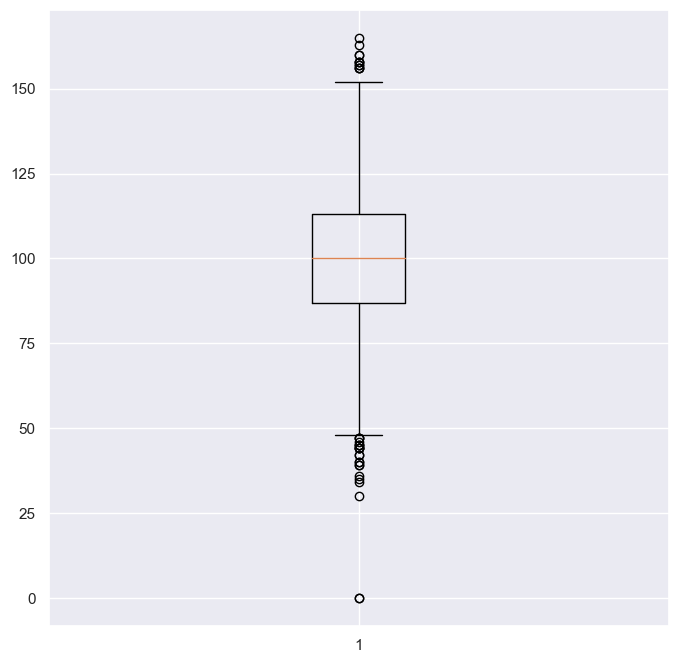

In [110]:
plt.figure(figsize=(8,8))
r_day_calls = plt.boxplot(df['day.calls'])

In [111]:
outlier_points_dc = r_day_calls["fliers"][0].get_data()[1]
outlier_dc = outlier_points_dc.tolist()
print(len(outlier_dc))
sorted(outlier_dc)

35


[0,
 0,
 30,
 34,
 35,
 36,
 39,
 39,
 40,
 40,
 42,
 42,
 44,
 44,
 44,
 44,
 45,
 45,
 45,
 46,
 47,
 47,
 47,
 156,
 156,
 156,
 157,
 157,
 158,
 158,
 158,
 160,
 160,
 163,
 165]

In [112]:
# checking for lower bound outliers
df[df['day.calls'] < 40].sort_values(by='day.calls').iloc[:,9:]

,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
1345,0.0,0,0.00,159.6,130,13.57,167.1,88,7.52,4,1
1397,0.0,0,0.00,192.1,119,16.33,168.8,95,7.60,1,0
1144,216.7,30,36.84,144.3,125,12.27,135.3,106,6.09,2,0
4049,135.7,34,23.07,243.0,99,20.66,209.3,115,9.42,1,0
1989,144.5,35,24.57,262.3,101,22.30,226.5,82,10.19,2,0
692,185.8,36,31.59,276.5,134,23.50,192.1,104,8.64,4,0
4155,131.3,39,22.32,242.9,101,20.65,278.8,100,12.55,2,0
4831,245.5,39,41.74,231.8,116,19.70,156.9,68,7.06,5,0


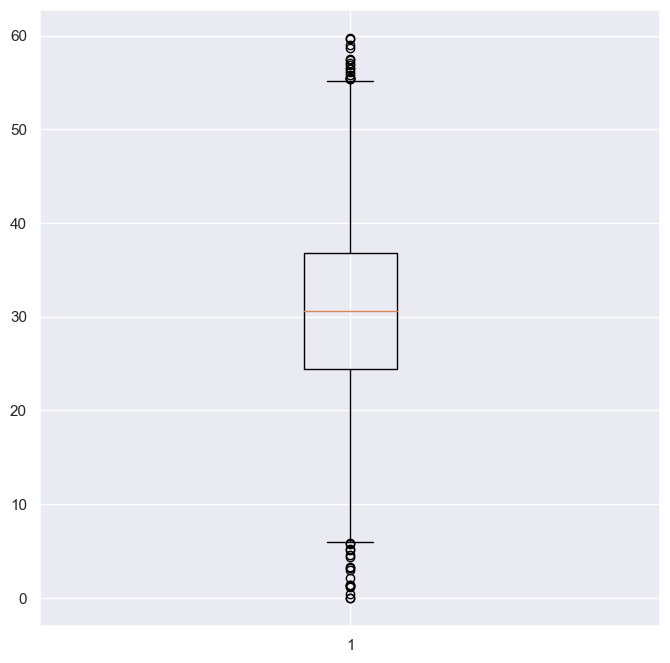

In [113]:
plt.figure(figsize=(8,8))
day_charge = plt.boxplot(df['day.charge'])

In [114]:
outlier_points_dc = day_charge["fliers"][0].get_data()[1]
outlier_dc = outlier_points_dc.tolist()
print(len(outlier_dc))
sorted(outlier_dc)

34


[0.0,
 0.0,
 0.44,
 1.12,
 1.22,
 1.33,
 1.34,
 2.13,
 2.99,
 3.21,
 3.32,
 4.4,
 4.59,
 5.08,
 5.25,
 5.78,
 5.87,
 55.32,
 55.34,
 55.44,
 55.47,
 55.51,
 55.78,
 56.07,
 56.46,
 56.59,
 56.83,
 57.04,
 57.36,
 57.53,
 58.7,
 58.96,
 59.64,
 59.76]

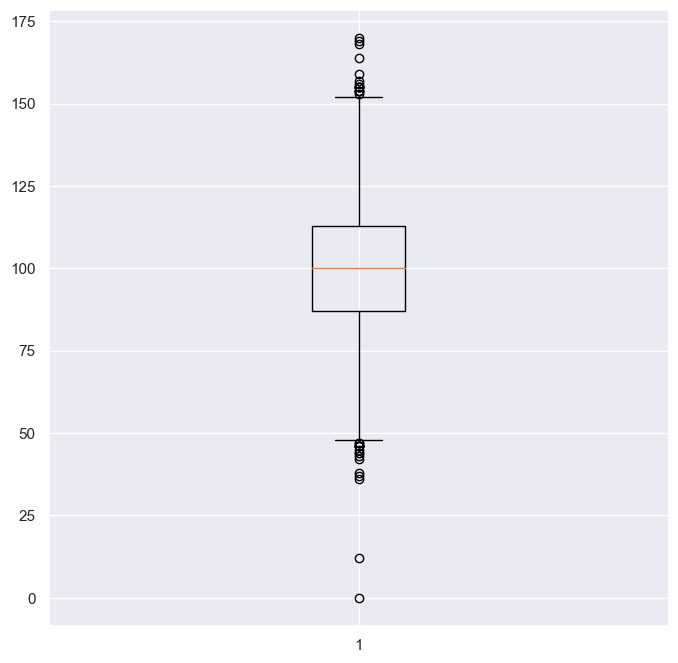

In [115]:
plt.figure(figsize=(8,8))
evening_calls = plt.boxplot(df['eve.calls'])

In [116]:
outlier_points_ec = evening_calls["fliers"][0].get_data()[1]
outlier_ec = outlier_points_ec.tolist()
print(len(outlier_ec))
sorted(outlier_ec)

34


[0,
 12,
 36,
 37,
 38,
 42,
 43,
 44,
 44,
 45,
 46,
 46,
 46,
 46,
 46,
 47,
 47,
 153,
 154,
 154,
 154,
 154,
 155,
 155,
 155,
 155,
 155,
 156,
 157,
 159,
 164,
 168,
 169,
 170]

In [117]:
df[df['eve.calls'] < 42].sort_values(by='eve.calls').iloc[:,11:]

,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
2932,35.56,0.0,0,0.00,175.4,94,7.89,1,0
960,33.86,187.3,12,15.92,214.0,85,9.63,3,0
1615,26.71,213.1,36,18.11,280.4,77,12.62,2,0
646,40.05,227.9,37,19.37,170.3,103,7.66,0,0
4741,33.18,188.7,38,16.04,270.0,91,12.15,0,0


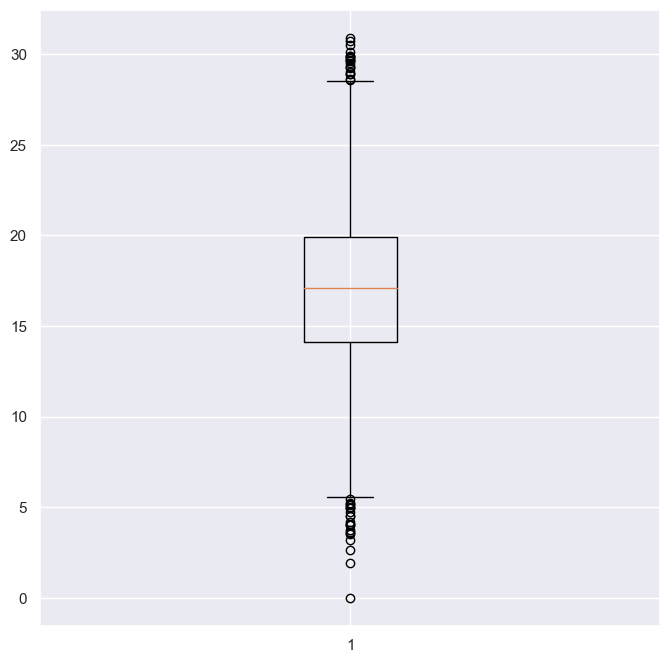

In [118]:
plt.figure(figsize=(8,8))
evening_charge = plt.boxplot(df['eve.charge'])

In [119]:
outlier_points_echarge = evening_charge["fliers"][0].get_data()[1]
outlier_echarge = outlier_points_echarge.tolist()
print(len(outlier_echarge))
sorted(outlier_echarge)

42


[0.0,
 1.9,
 2.65,
 3.21,
 3.54,
 3.59,
 3.61,
 3.73,
 4.02,
 4.02,
 4.09,
 4.18,
 4.5,
 4.52,
 4.76,
 4.96,
 4.98,
 5.01,
 5.1,
 5.17,
 5.26,
 5.47,
 28.56,
 28.65,
 28.89,
 28.93,
 29.01,
 29.24,
 29.32,
 29.33,
 29.52,
 29.62,
 29.66,
 29.7,
 29.79,
 29.83,
 29.89,
 29.93,
 30.11,
 30.54,
 30.75,
 30.91]

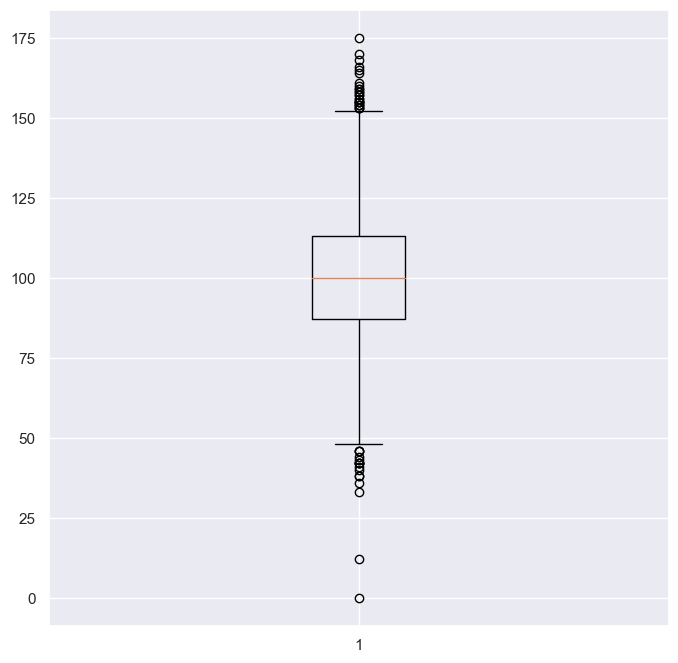

In [120]:
plt.figure(figsize=(8,8))
night_calls = plt.boxplot(df['night.calls'])

In [121]:
outlier_points_nc = night_calls["fliers"][0].get_data()[1]
outlier_nc = outlier_points_nc.tolist()
print(len(outlier_nc))
sorted(outlier_nc)

43


[0,
 12,
 33,
 36,
 38,
 38,
 40,
 41,
 42,
 42,
 42,
 42,
 43,
 44,
 46,
 46,
 46,
 153,
 153,
 153,
 154,
 154,
 154,
 155,
 155,
 155,
 155,
 156,
 156,
 157,
 157,
 158,
 158,
 159,
 159,
 160,
 161,
 164,
 165,
 166,
 168,
 170,
 175]

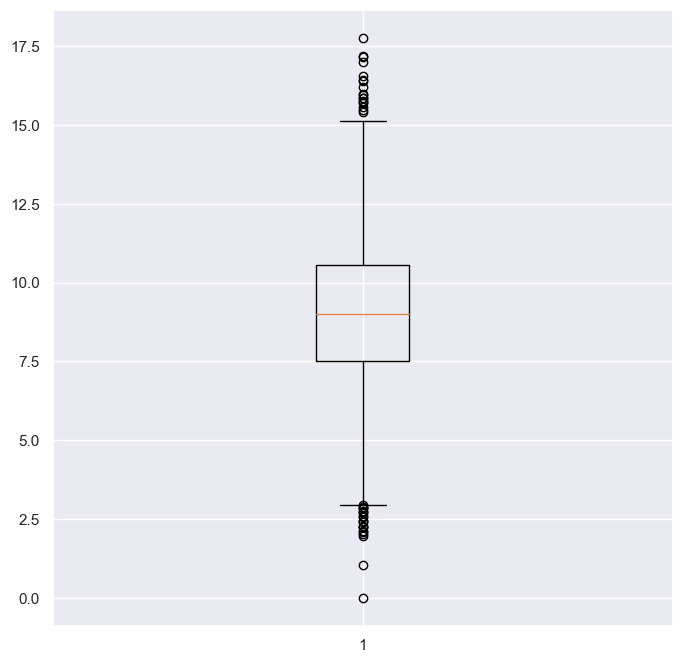

In [122]:
plt.figure(figsize=(8,8))
night_charge = plt.boxplot(df['night.charge'])

In [123]:
outlier_points_ncharge = night_charge["fliers"][0].get_data()[1]
outlier_ncharge = outlier_points_ncharge.tolist()
print(len(outlier_ncharge))
sorted(outlier_ncharge)

39


[0.0,
 1.04,
 1.97,
 2.03,
 2.1,
 2.13,
 2.25,
 2.25,
 2.29,
 2.4,
 2.43,
 2.45,
 2.55,
 2.59,
 2.68,
 2.71,
 2.76,
 2.85,
 2.86,
 2.89,
 2.93,
 15.43,
 15.49,
 15.56,
 15.71,
 15.74,
 15.76,
 15.85,
 15.86,
 15.97,
 15.98,
 16.2,
 16.39,
 16.42,
 16.55,
 16.99,
 17.17,
 17.19,
 17.77]

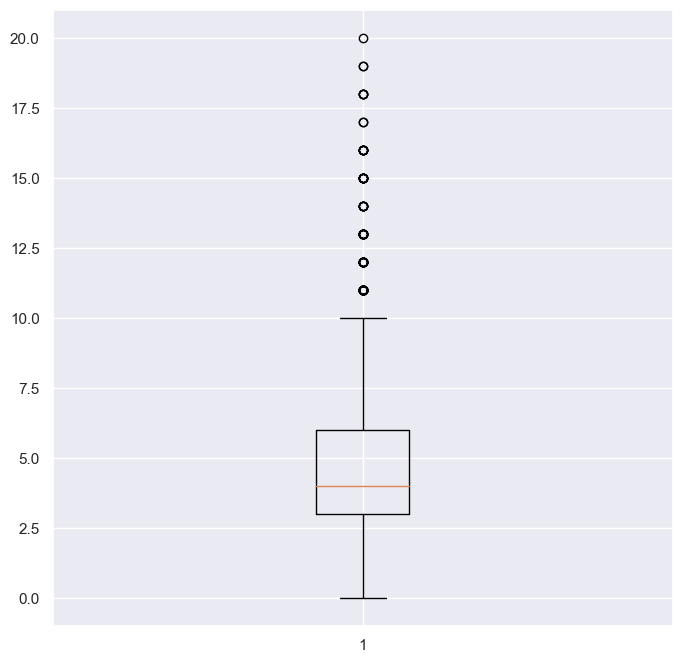

In [124]:
plt.figure(figsize=(8,8))
international_calls = plt.boxplot(df['intl.calls'])

In [125]:
outlier_points_icalls = international_calls["fliers"][0].get_data()[1]
outlier_icalls = outlier_points_icalls.tolist()
print(len(outlier_icalls))
sorted(outlier_icalls)

118


[11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 14,
 14,
 14,
 14,
 14,
 14,
 15,
 15,
 15,
 15,
 15,
 15,
 15,
 15,
 15,
 16,
 16,
 16,
 16,
 16,
 16,
 16,
 17,
 17,
 18,
 18,
 18,
 18,
 19,
 19,
 20]

In [126]:
# using boxplot
LB, UB = calculate_outliers_boxplot('intl.calls')
print(LB,UB)
outlier_wrt_boxplot_ic_UB = df[df['intl.calls']> UB]
print(outlier_wrt_boxplot_ic_UB.shape)
outlier_wrt_boxplot_ic_UB.head()

-1.5 10.5
(118, 20)


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
22,AZ,area_code_415,130,0,0,0,9.5,19,2.57,183.0,112,31.11,72.9,99,6.20,181.8,78,8.18,0,0
41,MD,area_code_408,135,1,41,1,14.6,15,3.94,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,0,1
153,RI,area_code_415,56,0,0,0,6.9,11,1.86,226.0,112,38.42,248.5,118,21.12,140.5,142,6.32,1,0
182,NY,area_code_408,67,1,36,0,9.9,12,2.67,115.6,111,19.65,237.7,94,20.20,169.9,103,7.65,2,0
185,NM,area_code_415,73,0,0,0,10.8,13,2.92,214.3,145,36.43,268.5,135,22.82,241.2,92,10.85,1,0


In [127]:
# using z-scores
LL,UL = calculate_zscores('intl.calls')
print(LL, UL)
outlier_wrt_std_dev_ic_UL = df[df['intl.calls']> UL ]
print(outlier_wrt_std_dev_ic_UL.shape)
outlier_wrt_std_dev_ic_UL.head(5)

-2.945 11.812
(73, 20)


,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
22,AZ,area_code_415,130,0,0,0,9.5,19,2.57,183.0,112,31.11,72.9,99,6.20,181.8,78,8.18,0,0
41,MD,area_code_408,135,1,41,1,14.6,15,3.94,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,0,1
182,NY,area_code_408,67,1,36,0,9.9,12,2.67,115.6,111,19.65,237.7,94,20.20,169.9,103,7.65,2,0
185,NM,area_code_415,73,0,0,0,10.8,13,2.92,214.3,145,36.43,268.5,135,22.82,241.2,92,10.85,1,0
219,AL,area_code_415,106,0,0,0,7.1,12,1.92,223.0,121,37.91,110.1,98,9.36,188.7,107,8.49,0,0


In [128]:
# merging outlier code for zscores and boxplot
outlier_ic_UB = pd.merge(outlier_wrt_boxplot_ic_UB, outlier_wrt_std_dev_ic_UL, left_index=True, right_index=True)
print(outlier_ic_UB.shape)
outlier_ic_UB.iloc[:,12:18]

(73, 40)


,eve.mins_x,eve.calls_x,eve.charge_x,night.mins_x,night.calls_x,night.charge_x
22,72.9,99,6.20,181.8,78,8.18
41,203.9,107,17.33,122.2,78,5.50
182,237.7,94,20.20,169.9,103,7.65
185,268.5,135,22.82,241.2,92,10.85
219,110.1,98,9.36,188.7,107,8.49
...,...,...,...,...,...,...
4478,161.2,99,13.70,229.2,81,10.31
4652,226.8,107,19.28,187.6,66,8.44
4679,228.0,82,19.38,169.8,113,7.64
4693,237.2,103,20.16,258.8,91,11.65


# Feature Importance

# Mutual Information — Analysis of linear and nonlinear relationships
Mutual information score measures the mutual dependency between two variables based on entropy estimations.In machine learning, we are interested in evaluating the degree of dependency between each independent variable and the response variable. Higher values of mutual information show a higher degree of dependency which indicates that the independent variable will be useful for predicting the target.

The Scikit-Learn library has implemented mutual information in the metrics package. The following code computes the mutual information score between each categorical variable of the data set and the Churn variable.

In [129]:
import sklearn
from sklearn.metrics.cluster import mutual_info_score

In [130]:
# function that computes the mutual infomation score between a categorical serie and the column Churn
# for df including state and area code
def compute_mutual_information(categorical_serie):
    return mutual_info_score(categorical_serie, df.churn)

# select categorial variables excluding the response variable 
categorical_variables = df.drop('churn', axis=1)

# compute the mutual information score between each categorical variable and the target
feature_importance_df = categorical_variables.apply(compute_mutual_information).sort_values(ascending=False)

# visualize feature importance
print(feature_importance_df)

day.mins          0.235892
day.charge        0.235892
eve.mins          0.191426
night.mins        0.176764
eve.charge        0.173627
night.charge      0.105742
customer.calls    0.035043
intl.plan         0.025527
intl.charge       0.022183
intl.mins         0.022183
account.length    0.019728
day.calls         0.014010
night.calls       0.012243
voice.messages    0.012173
eve.calls         0.012117
state             0.009921
voice.plan        0.006970
intl.calls        0.005548
area.code         0.000061
dtype: float64


<AxesSubplot: >

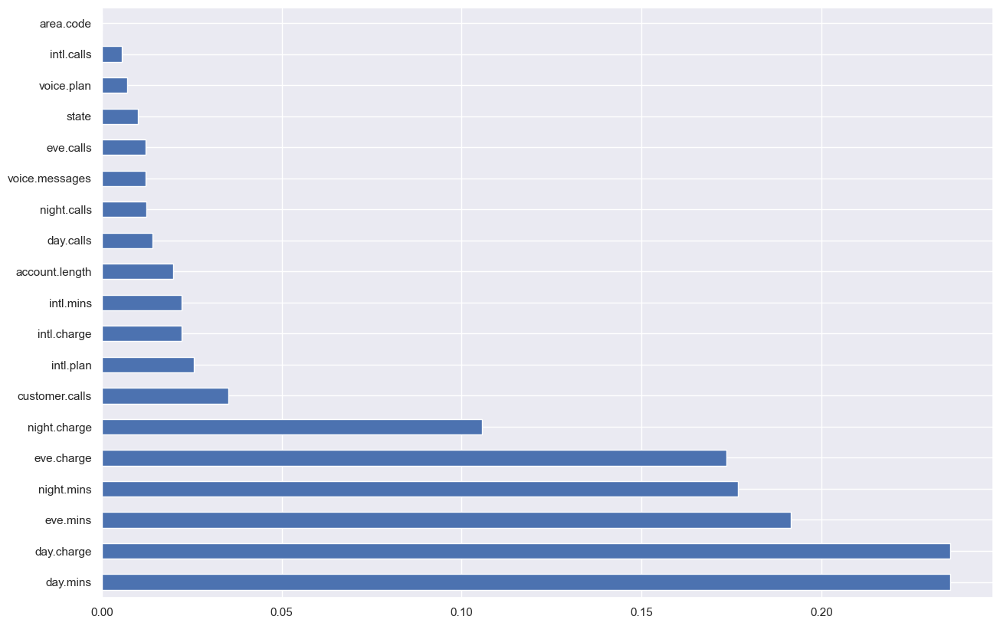

In [131]:
feature_importance_df.plot(kind='barh')

Since you can see area_code and state are unimportant and unrelated to target variable churn, so we can drop them
And we already did in pre_df in start, so we will use pre_df

In [132]:
# function that computes the mutual infomation score between a categorical serie and the column Churn
def compute_mutual_information(categorical_serie):
    return mutual_info_score(categorical_serie, pre_df.churn)

# select categorial variables excluding the response variable 
categorical_variables = pre_df.drop('churn', axis=1)

# compute the mutual information score between each categorical variable and the target
feature_importance = categorical_variables.apply(compute_mutual_information).sort_values(ascending=False)

# visualize feature importance
print(feature_importance)

day_mins          0.235892
day_charge        0.235892
eve_mins          0.191426
night_mins        0.176764
eve_charge        0.173627
night_charge      0.105742
customer_calls    0.035043
intl_plan         0.025527
intl_mins         0.022183
intl_charge       0.022183
account_length    0.019728
day_calls         0.014010
night_calls       0.012243
voice_messages    0.012173
eve_calls         0.012117
voice_plan        0.006970
intl_calls        0.005548
dtype: float64


<AxesSubplot: >

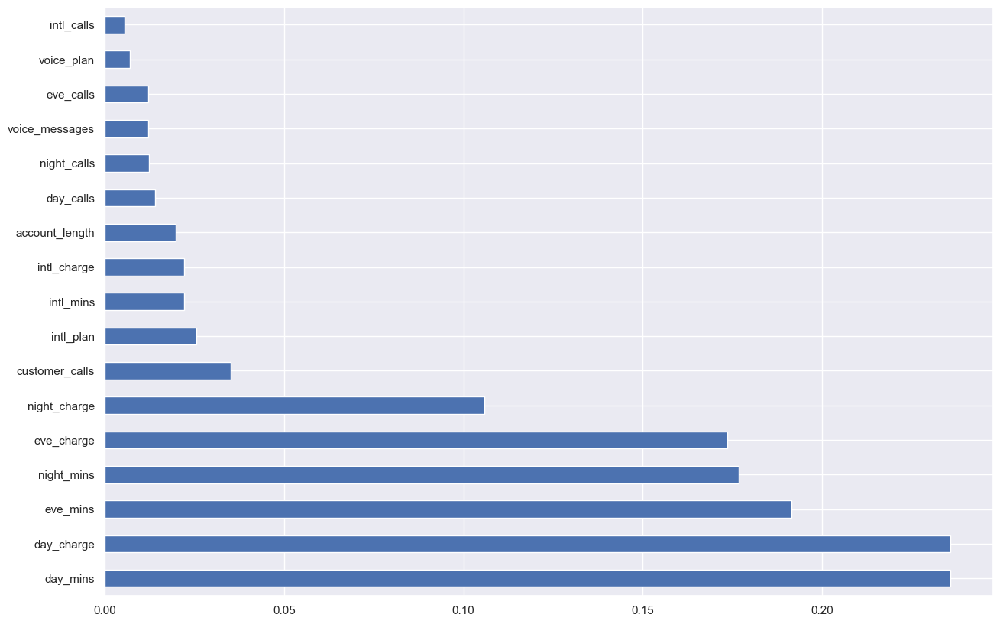

In [133]:
feature_importance.plot(kind='barh')

Mutual information allows us not only to better understand our data but also to identify the predictor variables that are completely independent of the target.

As shown above, area.code, state, Voice.Plan and intl.calls have a mutual information score really close to 0, meaning those variables do not have a strong relationship with the target. This information is in line with the conclusions we have previously drawn by visualizing the data. In the following steps, we should consider removing those variables from the data set before training as they do not provide useful information for predicting the outcome.

The mutual information extends the notion of correlation to nonlinear relationships since, unlike Pearson’s correlation coefficient, this method is able to detect not only linear relationships but also nonlinear ones.

# Feature Engineering

# Feature Importance - Correlation Matrix / Mutual Information Gain / Anova Test
Correlation Matrix

We are often interested in understanding the relationship between two variables.

1. -1 indicates a perfectly negative linear correlation between two variables.
2. 0 indicates no linear correlation between two variables.
3. 1 indicates a perfectly positive linear correlation between two variables.

The further away the correlation coefficient is from zero, the stronger the relationship between the two variables.

<AxesSubplot: >

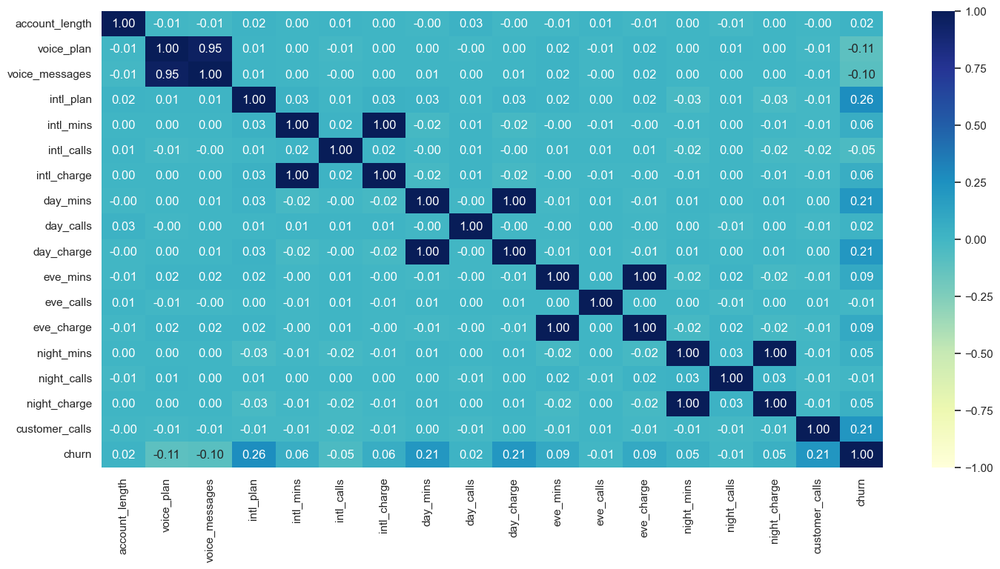

In [134]:
corr_matrix = pre_df.corr()
plt.figure(figsize=(17,8))
sns.heatmap(corr_matrix, annot=True, cmap="YlGnBu", vmax=1, vmin=-1, fmt='.2f')

In [135]:
pre_df.corr().sort_values("churn")["churn"]

voice_plan       -0.111879
voice_messages   -0.098588
intl_calls       -0.046513
night_calls      -0.006732
eve_calls        -0.005534
day_calls         0.016067
account_length    0.021307
night_charge      0.045484
night_mins        0.045488
intl_charge       0.062028
intl_mins         0.062034
eve_charge        0.089097
eve_mins          0.089104
day_charge        0.207956
day_mins          0.207961
customer_calls    0.213432
intl_plan         0.260779
churn             1.000000
Name: churn, dtype: float64

1. By looking at the above Correlation Matrix, We can observe that International Plan,Customer call are the important features.
2. one close to zero are unimportant, so day_calls, eve_calls, night_calls, account_length are unimportant

# Mutual Information Gain
Information Gain measures the reduction in entropy or surprise by splitting a dataset according to a given value of a random variable. A larger information gain suggests a lower entropy group or groups of samples, and hence less surprise. Lower probability events have more information, higher probability events have less information. Entropy quantifies how much information there is in a random variable, or more specifically its probability distribution. A skewed distribution has a low entropy, whereas a distribution where events have equal probability has a larger entropy.

In [136]:
x = pre_df.iloc[:,0:18]
x.head()

,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0


In [137]:
y = pre_df.iloc[:,-1]
y.head()

0    0
1    0
2    0
3    0
4    0
Name: churn, dtype: int64

In [138]:
from sklearn.feature_selection import mutual_info_classif, SelectKBest, f_classif
importances = mutual_info_classif(x,y)
importances

array([0.   , 0.005, 0.002, 0.026, 0.005, 0.005, 0.006, 0.057, 0.   ,
       0.059, 0.001, 0.   , 0.   , 0.   , 0.004, 0.005, 0.038, 0.409])

In [139]:
importance_list = pd.Series(importances)
feature_name_list = pre_df.columns
print(feature_name_list)

Index(['account_length', 'voice_plan', 'voice_messages', 'intl_plan',
       'intl_mins', 'intl_calls', 'intl_charge', 'day_mins', 'day_calls',
       'day_charge', 'eve_mins', 'eve_calls', 'eve_charge', 'night_mins',
       'night_calls', 'night_charge', 'customer_calls', 'churn'],
      dtype='object')


In [140]:
df_feature_importance = pd.DataFrame()
df_feature_importance['Feature'] = feature_name_list
df_feature_importance['IG'] = importance_list
df_feature_importance.sort_values(by='IG', ascending=False)

,Feature,IG
17,churn,0.408562
9,day_charge,0.059382
7,day_mins,0.057091
16,customer_calls,0.037879
3,intl_plan,0.026306
6,intl_charge,0.006407
4,intl_mins,0.005144
15,night_charge,0.004982
5,intl_calls,0.004757
1,voice_plan,0.004707


<AxesSubplot: xlabel='IG', ylabel='Feature'>

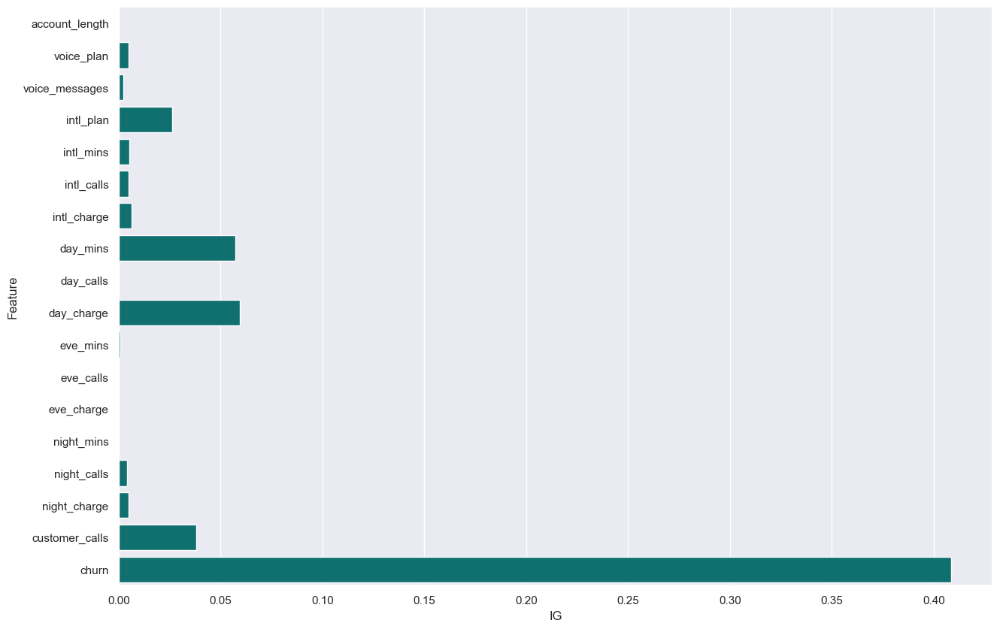

In [141]:
sns.barplot(x='IG', y='Feature', data=df_feature_importance, color='teal')

1. ('day_min','day_charge','customer_calls') == important features
2. eve_calls, day_calls, eve_mins, night_mins, night_calls, account_length	are unimportant according to Mutal Inportance gain

# Anova Test

Analysis of Variance is a statistical method, used to check the means of two or more groups that are significantly different from each other. It assumes Hypothesis as

H0: Means of all groups are equal.

H1: At least one mean of the groups are different.

In [142]:
x = pre_df.iloc[:,0:18]
print(x.shape)
y = pre_df['churn']
print(y.shape)

(4969, 18)
(4969,)


In [143]:
# define feature selection
fs = SelectKBest(score_func=f_classif, k=18)
x_selected = fs.fit(x,y)

In [144]:
print("P values")
np.round(x_selected.pvalues_,3)

P values


array([0.133, 0.   , 0.   , 0.   , 0.   , 0.001, 0.   , 0.   , 0.257,
       0.   , 0.   , 0.697, 0.   , 0.001, 0.635, 0.001, 0.   , 0.   ])

In [145]:
print('f1 scores')
np.round(x_selected.scores_,3)

f1 scores


array([2.256e+00, 6.296e+01, 4.875e+01, 3.624e+02, 1.919e+01, 1.077e+01,
       1.918e+01, 2.245e+02, 1.283e+00, 2.245e+02, 3.975e+01, 1.520e-01,
       3.974e+01, 1.030e+01, 2.250e-01, 1.030e+01, 2.371e+02,       inf])

In [146]:
#creating dataframe of f1scores & pvalues

df_anova = pd.DataFrame()
list_pvalues = pd.Series(np.round(x_selected.pvalues_,3))
list_fscores = x_selected.scores_
list_cols    = x.columns
df_anova['Features'] = list_cols
df_anova['F scores'] = list_fscores
df_anova['Pvalues']  = list_pvalues
df_anova.sort_values(by='F scores', ascending=False)

,Features,F scores,Pvalues
17,churn,inf,0.000
3,intl_plan,362.432573,0.000
16,customer_calls,237.061097,0.000
7,day_mins,224.522483,0.000
9,day_charge,224.511328,0.000
1,voice_plan,62.959702,0.000
2,voice_messages,48.751195,0.000
10,eve_mins,39.751024,0.000
12,eve_charge,39.744800,0.000
4,intl_mins,19.188216,0.000


<AxesSubplot: xlabel='F scores', ylabel='Features'>

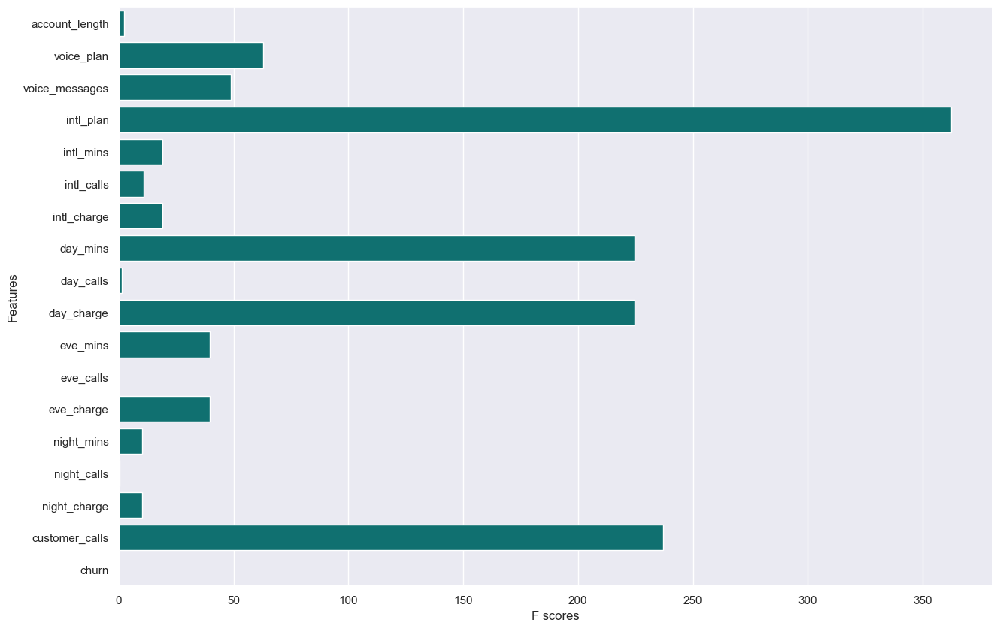

In [147]:
sns.barplot(x='F scores', y='Features', data=df_anova, color='teal')

The result is very significant that after the ANOVA Test. We find out that International Plan,and Customer Calls are the important features.

night_charges, account_length, day_calls, night_calls, eve_calls are unimportant according to anova testing

# Multicollinearity - Variance Inflation Factor (VIF)

In [148]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return(vif)

In [149]:
X  = pre_df.iloc[:,:-1]
print(X.shape)
y = pre_df[['churn']]
print(y.shape)

(4969, 17)
(4969, 1)


<AxesSubplot: >

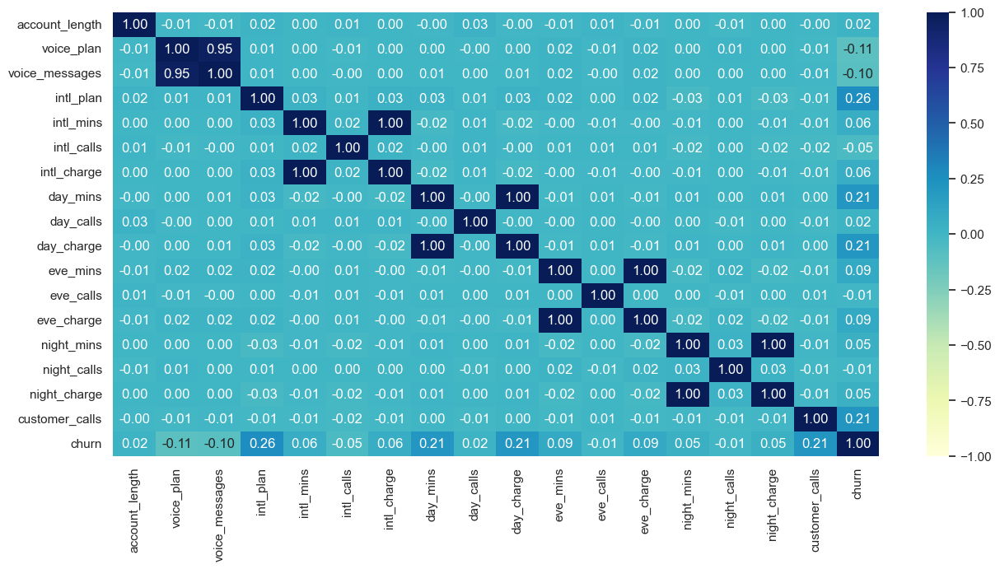

In [150]:
corr = pre_df.corr()
plt.figure(figsize=(15,7))
sns.heatmap(corr, annot=True, cmap="YlGnBu", vmax=1, vmin=-1, fmt='.2f')

In [151]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

df_vif = calc_vif(X)
df_vif.sort_values(by='VIF', ascending=False)

,variables,VIF
9,day_charge,1.245474e+08
7,day_mins,1.245429e+08
12,eve_charge,3.727677e+07
10,eve_mins,3.727567e+07
15,night_charge,1.056354e+07
13,night_mins,1.056347e+07
6,intl_charge,1.011965e+06
4,intl_mins,1.011459e+06
8,day_calls,2.197681e+01
11,eve_calls,2.186407e+01


By Looking at above Features importance, i made a conclusion that 
1. Corr = day_calls, eve_calls, night_calls, account_length
2. Anova = night_charges, account_length, day_calls, night_calls, eve_calls
3. Mutal Information gain = eve_calls, day_calls, eve_mins, night_calls, night_mins, account_length 
have less importance among all

In [152]:
pre_df.drop(labels=['account_length','day_calls','night_calls','eve_calls'], axis=1, inplace=True)

In [153]:
pre_df

,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_charge,eve_mins,eve_charge,night_mins,night_charge,customer_calls,churn
0,1,25,0,10.0,3,2.70,265.1,45.07,197.4,16.78,244.7,11.01,1,0
1,1,26,0,13.7,3,3.70,161.6,27.47,195.5,16.62,254.4,11.45,1,0
2,0,0,0,12.2,5,3.29,243.4,41.38,121.2,10.30,162.6,7.32,0,0
3,0,0,1,6.6,7,1.78,299.4,50.90,61.9,5.26,196.9,8.86,2,0
4,0,0,1,10.1,3,2.73,166.7,28.34,148.3,12.61,186.9,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1,40,0,9.9,5,2.67,235.7,40.07,223.0,18.96,297.5,13.39,2,0
4996,0,0,0,14.7,2,3.97,184.2,31.31,256.8,21.83,213.6,9.61,3,1
4997,0,0,0,13.6,4,3.67,140.6,23.90,172.8,14.69,212.4,9.56,1,0
4998,0,0,0,8.5,6,2.30,188.8,32.10,171.7,14.59,224.4,10.10,0,0


In [154]:
pre_df.shape

(4969, 14)

In [155]:
# again plotting vif for remaining 14 features
X_vif_1  = pre_df.iloc[:,:-1]
print(X_vif_1.shape)

df_vif_1 = calc_vif(X_vif_1)
df_vif_1.sort_values(by='VIF', ascending=False)

(4969, 13)


,variables,VIF
7,day_charge,1.244759e+08
6,day_mins,1.244720e+08
9,eve_charge,3.722232e+07
8,eve_mins,3.722189e+07
11,night_charge,1.055624e+07
10,night_mins,1.055613e+07
5,intl_charge,1.011394e+06
3,intl_mins,1.010910e+06
0,voice_plan,1.528406e+01
1,voice_messages,1.492900e+01


In [156]:
# stopping here
# also deleting more features can cause loss of information
X_vif_1  = pre_df.iloc[:,:-1]
print(X_vif_1.shape)

df_vif_2 = calc_vif(X_vif_1)
df_vif_2.sort_values(by='VIF', ascending=False)

(4969, 13)


,variables,VIF
7,day_charge,1.244759e+08
6,day_mins,1.244720e+08
9,eve_charge,3.722232e+07
8,eve_mins,3.722189e+07
11,night_charge,1.055624e+07
10,night_mins,1.055613e+07
5,intl_charge,1.011394e+06
3,intl_mins,1.010910e+06
0,voice_plan,1.528406e+01
1,voice_messages,1.492900e+01


# Splitting the data in training and testing sets

In [157]:
X  = pre_df.iloc[:,:-1]
print(X.shape)
y = pre_df[['churn']]
print(y.shape)

(4969, 13)
(4969, 1)


In [158]:
from sklearn.model_selection import train_test_split, cross_validate

df_raw = pd.DataFrame(columns=[['Models','Accuracy_tr','Accuracy_ts','F1-score_1']])
tr_acc_list = []
ts_acc_list = []
ts_f1_list  = []

#on raw data
x_train,x_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=10, stratify=y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(3975, 13)
(994, 13)
(3975, 1)
(994, 1)


# Model Evaluation

In [159]:
import math
import scipy.stats as stats

from sklearn.model_selection import train_test_split, cross_validate
from sklearn.feature_selection import mutual_info_classif, SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score,  confusion_matrix, f1_score, make_scorer, roc_auc_score, classification_report
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

# Logistic Regression

In [160]:
print('\n\nLogistic Regression')
lr_model = LogisticRegression(random_state= 11)
lr_model.fit(x_train,y_train)
y_pred_train_lr = lr_model.predict(x_train)
y_pred_test_lr  = lr_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_lr),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_lr),2))
print(np.round(confusion_matrix(y_test,y_pred_test_lr),2))
print(classification_report(y_test,y_pred_test_lr))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_lr),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_lr),2))

cl_report_lr = classification_report(y_test,y_pred_test_lr, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_lr),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_lr),2)) 
ts_f1_list.append(np.round(cl_report_lr['1']['f1-score'],2))



Logistic Regression
Training Accuracy =  0.86
Testing Accuracy =  0.86
[[834  19]
 [116  25]]
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       853
           1       0.57      0.18      0.27       141

    accuracy                           0.86       994
   macro avg       0.72      0.58      0.60       994
weighted avg       0.83      0.86      0.83       994

Training ROC AUC score=  0.58
Testing ROC AUC score=  0.58


AxesSubplot(0.125,0.11;0.775x0.77)


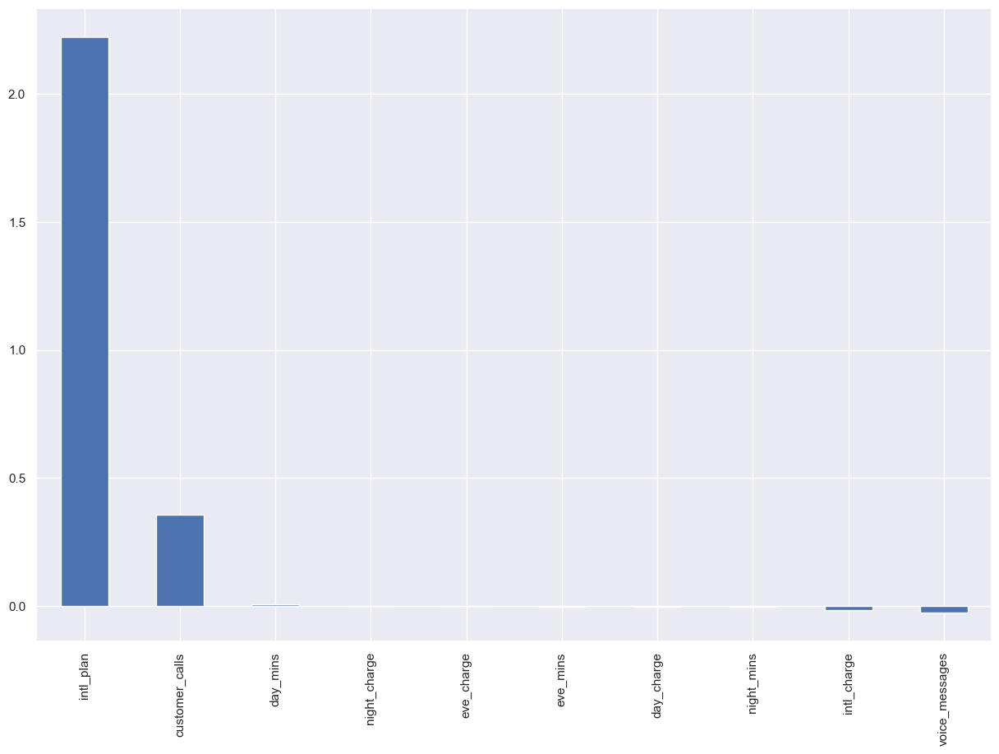

In [161]:
# To get the weights of all the variables
weights = pd.Series(lr_model.coef_[0], index=X.columns.values)
print (weights.sort_values(ascending = False)[:10].plot(kind='bar'))

AxesSubplot(0.125,0.11;0.775x0.77)


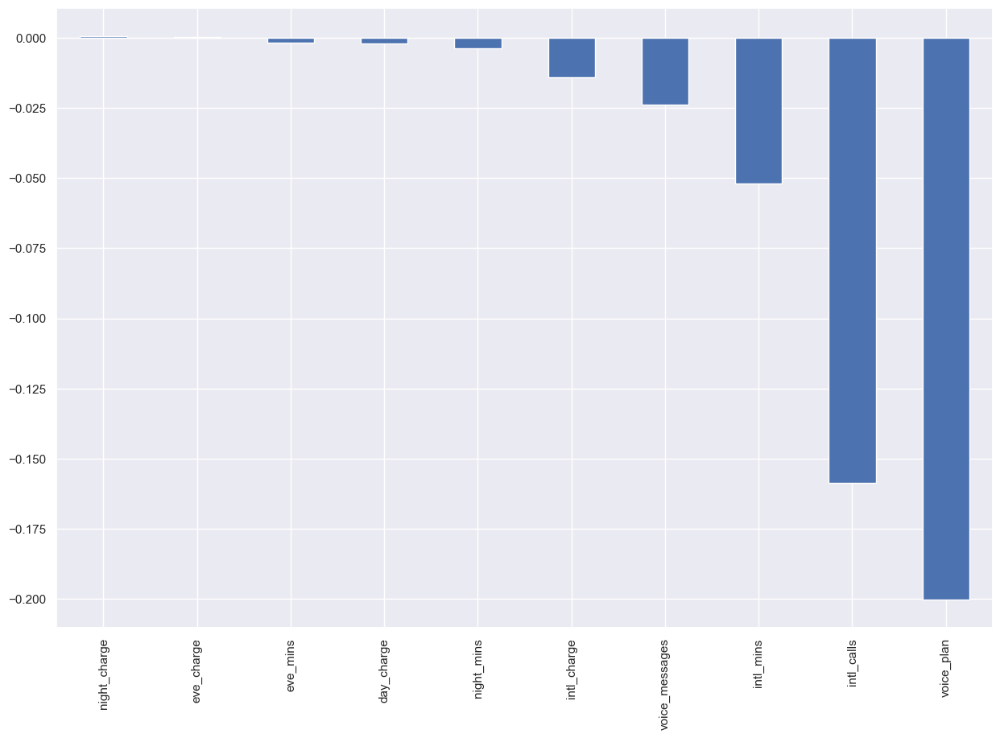

In [162]:
print(weights.sort_values(ascending = False)[-10:].plot(kind='bar'))

# Support Vector Machine (SVM)

In [163]:
from sklearn.svm import SVC

In [164]:
print('\n\nSupport Vector Machine')
svm_model = SVC(random_state= 11)
svm_model.fit(x_train,y_train)
y_pred_train_svm = svm_model.predict(x_train)
y_pred_test_svm  = svm_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_svm),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_svm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_svm),2))
print(classification_report(y_test,y_pred_test_svm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_svm),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_svm),2))

cl_report_svm = classification_report(y_test,y_pred_test_svm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_svm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_svm),2)) 
ts_f1_list.append(np.round(cl_report_svm['1']['f1-score'],2))



Support Vector Machine
Training Accuracy =  0.87
Testing Accuracy =  0.87
[[853   0]
 [132   9]]
              precision    recall  f1-score   support

           0       0.87      1.00      0.93       853
           1       1.00      0.06      0.12       141

    accuracy                           0.87       994
   macro avg       0.93      0.53      0.52       994
weighted avg       0.88      0.87      0.81       994

Training ROC AUC score=  0.53
Testing ROC AUC score=  0.53


In [165]:
# Create the Confusion matrix
from sklearn.metrics import classification_report, confusion_matrix  
print(confusion_matrix(y_test,y_pred_test_svm)) 

[[853   0]
 [132   9]]


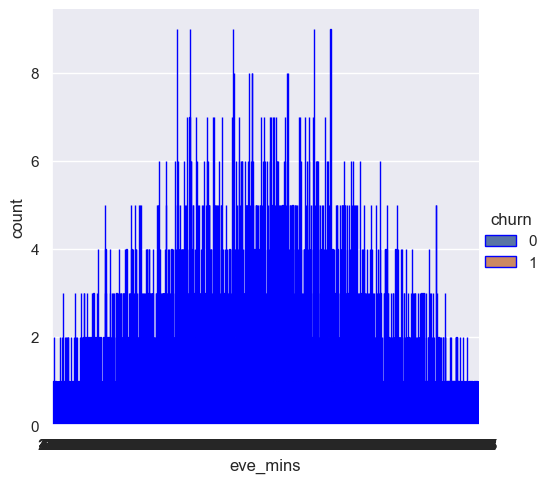

In [166]:
ax1 = sns.catplot(x="eve_mins", kind="count", hue="churn", data=pre_df,
                  estimator=lambda x: sum(x==0)*100.0/len(x), edgecolor='blue')

# Random Forest

In [167]:
print('\n\nRandom Forest')
rf_model = RandomForestClassifier(n_estimators=100, random_state=99, max_depth=3)
rf_model.fit(x_train,y_train)
y_pred_train_rf = rf_model.predict(x_train)
y_pred_test_rf  = rf_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_rf),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_rf),2))
print(np.round(confusion_matrix(y_test,y_pred_test_rf),2))
print(classification_report(y_test,y_pred_test_rf))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_rf),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_rf),2))

cl_report_rf = classification_report(y_test,y_pred_test_rf, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_rf),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_rf),2)) 
ts_f1_list.append(np.round(cl_report_rf['1']['f1-score'],2))



Random Forest
Training Accuracy =  0.89
Testing Accuracy =  0.89
[[853   0]
 [114  27]]
              precision    recall  f1-score   support

           0       0.88      1.00      0.94       853
           1       1.00      0.19      0.32       141

    accuracy                           0.89       994
   macro avg       0.94      0.60      0.63       994
weighted avg       0.90      0.89      0.85       994

Training ROC AUC score=  0.61
Testing ROC AUC score=  0.6


<AxesSubplot: >

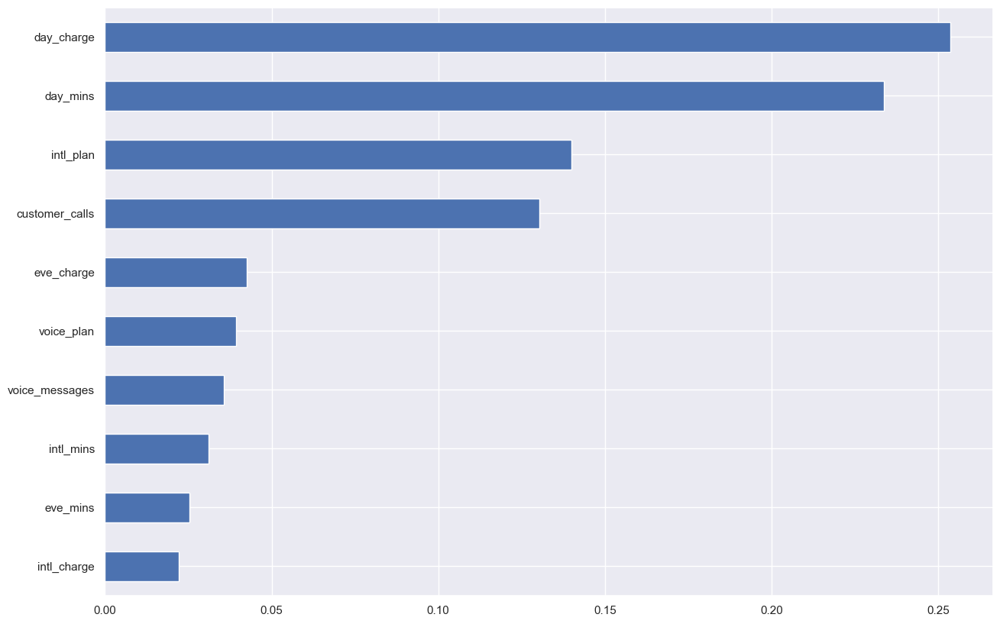

In [168]:
importances = rf_model.feature_importances_
weights = pd.Series(importances,
                 index=X.columns.values)
weights.sort_values()[-10:].plot(kind = 'barh')

# Gaussian NB

In [169]:
print('\n\nGaussian NB')
gnb_model = GaussianNB()
gnb_model.fit(x_train, y_train)
y_pred_train_gnb = gnb_model.predict(x_train)
y_pred_test_gnb  = gnb_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_gnb),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_gnb),2))
print(np.round(confusion_matrix(y_test,y_pred_test_gnb),2))
print(classification_report(y_test,y_pred_test_gnb))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_gnb),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test, y_pred_test_gnb),2))

cl_report_gnb = classification_report(y_test,y_pred_test_gnb, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_gnb),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test, y_pred_test_gnb),2)) 
ts_f1_list.append(np.round(cl_report_gnb['1']['f1-score'],2))



Gaussian NB
Training Accuracy =  0.87
Testing Accuracy =  0.87
[[790  63]
 [ 70  71]]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       853
           1       0.53      0.50      0.52       141

    accuracy                           0.87       994
   macro avg       0.72      0.71      0.72       994
weighted avg       0.86      0.87      0.86       994

Training ROC AUC score=  0.74
Testing ROC AUC score=  0.71


# Decision Tree

In [170]:
print('\n\nDecision Tree')
dt_model = DecisionTreeClassifier(random_state= 117)
dt_model.fit(x_train,y_train)
y_pred_train_dt = dt_model.predict(x_train)
y_pred_test_dt  = dt_model.predict(x_test)
print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_dt),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_dt),2))
print(np.round(confusion_matrix(y_test,y_pred_test_dt),2))
print(classification_report(y_test,y_pred_test_dt))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_dt),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_dt),2))

cl_report_dt = classification_report(y_test,y_pred_test_dt, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_dt),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_dt),2)) 
ts_f1_list.append(np.round(cl_report_dt['1']['f1-score'],2))



Decision Tree
Training Accuracy =  1.0
Testing Accuracy =  0.93
[[826  27]
 [ 39 102]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       853
           1       0.79      0.72      0.76       141

    accuracy                           0.93       994
   macro avg       0.87      0.85      0.86       994
weighted avg       0.93      0.93      0.93       994

Training ROC AUC score=  1.0
Testing ROC AUC score=  0.85


# XGBoost Classifier

In [171]:
print('\n\nXgboost')
xgb_model = XGBClassifier()
xgb_model.fit(x_train,y_train)
y_pred_train_xgb  = xgb_model.predict(x_train)
y_pred_test_xgb   = xgb_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_xgb),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_xgb),2))
print(np.round(confusion_matrix(y_test,y_pred_test_xgb),2))
print(classification_report(y_test,y_pred_test_xgb))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_xgb),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_xgb),2))

cl_report_xgb = classification_report(y_test,y_pred_test_xgb, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_train, y_pred_train_xgb),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_xgb),2)) 
ts_f1_list.append(np.round(cl_report_xgb['1']['f1-score'],2))



Xgboost
[20:21:56] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training Accuracy =  1.0
Testing Accuracy =  0.95
[[850   3]
 [ 42  99]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       853
           1       0.97      0.70      0.81       141

    accuracy                           0.95       994
   macro avg       0.96      0.85      0.89       994
weighted avg       0.96      0.95      0.95       994

Training ROC AUC score=  1.0
Testing ROC AUC score=  0.85


In [172]:
print('\n\nRaw Data Score')
model_string =['LR', 'NB', 'DT','RF','XGBoost', 'SVM'] 
df_raw['Models'] = model_string
df_raw['Accuracy_tr'] = tr_acc_list
df_raw['Accuracy_ts'] = ts_acc_list
df_raw['F1-score_1'] = ts_f1_list
df_raw



Raw Data Score


,Models,Accuracy_tr,Accuracy_ts,F1-score_1
0,LR,0.86,0.86,0.27
1,NB,0.87,0.87,0.12
2,DT,0.89,0.89,0.32
3,RF,0.87,0.87,0.52
4,XGBoost,1.00,0.93,0.76
5,SVM,1.00,0.95,0.81


1. Accuracy is high for DT, XGBoost & SVM
2. F1 score is good for XGBoost & SVM
3. F1 score is very low for all other models

# Scaled Data - Standard Scaler

In [173]:
df_scaled = pd.DataFrame(columns=[['Models','Accuracy_tr','Accuracy_ts','F1-score_1']])
tr_acc_list_scaled = []
ts_acc_list_scaled = []
ts_f1_list_scaled  = []

#on raw data
scaler = StandardScaler()
x_scaled = scaler.fit_transform(X) 

x_train,x_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=10, stratify=y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(3975, 13)
(994, 13)
(3975, 1)
(994, 1)


In [174]:
# logistic Regression
print('Logistic Regression')
lr_model = LogisticRegression(random_state= 13)
lr_model.fit(x_train,y_train)
y_pred_train_lr = lr_model.predict(x_train)
y_pred_test_lr = lr_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_lr),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_lr),2))
print(np.round(confusion_matrix(y_test,y_pred_test_lr),2))
print(classification_report(y_test,y_pred_test_lr))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_lr),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_lr),2))

cl_report_lr = classification_report(y_test,y_pred_test_lr, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_lr),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_lr),2)) 
ts_f1_list_scaled.append(np.round(cl_report_lr['1']['f1-score'],2))

# Gaussian NB
print('\n\nGaussian NB')
gnb_model = GaussianNB()
gnb_model.fit(x_train, y_train)
y_pred_train_gnb = gnb_model.predict(x_train)
y_pred_test_gnb = gnb_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_gnb),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_gnb),2))
print(np.round(confusion_matrix(y_test,y_pred_test_gnb),2))
print(classification_report(y_test,y_pred_test_gnb))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_gnb),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_gnb),2))

cl_report_gnb = classification_report(y_test,y_pred_test_gnb, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_gnb),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_gnb),2)) 
ts_f1_list_scaled.append(np.round(cl_report_gnb['1']['f1-score'],2))


#Decision Tree
print('\nDecision Tree')
dt_model = DecisionTreeClassifier(random_state= 100)
dt_model.fit(x_train,y_train)
y_pred_train_dt = dt_model.predict(x_train)
y_pred_test_dt  = dt_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_dt),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_dt),2))
print(np.round(confusion_matrix(y_test,y_pred_test_dt),2))
print(classification_report(y_test,y_pred_test_dt))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_dt),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_dt),2))

cl_report_dt = classification_report(y_test,y_pred_test_dt, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_dt),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_dt),2)) 
ts_f1_list_scaled.append(np.round(cl_report_dt['1']['f1-score'],2))

# Random Forest
print('\nRandom Forest')
rf_model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=99)
rf_model.fit(x_train,y_train)
y_pred_train_rf = rf_model.predict(x_train)
y_pred_test_rf  = rf_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_rf),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_rf),2))
print("F1 score = ",np.round(f1_score(y_test,y_pred_test_rf),2))
print(np.round(confusion_matrix(y_test,y_pred_test_rf),2))
print(classification_report(y_test,y_pred_test_rf))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_rf),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_rf),2))

cl_report_rf = classification_report(y_test,y_pred_test_rf, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_rf),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_rf),2)) 
ts_f1_list_scaled.append(np.round(cl_report_rf['1']['f1-score'],2))


#xgboost classifier
print('\nXgboost')
xgb_model = XGBClassifier()
xgb_model.fit(x_train,y_train)
y_pred_train_xgb  = xgb_model.predict(x_train)
y_pred_test_xgb   = xgb_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_xgb),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_xgb),2))
print(np.round(confusion_matrix(y_test,y_pred_test_xgb),2))
print(classification_report(y_test,y_pred_test_xgb))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_xgb),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_xgb),2))

cl_report_xgb = classification_report(y_test,y_pred_test_xgb, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_xgb),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_xgb),2)) 
ts_f1_list_scaled.append(np.round(cl_report_xgb['1']['f1-score'],2))

#SVM
print('\n\nSupport Vector Machine')
svm_model = SVC()
svm_model.fit(x_train,y_train)
y_pred_train_svm = svm_model.predict(x_train)
y_pred_test_svm  = svm_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_train, y_pred_train_svm),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_svm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_svm),2))
print(classification_report(y_test,y_pred_test_svm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_train, y_pred_train_svm),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_svm),2))

cl_report_svm = classification_report(y_test,y_pred_test_svm, output_dict=True)
tr_acc_list_scaled.append(np.round(accuracy_score(y_train, y_pred_train_svm),2)) 
ts_acc_list_scaled.append(np.round(accuracy_score(y_test,y_pred_test_svm),2)) 
ts_f1_list_scaled.append(np.round(cl_report_svm['1']['f1-score'],2))


Logistic Regression
Training Accuracy =  0.86
Testing Accuracy =  0.86
[[834  19]
 [116  25]]
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       853
           1       0.57      0.18      0.27       141

    accuracy                           0.86       994
   macro avg       0.72      0.58      0.60       994
weighted avg       0.83      0.86      0.83       994

Training ROC AUC score=  0.58
Testing ROC AUC score=  0.58


Gaussian NB
Training Accuracy =  0.87
Testing Accuracy =  0.87
[[790  63]
 [ 70  71]]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       853
           1       0.53      0.50      0.52       141

    accuracy                           0.87       994
   macro avg       0.72      0.71      0.72       994
weighted avg       0.86      0.87      0.86       994

Training ROC AUC score=  0.74
Testing ROC AUC score=  0.71

Decision Tree
Training Accuracy =  1.0
Testin

In [175]:
print('\n\nStandard Scaler Score')
model_string =['LR', 'NB', 'DT','RF','XGBoost','SVM'] 
df_scaled['Models'] = model_string
df_scaled['Accuracy_tr'] = tr_acc_list_scaled
df_scaled['Accuracy_ts'] = ts_acc_list_scaled
df_scaled['F1-score_1'] = ts_f1_list_scaled
df_scaled



Standard Scaler Score


,Models,Accuracy_tr,Accuracy_ts,F1-score_1
0,LR,0.86,0.86,0.27
1,NB,0.87,0.87,0.52
2,DT,1.00,0.93,0.73
3,RF,0.89,0.89,0.32
4,XGBoost,1.00,0.95,0.81
5,SVM,0.87,0.87,0.12


# SMOTE - Synthetic Minority Oversampling Technique

# Smote on Scaled Data

In [176]:
# scaled data
X = pre_df.iloc[:,:-1]
print(X.shape)
y = pre_df[['churn']]
print(y.shape)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(X)

x_train,x_test,y_train,y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=32, stratify=y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(4969, 13)
(4969, 1)
(3975, 13)
(994, 13)
(3975, 1)
(994, 1)


[3411  564]


<AxesSubplot: ylabel='count'>

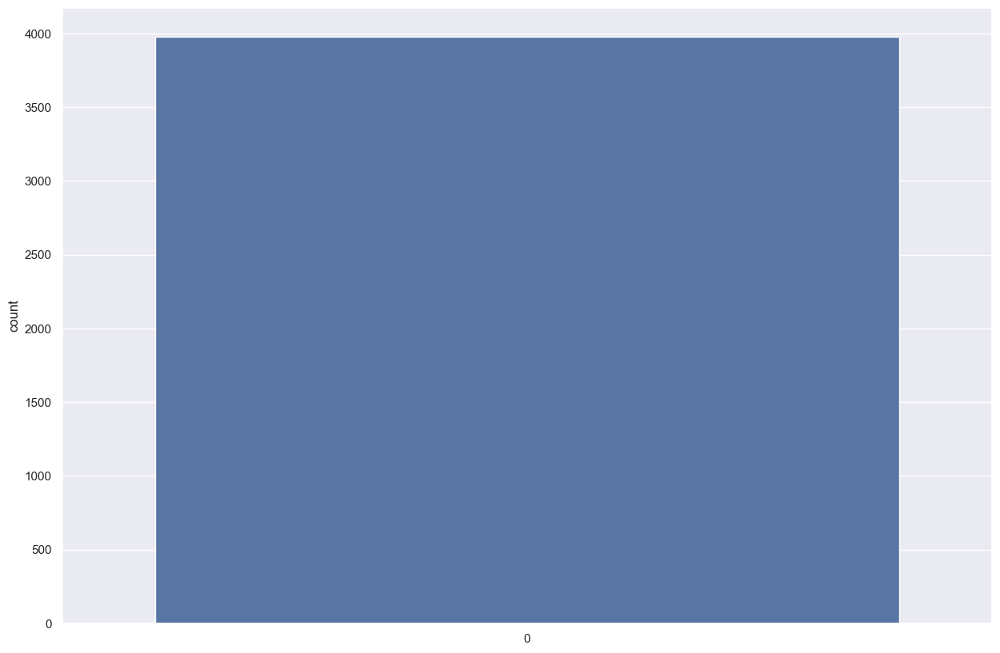

In [177]:
# converts 2d array to 1d array
# the minority class is 386 and 
y_train_1darray = np.ravel(y_train)
print(np.bincount(y_train_1darray))
sns.countplot(y_train_1darray)

In [178]:
# performing smote on training data
sm = SMOTE(sampling_strategy={1:772}, random_state=0)
x_res, y_res = sm.fit_resample(x_train, y_train)

In [179]:
# converts 2d array to 1d array
# the minority class has now become in the ration of 2:5
y_res_1darray = np.ravel(y_res)
np.bincount(y_res_1darray)

array([3411,  772], dtype=int64)

<AxesSubplot: ylabel='count'>

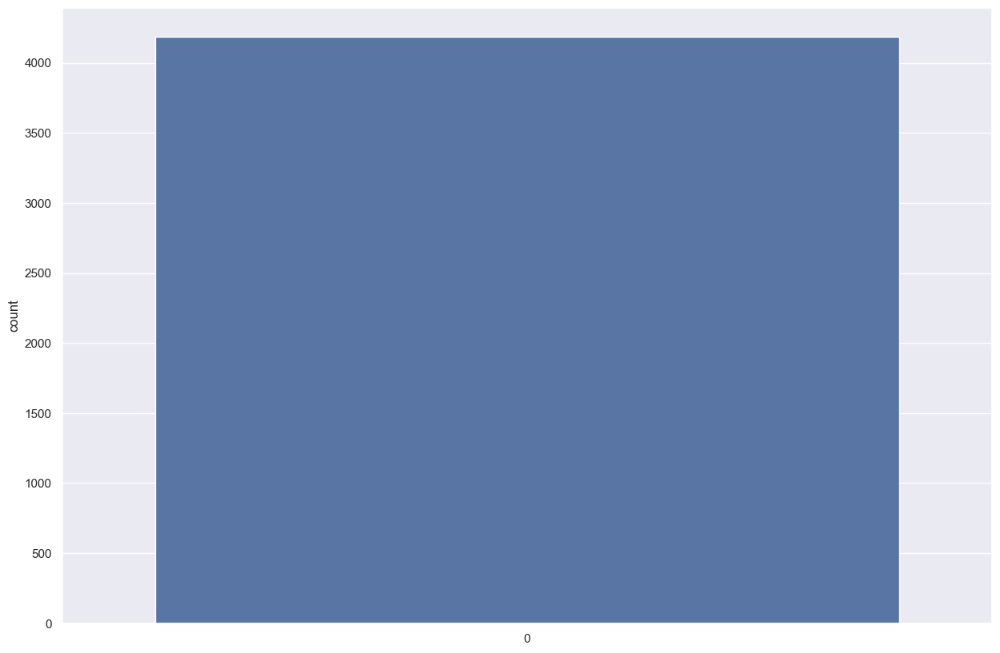

In [180]:
sns.countplot(y_res_1darray)

In [181]:
# now will train the model on the resampled training set using smote
# smote will be done only for training data
# doubled the minority class i.e 1 (churn) from 386 to 772
# Increased the minority class only for training data
# will check on test data after training the model with smote

df_scaled_sm = pd.DataFrame(columns=[['Models','Accuracy_tr','Accuracy_ts','F1-score_1']])
tr_acc_list = []
ts_acc_list = []
ts_f1_list  = []

#Logistic Regression
print('Logistic Regression with SMOTE')
lr_model_sm         = LogisticRegression(random_state= 33)
lr_model_sm.fit(x_res,y_res)
y_pred_train_lr_sm  = lr_model_sm.predict(x_res)#x_train
y_pred_test_lr_sm   = lr_model_sm.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_lr_sm),2))#y_train
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_lr_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_lr_sm),2))
print(classification_report(y_test,y_pred_test_lr_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_lr_sm),2))#y_train
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_lr_sm),2))

cl_report_lr_sm = classification_report(y_test,y_pred_test_lr_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_lr_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_lr_sm),2)) 
ts_f1_list.append(np.round(cl_report_lr_sm['1']['f1-score'],2))

#Gaussian NB
print('\n\nGaussian NB')
gnb_model_sm = GaussianNB()
gnb_model_sm.fit(x_res, y_res)
y_pred_train_gnb_sm = gnb_model_sm.predict(x_res)
y_pred_test_gnb_sm  = gnb_model_sm.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_gnb_sm),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_gnb_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_gnb_sm),2))
print(classification_report(y_test,y_pred_test_gnb_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_gnb_sm),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_gnb_sm),2))

cl_report_gnb_sm = classification_report(y_test,y_pred_test_gnb_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_gnb_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_gnb_sm),2)) 
ts_f1_list.append(np.round(cl_report_gnb_sm['1']['f1-score'],2))

#Decision Tree
print('\nDecision Tree')
dt_model_sm = DecisionTreeClassifier(random_state= 131)
dt_model_sm.fit(x_res,y_res)
y_pred_train_dt_sm = dt_model_sm.predict(x_res)
y_pred_test_dt_sm  = dt_model_sm.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_dt_sm),2))
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_dt_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_dt_sm),2))
print(classification_report(y_test,y_pred_test_dt_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_dt_sm),2))
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_dt_sm),2))

cl_report_dt_sm = classification_report(y_test,y_pred_test_dt_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_dt_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_dt_sm),2)) 
ts_f1_list.append(np.round(cl_report_dt_sm['1']['f1-score'],2))

# Random Forest
print('\nRandom Forest with SMOTE')
rf_model_sm = RandomForestClassifier(n_estimators=100, max_depth= 5)
rf_model_sm.fit(x_res,y_res)
y_pred_train_rf_sm = rf_model_sm.predict(x_res)#x_train
y_pred_test_rf_sm  = rf_model_sm.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_rf_sm),2))#y_train
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_rf_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_rf_sm),2))
print(classification_report(y_test,y_pred_test_rf_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_rf_sm),2))#y_train
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_rf_sm),2))

cl_report_rf_sm = classification_report(y_test,y_pred_test_rf_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_rf_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_rf_sm),2)) 
ts_f1_list.append(np.round(cl_report_rf_sm['1']['f1-score'],2))

#xgboost classifier
print('\nXgboost with SMOTE')
xgb_model_sm = XGBClassifier()
xgb_model_sm.fit(x_res,y_res)
y_pred_train_xgb_sm  = xgb_model_sm.predict(x_res)#x_train
y_pred_test_xgb_sm   = xgb_model_sm.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_xgb_sm),2))#y_train
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_xgb_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_xgb_sm),2))
print(classification_report(y_test,y_pred_test_xgb_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_xgb_sm),2))#y_train
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_xgb_sm),2))

cl_report_xgb_sm = classification_report(y_test,y_pred_test_xgb_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_xgb_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_xgb_sm),2)) 
ts_f1_list.append(np.round(cl_report_xgb_sm['1']['f1-score'],2))

#SVM
print('\n\nSupport Vector Machine')
svm_model = SVC()
svm_model.fit(x_res,y_res)
y_pred_train_svm_sm = svm_model.predict(x_res)
y_pred_test_svm_sm  = svm_model.predict(x_test)

print("Training Accuracy = ",np.round(accuracy_score(y_res, y_pred_train_svm_sm),2))#y_train
print("Testing Accuracy = ",np.round(accuracy_score(y_test,y_pred_test_svm_sm),2))
print(np.round(confusion_matrix(y_test,y_pred_test_svm_sm),2))
print(classification_report(y_test,y_pred_test_svm_sm))
print("Training ROC AUC score= ",np.round(roc_auc_score(y_res, y_pred_train_svm_sm),2))#y_train
print("Testing ROC AUC score= ",np.round(roc_auc_score(y_test,y_pred_test_svm_sm),2))

cl_report_svm_sm = classification_report(y_test,y_pred_test_svm_sm, output_dict=True)
tr_acc_list.append(np.round(accuracy_score(y_res, y_pred_train_svm_sm),2)) 
ts_acc_list.append(np.round(accuracy_score(y_test,y_pred_test_svm_sm),2)) 
ts_f1_list.append(np.round(cl_report_svm_sm['1']['f1-score'],2))


Logistic Regression with SMOTE
Training Accuracy =  0.83
Testing Accuracy =  0.86
[[812  41]
 [ 95  46]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.92       853
           1       0.53      0.33      0.40       141

    accuracy                           0.86       994
   macro avg       0.71      0.64      0.66       994
weighted avg       0.84      0.86      0.85       994

Training ROC AUC score=  0.62
Testing ROC AUC score=  0.64


Gaussian NB
Training Accuracy =  0.86
Testing Accuracy =  0.88
[[787  66]
 [ 52  89]]
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       853
           1       0.57      0.63      0.60       141

    accuracy                           0.88       994
   macro avg       0.76      0.78      0.77       994
weighted avg       0.89      0.88      0.88       994

Training ROC AUC score=  0.75
Testing ROC AUC score=  0.78

Decision Tree
Training Accuracy = 

In [182]:
print('\n\nSmote Score Table')
model_string =['LR', 'NB', 'DT','RF','XGBoost','SVM'] 
df_scaled_sm['Models'] = model_string
df_scaled_sm['Accuracy_tr'] = tr_acc_list
df_scaled_sm['Accuracy_ts'] = ts_acc_list
df_scaled_sm['F1-score_1'] = ts_f1_list
df_scaled_sm



Smote Score Table


,Models,Accuracy_tr,Accuracy_ts,F1-score_1
0,LR,0.83,0.86,0.40
1,NB,0.86,0.88,0.60
2,DT,1.00,0.91,0.70
3,RF,0.94,0.93,0.71
4,XGBoost,1.00,0.95,0.82
5,SVM,0.95,0.94,0.76


# F1 score for all models increased that is why performance better with SMOTE

# Hyperparameter tuning

For hyperparameter tuning, we need to split our training data again into a set for training and a set for testing the hyperparameters (often called validation set). It is a very common practice to use k-fold cross-validation for hyperparameter tuning. The training set is divided again into k equal-sized samples, 1 sample is used for testing and the remaining k-1 samples are used for training the model, repeating the process k times. Then, the k evaluation metrics (in this case the accuracy) are averaged to produce a single estimator.

It is important to stress that the validation set is used for hyperparameter selection and not for evaluating the final performance of our model.

There are multiple techniques to find the best hyperparameters for a model. The most popular methods are (1) grid search, (2) random search, and (3) bayesian optimization.

We've used Random Search method for Hypermeter Tuning.

# Model Optimization - GridSearchCV

In [183]:
Accu_list_tr = []
Accu_list_ts = []
F1_churn_ts = []
F1_nonchurn_ts = []
df_final1 = pd.DataFrame(columns=['Models','TR_Accu','TS_Accu','TS_churn_f1_score','TS_nonchurn_f1_score'])

In [184]:
X = pre_df.iloc[:,:-1]
print(X.shape)
y = pre_df[['churn']]
print(y.shape)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(X)

x_train,x_test,y_train,y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=30, stratify=y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)
x_train

(4969, 13)
(4969, 1)
(3975, 13)
(994, 13)
(3975, 1)
(994, 1)


array([[-0.6  , -0.573, -0.323, ...,  0.021,  0.022, -1.202],
       [ 1.667,  1.421, -0.323, ...,  1.11 ,  1.109,  2.622],
       [-0.6  , -0.573, -0.323, ..., -0.711, -0.712,  1.092],
       ...,
       [-0.6  , -0.573, -0.323, ...,  2.04 ,  2.041, -0.437],
       [-0.6  , -0.573, -0.323, ...,  0.104,  0.106,  0.327],
       [-0.6  , -0.573, -0.323, ...,  0.114,  0.115,  0.327]])

# GridsearchCV - SVM

In [185]:
from sklearn.model_selection import KFold,cross_val_score

fold = KFold(n_splits=5)
results = cross_val_score(model,x,y,cv=fold)
results.min(), results.max()

(1.0, 1.0)

In [186]:
results.std(), results.mean()

(0.0, 1.0)

In [187]:
from sklearn.model_selection import GridSearchCV,KFold

param = {"C":[50,80,100,120,150],'kernel':["rbf","sigmoid","poly"]}

svm_model = SVC(random_state=42)
svm_model_tweaked = GridSearchCV(svm_model,param_grid=param,cv=KFold(n_splits=5))
svm_model_tweaked.fit(x_train,y_train)
print(svm_model_tweaked.best_params_)
print(svm_model_tweaked.best_score_)

{'C': 50, 'kernel': 'poly'}
0.9413836477987422


Training Accuracy =  0.9854088050314466
Testing Accuracy  =  0.9396378269617707
Confusion Matrix =  [[825  28]
 [ 32 109]]
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       853
           1       0.80      0.77      0.78       141

    accuracy                           0.94       994
   macro avg       0.88      0.87      0.87       994
weighted avg       0.94      0.94      0.94       994



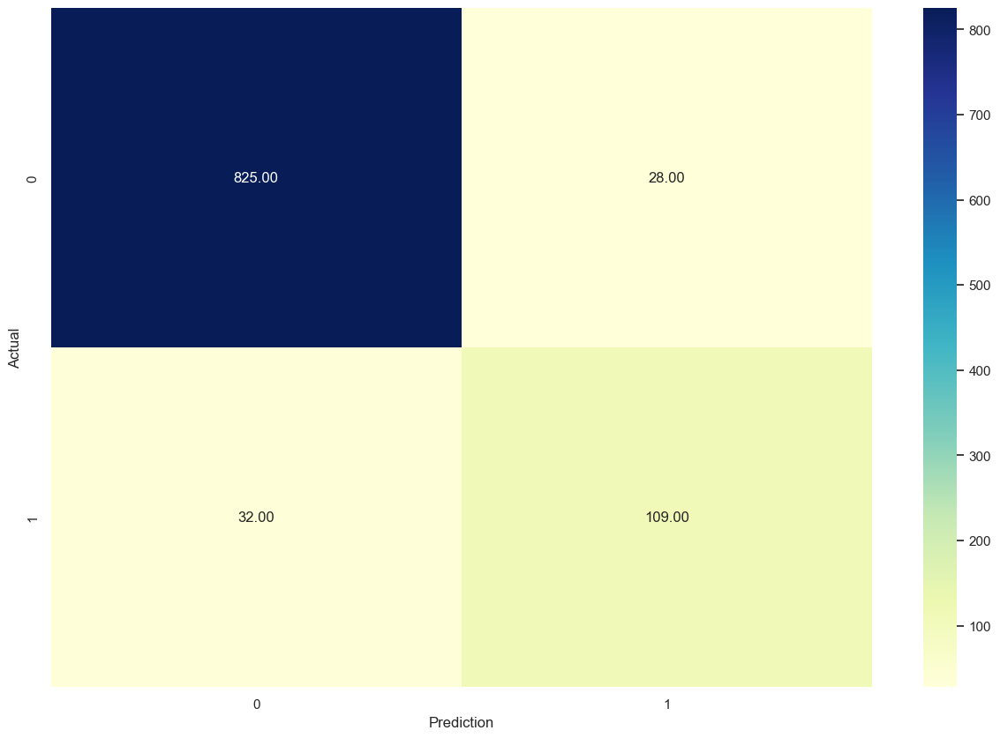

In [188]:
# training the standardized model with gridsearch params
svm_model_gsc = SVC(kernel="rbf", C=150)
svm_model_gsc.fit(x_train,y_train)
y_pred_train_svm_gsc = svm_model_gsc.predict(x_train)
y_pred_test_svm_gsc  = svm_model_gsc.predict(x_test)

# evaluation metrics
print("Training Accuracy = ",accuracy_score(y_train,y_pred_train_svm_gsc))
print("Testing Accuracy  = ",accuracy_score(y_test,y_pred_test_svm_gsc)) 
print("Confusion Matrix = ", confusion_matrix(y_test,y_pred_test_svm_gsc))
print(classification_report(y_test,y_pred_test_svm_gsc))

sns.heatmap(confusion_matrix(y_test,y_pred_test_svm_gsc), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

cl_report_svm_gsc = classification_report(y_test,y_pred_test_svm_gsc, output_dict=True)
Accu_list_tr.append(np.round(accuracy_score(y_train, y_pred_train_svm_gsc),2)) 
Accu_list_ts.append(np.round(accuracy_score(y_test,y_pred_test_svm_gsc),2)) 
F1_churn_ts.append(np.round(cl_report_svm_gsc['1']['f1-score'],2))
F1_nonchurn_ts.append(np.round(cl_report_svm_gsc['0']['f1-score'],2))

#print(Accu_list_tr)
#print(Accu_list_ts)
#print(F1_list_ts)

In [189]:
# k-fold cross validation for SVM
kfold = StratifiedKFold(n_splits=10, shuffle=True)

tr_results_kfold_svm = cross_val_score(svm_model_gsc, x_train, y_train, cv=kfold)
print("Training Accuracy\n", tr_results_kfold_svm)
Accu_kf_tr = [np.round(item,2) for item in tr_results_kfold_svm]

ts_results_kfold_svm = cross_val_score(svm_model_gsc, x_test, y_test, cv=kfold)
print("\nTesting Accuracy\n",ts_results_kfold_svm)
Accu_kf_ts = [np.round(item,2) for item in ts_results_kfold_svm]

ts_results_kfold_svm_f1 = cross_val_score(svm_model_gsc, x_test, y_test, cv=kfold, scoring='f1')
print("\nTest F1 score\n",ts_results_kfold_svm_f1)
f1_kf_ts = Accu_kf_ts = [np.round(item,2) for item in ts_results_kfold_svm_f1]

df_kfold_svm = pd.DataFrame()
df_kfold_svm = pd.DataFrame([Accu_kf_tr,Accu_kf_ts,f1_kf_ts], columns=['1','2','3','4','5','6','7','8','9','10'])
df_kfold_svm.insert(0,'SVM', ['Trainig Accuracy','Testing Accuracy','Test_overall_F1_score'])
df_kfold_svm

Training Accuracy
 [0.94  0.96  0.932 0.942 0.932 0.947 0.947 0.909 0.94  0.945]

Testing Accuracy
 [0.88  0.87  0.9   0.9   0.919 0.929 0.869 0.838 0.859 0.859]

Test F1 score
 [0.733 0.64  0.692 0.533 0.667 0.64  0.417 0.5   0.429 0.606]


,SVM,1,2,3,4,5,6,7,8,9,10
0,Trainig Accuracy,0.94,0.96,0.93,0.94,0.93,0.95,0.95,0.91,0.94,0.94
1,Testing Accuracy,0.73,0.64,0.69,0.53,0.67,0.64,0.42,0.50,0.43,0.61
2,Test_overall_F1_score,0.73,0.64,0.69,0.53,0.67,0.64,0.42,0.50,0.43,0.61


# GridsearchCV - Random Forest

In [190]:
rf_model = RandomForestClassifier(random_state=42)
rf_model_tweaked = GridSearchCV(estimator= rf_model, param_grid = { 'criterion' : ["gini", "entropy"],
                                                                   'max_depth' :[2,3,4,5,6,7],
                                                                    'n_estimators':[50,80,100,120,150],
                                                                    'min_samples_split' : [2,3,4,5]                                                                     
                                                                   })
rf_model_tweaked.fit(x_train,y_train)
print(rf_model_tweaked.best_params_)
print(rf_model_tweaked.best_score_)


{'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 50}
0.9549685534591195


Training Accuracy =  0.9738364779874213
Testing Accuracy  =  0.9456740442655935
Confusion Matrix =  [[848   5]
 [ 49  92]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       853
           1       0.95      0.65      0.77       141

    accuracy                           0.95       994
   macro avg       0.95      0.82      0.87       994
weighted avg       0.95      0.95      0.94       994



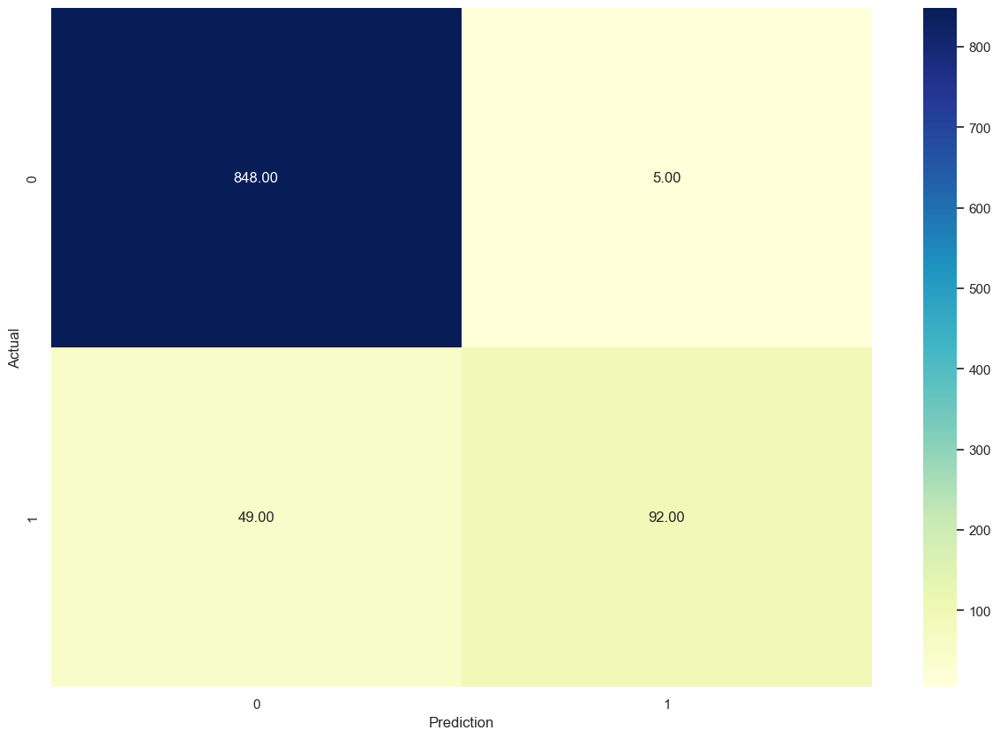

In [191]:
# training the standardized model with gridsearch params
rf_model_gsc = RandomForestClassifier(n_estimators=150, max_depth= 7, criterion='gini', min_samples_split=5)
rf_model_gsc.fit(x_train,y_train)
y_pred_train_rf_gsc = rf_model_gsc.predict(x_train)
y_pred_test_rf_gsc  = rf_model_gsc.predict(x_test)

# evaluation metrics
print("Training Accuracy = ",accuracy_score(y_train,y_pred_train_rf_gsc))
print("Testing Accuracy  = ",accuracy_score(y_test,y_pred_test_rf_gsc)) 
print("Confusion Matrix = ", confusion_matrix(y_test,y_pred_test_rf_gsc))
print(classification_report(y_test,y_pred_test_rf_gsc))

sns.heatmap(confusion_matrix(y_test,y_pred_test_rf_gsc), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

cl_report_rf_gsc = classification_report(y_test,y_pred_test_rf_gsc, output_dict=True)
Accu_list_tr.append(np.round(accuracy_score(y_train, y_pred_train_rf_gsc),2)) 
Accu_list_ts.append(np.round(accuracy_score(y_test,y_pred_test_rf_gsc),2)) 
F1_churn_ts.append(np.round(cl_report_rf_gsc['1']['f1-score'],2))
F1_nonchurn_ts.append(np.round(cl_report_rf_gsc['0']['f1-score'],2))

#print(Accu_list_tr)
#print(Accu_list_ts)
#print(F1_list_ts)

In [192]:
# k-fold cross validation for random forest
kfold = StratifiedKFold(n_splits=10, shuffle=True)

tr_results_kfold_rf = cross_val_score(rf_model_gsc, x_train, y_train, cv=kfold)
print("Training Accuracy\n", tr_results_kfold_rf)
Accu_kf_tr = [np.round(item,2) for item in tr_results_kfold_rf]

ts_results_kfold_rf = cross_val_score(rf_model_gsc, x_test, y_test, cv=kfold)
print("\nTesting Accuracy\n",ts_results_kfold_rf)
Accu_kf_ts = [np.round(item,2) for item in ts_results_kfold_rf]

ts_results_kfold_rf_f1 = cross_val_score(rf_model_gsc, x_test, y_test, cv=kfold, scoring='f1')
print("\nTest F1 score\n",ts_results_kfold_rf_f1)
f1_kf_ts = Accu_kf_ts = [np.round(item,2) for item in ts_results_kfold_rf_f1]

df_kfold_rf = pd.DataFrame()
df_kfold_rf = pd.DataFrame([Accu_kf_tr,Accu_kf_ts,f1_kf_ts], columns=['1','2','3','4','5','6','7','8','9','10'])
df_kfold_rf.insert(0,'Random_Forest', ['Trainig Accuracy','Testing Accuracy','Test_overall_F1_score'])
df_kfold_rf

Training Accuracy
 [0.962 0.952 0.945 0.955 0.937 0.962 0.965 0.96  0.95  0.945]

Testing Accuracy
 [0.92  0.89  0.91  0.93  0.929 0.929 0.899 0.899 0.929 0.909]

Test F1 score
 [0.696 0.727 0.545 0.571 0.667 0.667 0.783 0.353 0.667 0.5  ]


,Random_Forest,1,2,3,4,5,6,7,8,9,10
0,Trainig Accuracy,0.96,0.95,0.94,0.95,0.94,0.96,0.96,0.96,0.95,0.94
1,Testing Accuracy,0.70,0.73,0.55,0.57,0.67,0.67,0.78,0.35,0.67,0.50
2,Test_overall_F1_score,0.70,0.73,0.55,0.57,0.67,0.67,0.78,0.35,0.67,0.50


# GridSearchCV - XGBoost

In [193]:
#training the Smote model with Gridsearch CV for XGBoost
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'learning_rate': [0.05,0.03], # `eta` value
              'max_depth': [3,4,5,6,7,8],
              'n_estimators': [10, 50, 100, 150], #number of trees, change it to 100 for better results
             }

xgb_model = XGBClassifier()
xgb_model_tweaked = GridSearchCV(estimator= xgb_model, param_grid= parameters)
xgb_model_tweaked.fit(x_train,y_train)
print(xgb_model_tweaked.best_params_)
print(xgb_model_tweaked.best_score_)

[20:41:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:41:57] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:57] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:57] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:41:57] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:42:07] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:07] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:08] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:09] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:42:23] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:23] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:23] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:24] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:42:38] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:39] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:40] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:41] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:42:54] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:55] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:55] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:42:56] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:43:04] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:04] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:43:16] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:17] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:18] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:19] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:43:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:43:49] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training Accuracy =  0.9630188679245283
Testing Accuracy  =  0.9507042253521126
Confusion Matrix =  [[848   5]
 [ 44  97]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       853
           1       0.95      0.69      0.80       141

    accuracy                           0.95       994
   macro avg       0.95      0.84      0.89       994
weighted avg       0.95      0.95      0.95       994



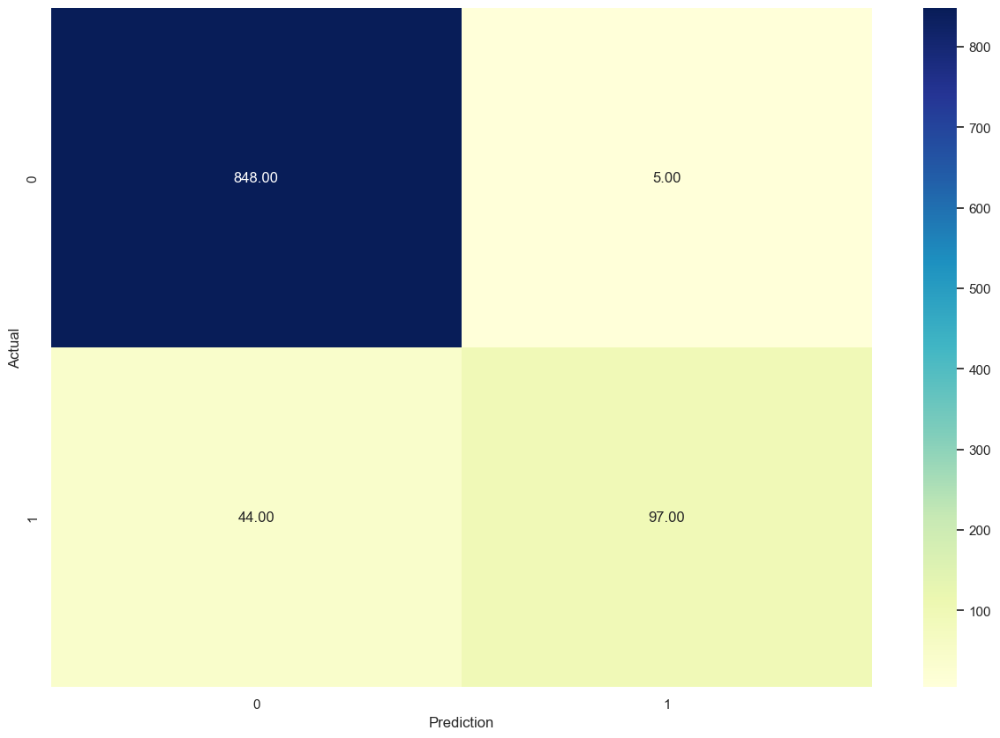

In [194]:
# training the standardized model with gridsearch params
xgb_model_gsc = XGBClassifier(n_estimators=100, max_depth= 3, learning_rate=0.05,  nthread = 4)
xgb_model_gsc.fit(x_train,y_train)
y_pred_train_xgb_gsc = xgb_model_gsc.predict(x_train)
y_pred_test_xgb_gsc  = xgb_model_gsc.predict(x_test)

# evaluation metrics
print("Training Accuracy = ",accuracy_score(y_train,y_pred_train_xgb_gsc))
print("Testing Accuracy  = ",accuracy_score(y_test,y_pred_test_xgb_gsc)) 
print("Confusion Matrix = ", confusion_matrix(y_test,y_pred_test_xgb_gsc))
print(classification_report(y_test,y_pred_test_xgb_gsc))

sns.heatmap(confusion_matrix(y_test,y_pred_test_xgb_gsc), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

cl_report_xgb_gsc = classification_report(y_test,y_pred_test_xgb_gsc, output_dict=True)
Accu_list_tr.append(np.round(accuracy_score(y_train, y_pred_train_xgb_gsc),2)) 
Accu_list_ts.append(np.round(accuracy_score(y_test,y_pred_test_xgb_gsc),2)) 
F1_churn_ts.append(np.round(cl_report_xgb_gsc['1']['f1-score'],2))
F1_nonchurn_ts.append(np.round(cl_report_xgb_gsc['0']['f1-score'],2))

In [195]:
# k-fold cross validation for XGBoost
kfold = StratifiedKFold(n_splits=10, shuffle=True)

tr_results_kfold_xgb = cross_val_score(xgb_model_gsc, x_train, y_train, cv=kfold)
print("\n\nTraining Accuracy\n ",tr_results_kfold_xgb,"\n\n")
Accu_kf_tr_xgb = [np.round(item,2) for item in tr_results_kfold_xgb]

ts_results_kfold_xgb = cross_val_score(xgb_model_gsc, x_test, y_test, cv=kfold)
print("\n\nTesting Accuracy\n ",ts_results_kfold_rf)
Accu_kf_ts_xgb = [np.round(item,2) for item in ts_results_kfold_xgb]

ts_results_kfold_xgb_f1 = cross_val_score(xgb_model_gsc, x_test, y_test, cv=kfold, scoring='f1')
print("\nTest F1 score\n",ts_results_kfold_xgb_f1)
f1_kf_ts_xgb = [np.round(item,2) for item in ts_results_kfold_xgb_f1]


[20:43:51] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:51] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:51] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:52] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:43:58] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:58] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:58] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Test F1 score
 [0.667 0.571 0.571 0.8   0.667 0.636 0.815 0.889 0.783 0.783]


# GridSearchCV - Decision Tree

In [196]:
dt_model = DecisionTreeClassifier(random_state=52)
dt_model_tweaked = GridSearchCV(estimator= dt_model, param_grid = { 'criterion' : ["gini", "entropy"],
                                                                   'max_depth' :[2,3,4,5,6,7],
                                                                    'min_samples_split' : [2,3,4,5]                                                                                                   
                                                                   })
dt_model_tweaked.fit(x_train,y_train)
print(dt_model_tweaked.best_params_)
print(dt_model_tweaked.best_score_)

{'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 5}
0.9509433962264151


Training Accuracy =  0.9506918238993711
Testing Accuracy  =  0.9305835010060363
Confusion Matrix =  [[836  17]
 [ 52  89]]
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       853
           1       0.84      0.63      0.72       141

    accuracy                           0.93       994
   macro avg       0.89      0.81      0.84       994
weighted avg       0.93      0.93      0.93       994



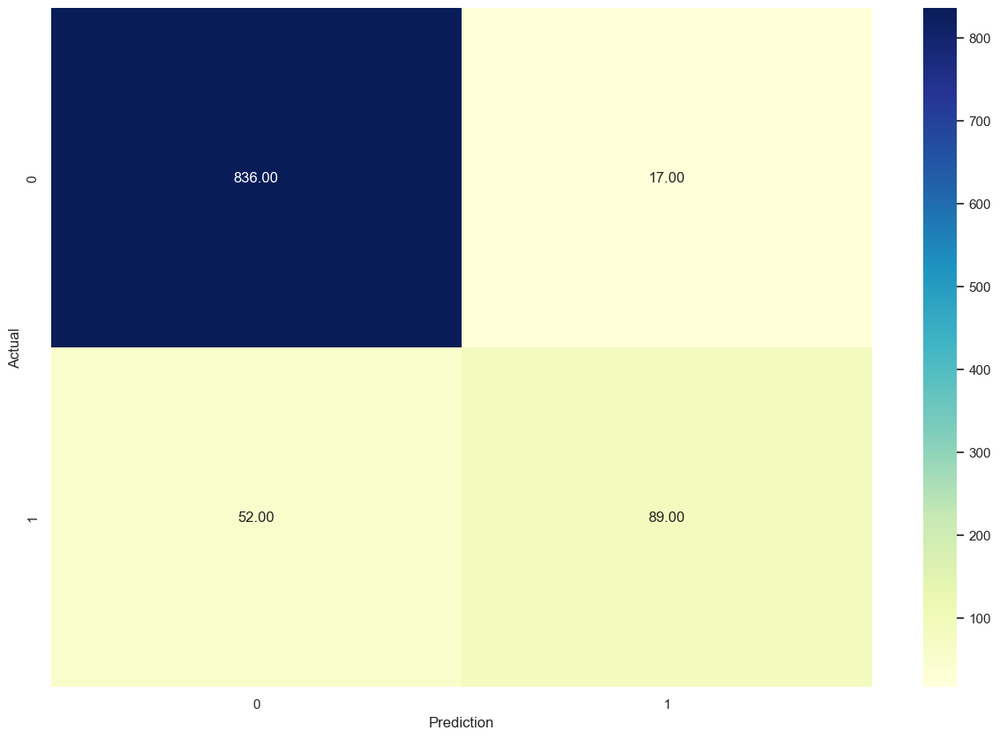

In [197]:
#training Decision Tree with Gridsearch CV best params
dt_model_gsc = DecisionTreeClassifier(max_depth= 5, criterion ='gini', min_samples_split=2, random_state=63)
dt_model_gsc.fit(x_train,y_train)
y_pred_train_dt_gsc = dt_model_gsc.predict(x_train)
y_pred_test_dt_gsc  = dt_model_gsc.predict(x_test)

# evaluation metrics
print("Training Accuracy = ",accuracy_score(y_train,y_pred_train_dt_gsc))
print("Testing Accuracy  = ",accuracy_score(y_test,y_pred_test_dt_gsc)) 
print("Confusion Matrix = ", confusion_matrix(y_test,y_pred_test_dt_gsc))
print(classification_report(y_test,y_pred_test_dt_gsc))

sns.heatmap(confusion_matrix(y_test,y_pred_test_dt_gsc), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

cl_report_dt_gsc = classification_report(y_test,y_pred_test_dt_gsc, output_dict=True)
Accu_list_tr.append(np.round(accuracy_score(y_train, y_pred_train_dt_gsc),2)) 
Accu_list_ts.append(np.round(accuracy_score(y_test, y_pred_test_dt_gsc),2)) 
F1_churn_ts.append(np.round(cl_report_dt_gsc['1']['f1-score'],2))
F1_nonchurn_ts.append(np.round(cl_report_dt_gsc['0']['f1-score'],2))

In [198]:
# k-fold cross validation for Decision Tree
kfold = StratifiedKFold(n_splits=10, shuffle=True)

tr_results_kfold_dt = cross_val_score(dt_model_gsc, x_train, y_train, cv=kfold)
print("Training Accuracy\n", tr_results_kfold_dt)
Accu_kf_tr_dt = [np.round(item,2) for item in tr_results_kfold_dt]

ts_results_kfold_dt = cross_val_score(dt_model_gsc, x_test, y_test, cv=kfold)
print("\nTesting Accuracy\n",ts_results_kfold_rf)
Accu_kf_ts_dt = [np.round(item,2) for item in ts_results_kfold_dt] 

ts_results_kfold_dt_f1 = cross_val_score(dt_model_gsc, x_test, y_test, cv=kfold, scoring='f1')
print("\nTest F1 score\n",ts_results_kfold_dt_f1)
f1_kf_ts_dt = [np.round(item,2) for item in ts_results_kfold_dt_f1] 

df_kfold_dt = pd.DataFrame()
df_kfold_dt = pd.DataFrame([Accu_kf_tr_dt,Accu_kf_ts_dt,f1_kf_ts_dt], columns=['1','2','3','4','5','6','7','8','9','10'])
df_kfold_dt.insert(0,'Decision Tree', ['Trainig Accuracy','Testing Accuracy','Test_overall_F1_score'])
df_kfold_dt

Training Accuracy
 [0.937 0.932 0.927 0.937 0.937 0.952 0.932 0.95  0.937 0.945]

Testing Accuracy
 [0.92  0.89  0.91  0.93  0.929 0.929 0.899 0.899 0.929 0.909]

Test F1 score
 [0.696 0.64  0.364 0.5   0.522 0.75  0.741 0.759 0.667 0.75 ]


,Decision Tree,1,2,3,4,5,6,7,8,9,10
0,Trainig Accuracy,0.94,0.93,0.93,0.94,0.94,0.95,0.93,0.95,0.94,0.94
1,Testing Accuracy,0.91,0.89,0.92,0.93,0.95,0.93,0.93,0.89,0.95,0.96
2,Test_overall_F1_score,0.70,0.64,0.36,0.50,0.52,0.75,0.74,0.76,0.67,0.75


# Inferences

In [199]:
print('\n\nGridsearchCV Score Table')

model_string =['SVM','RF','XGBoost','DT'] 

#print(Accu_list_tr)

df_final1['Models'] = model_string
df_final1['TR_Accu'] = Accu_list_tr
df_final1['TS_Accu']  = Accu_list_ts
df_final1['TS_churn_f1_score']   = F1_churn_ts
df_final1['TS_nonchurn_f1_score']   = F1_nonchurn_ts
df_final1



GridsearchCV Score Table


,Models,TR_Accu,TS_Accu,TS_churn_f1_score,TS_nonchurn_f1_score
0,SVM,0.99,0.94,0.78,0.96
1,RF,0.97,0.95,0.77,0.97
2,XGBoost,0.96,0.95,0.80,0.97
3,DT,0.95,0.93,0.72,0.96


In [200]:
from sklearn.model_selection import KFold,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
est = []

est.append(("Logistic Regression",LogisticRegression()))
est.append(("DT",DecisionTreeClassifier()))
est.append(("SVM",SVC()))
est.append(("NB",GaussianNB()))
est.append(("RF",RandomForestClassifier()))
est.append(("XGBoost",XGBClassifier()))

for i in range(len(est)):
    model = est[i][1]

    results = cross_val_score(model,X,y,cv=KFold(n_splits=5))

    avg = results.mean()
    sd = results.std()
    
    print("{} || avg: {} || std: {}".format(est[i][0], avg, sd))

Logistic Regression || avg: 0.8595299896053055 || std: 0.00768764444607455
DT || avg: 0.928959254013507 || std: 0.0026004519149915735
SVM || avg: 0.8651639950478298 || std: 0.012899366155082052
NB || avg: 0.8728131123093039 || std: 0.006958614009989576
RF || avg: 0.9603556890182992 || std: 0.0054125102326633
[20:44:29] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:29] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:30] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\wor

# Algorith selected = XG Boosting

In [201]:
#Gridsearch CV for XGBoost
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'learning_rate': [0.05,0.03], # `eta` value
              'max_depth': [3,4,5,6,7,8],
              'n_estimators': [10, 50, 100, 150], #number of trees, change it to 100 for better results
             }

xgb_model = XGBClassifier()
xgb_model_tweaked = GridSearchCV(estimator= xgb_model, param_grid= parameters)
xgb_model_tweaked.fit(X,y)
print(xgb_model_tweaked.best_params_)
print(xgb_model_tweaked.best_score_)

[20:44:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:44:38] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:39] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:39] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:39] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:44:49] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:50] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:51] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:45:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:05] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:45:20] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:21] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:22] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:22] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:45:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:35] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:36] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:36] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:45:44] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:44] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:44] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:45] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:45:56] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:57] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:58] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:59] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

[20:46:15] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:15] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:16] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:16] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

In [202]:
results = cross_val_score(xgb_model_gsc,X,y,cv=KFold(n_splits=5))
print(results.mean(),results.std())


[20:46:30] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:46:31] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\s

In [203]:
pre_df

,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_charge,eve_mins,eve_charge,night_mins,night_charge,customer_calls,churn
0,1,25,0,10.0,3,2.70,265.1,45.07,197.4,16.78,244.7,11.01,1,0
1,1,26,0,13.7,3,3.70,161.6,27.47,195.5,16.62,254.4,11.45,1,0
2,0,0,0,12.2,5,3.29,243.4,41.38,121.2,10.30,162.6,7.32,0,0
3,0,0,1,6.6,7,1.78,299.4,50.90,61.9,5.26,196.9,8.86,2,0
4,0,0,1,10.1,3,2.73,166.7,28.34,148.3,12.61,186.9,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1,40,0,9.9,5,2.67,235.7,40.07,223.0,18.96,297.5,13.39,2,0
4996,0,0,0,14.7,2,3.97,184.2,31.31,256.8,21.83,213.6,9.61,3,1
4997,0,0,0,13.6,4,3.67,140.6,23.90,172.8,14.69,212.4,9.56,1,0
4998,0,0,0,8.5,6,2.30,188.8,32.10,171.7,14.59,224.4,10.10,0,0


In [204]:
pre_df.columns

Index(['voice_plan', 'voice_messages', 'intl_plan', 'intl_mins', 'intl_calls',
       'intl_charge', 'day_mins', 'day_charge', 'eve_mins', 'eve_charge',
       'night_mins', 'night_charge', 'customer_calls', 'churn'],
      dtype='object')

# Conclusions
We started by cleaning the data and analyzing it with visualization. Then, to be able to build a machine learning model, we transformed the categorical data into numeric variables (feature engineering). After transforming the data, we tried 6 different machine learning algorithms using default parameters. Finally, we tuned the hyperparameters of the Gradient Boosting Classifier (best performance model) for model optimization, obtaining an accuracy of nearly 96%.

# Pickle File

In [205]:
import pickle
# creating a pickle file
filename = 'telecom_churn.sav'
pickle.dump(xgb_model_gsc,open(filename, 'wb'))

In [206]:
# loading the saved model 
loaded_model = pickle.load(open('telecom_churn.sav','rb'))